# Dataset Loading

In [ ]:
import pandas as pd
import re
from pathlib import Path

# Path to your Simplified folder in Drive
simplified_dir = Path("/content/drive/MyDrive/NeuroYOLO_IRDS (1)/SkeletonData/SkeletonData/Simplified")

# Collect all .txt skeleton files
files = sorted(list(simplified_dir.glob("*.txt")))
print(f"Found {len(files)} skeleton files")

Found 2589 skeleton files


In [ ]:
# Helper to parse the filename
def parse_filename(f):
    """
    Example filename: 101_18_0_9_1_stand.txt
    => Subject 101 | Session 18 | Gesture 0 | Repetition 9 | Correctness 1 | Posture 'stand'
    """
    name = f.stem  # remove .txt
    parts = name.split("_")
    subject = int(parts[0])
    session = int(parts[1])
    gesture = int(parts[2])
    repetition = int(parts[3])
    correctness = int(parts[4])   # 1 = correct, 2 = incorrect
    posture = parts[5]
    return subject, session, gesture, repetition, correctness, posture

In [ ]:
# Scan all files and extract metadata
records = []
for f in files:
    try:
        s, sess, g, rep, corr, pos = parse_filename(f)
        # Count frames (lines)
        with open(f) as fh:
            n_lines = sum(1 for _ in fh)
        records.append([f.name, s, sess, g, rep, corr, pos, n_lines])
    except Exception as e:
        print("Skipping:", f.name, "->", e)

In [ ]:
# Build DataFrame
df = pd.DataFrame(records, columns=[
    "filename", "subject", "session", "gesture", "repetition",
    "correctness", "posture", "n_frames"
])

# Save to Drive
out_path = simplified_dir.parent / "skeleton_index.csv"
df.to_csv(out_path, index=False)
print(f"Saved metadata index → {out_path}")
df.head(10)

Saved metadata index → /content/drive/MyDrive/NeuroYOLO_IRDS (1)/SkeletonData/SkeletonData/skeleton_index.csv


,filename,subject,session,gesture,repetition,correctness,posture,n_frames
0,101_18_0_1_1_stand.txt,101,18,0,1,1,stand,59
1,101_18_0_2_1_stand.txt,101,18,0,2,1,stand,44
2,101_18_0_3_1_stand.txt,101,18,0,3,1,stand,53
3,101_18_0_4_1_stand.txt,101,18,0,4,1,stand,57
4,101_18_0_5_1_stand.txt,101,18,0,5,1,stand,60
5,101_18_0_6_1_chair.txt,101,18,0,6,1,chair,74
6,101_18_0_7_1_chair.txt,101,18,0,7,1,chair,64
7,101_18_0_8_1_chair.txt,101,18,0,8,1,chair,62
8,101_18_0_9_1_stand.txt,101,18,0,9,1,stand,69
9,101_18_1_10_1_chair.txt,101,18,1,10,1,chair,69


In [ ]:
df["gesture"].value_counts().sort_index()

,count
gesture,
0,258
1,279
2,376
3,318
4,277
5,257
6,260
7,274
8,290


In [ ]:
df["correctness"].value_counts()

,count
correctness,
1,2047
2,530
3,12


# Section 1: Build Gesture-Wise Reference Templates

In [ ]:
import numpy as np
from tqdm import tqdm
from pathlib import Path
import pandas as pd

# --- paths ---
base_dir = Path("/content/drive/MyDrive/NeuroYOLO_IRDS (1)/SkeletonData/SkeletonData")
simplified_dir = base_dir / "Simplified"
index_path = base_dir / "skeleton_index.csv"

# --- load index ---
df = pd.read_csv(index_path)
df = df[df["correctness"] == 1]   # keep only correct trials
print(f"Using {len(df)} correct trials for reference building")

Using 2047 correct trials for reference building


In [ ]:
import numpy as np, pandas as pd
from pathlib import Path
from tqdm import tqdm
from sklearn.model_selection import GroupKFold

def load_skeleton(path):
    arr = np.loadtxt(path, delimiter=",")
    return arr.reshape(len(arr), 25, 3)

JOINT_MAP = {3:0, 4:5, 8:6, 5:7, 9:8, 6:9, 10:10, 12:11, 16:12, 13:13, 17:14, 14:15, 18:16}

def map_kinect_to_coco(seq_25):
    mapped = np.zeros((seq_25.shape[0], 17, 3), dtype=np.float32)
    for kin, coco in JOINT_MAP.items():
        mapped[:, coco, :] = seq_25[:, kin, :]
    return mapped

def normalize_length(seq, target_len=100):
    old_len = seq.shape[0]
    if old_len == target_len:
        return seq.astype(np.float32)
    new_idx = np.linspace(0, old_len - 1, target_len)
    lo = np.floor(new_idx).astype(int)
    hi = np.clip(lo + 1, 0, old_len - 1)
    a = (new_idx - lo).astype(np.float32)
    out = (1 - a)[:, None, None] * seq[lo] + a[:, None, None] * seq[hi]
    return out.astype(np.float32)

def compute_psm(a, b):
    num = np.sum(a * b, axis=2)
    den = np.linalg.norm(a, axis=2) * np.linalg.norm(b, axis=2)
    sim = np.nan_to_num(num / (den + 1e-9))
    return float(np.mean(sim))

def compute_msi(seq):
    vel = np.diff(seq, axis=0)
    acc = np.diff(vel, axis=0)
    return float(np.mean(np.linalg.norm(acc, axis=2)))

def compute_joint_deviation(seq, ref):
    d = np.linalg.norm(seq - ref, axis=2)
    return float(np.mean(d))

In [ ]:
df = pd.read_csv(index_path)

df = df[df["correctness"].isin([1, 2])].copy()
df["correctness"] = df["correctness"].replace({2: 0}).astype(int)

df["trial_id"] = df["filename"].astype(str)

print(df["correctness"].value_counts())
print("n trials:", len(df), "n subjects:", df["subject"].nunique())

correctness
1    2047
0     530
Name: count, dtype: int64
n trials: 2577 n subjects: 30


In [ ]:
USE_KEYFRAMES = True   # <-- switch this ON/OFF
TARGET_LEN = 100
K_ALIGN = 6

In [ ]:
def keyframes_energy_peaks(seq, max_k=6):
    # seq: (T,17,3)
    X = seq.reshape(seq.shape[0], -1)
    e = np.linalg.norm(np.diff(X, axis=0), axis=1)  # (T-1,)
    if e.sum() == 0:
        return seq[[0, -1]] if seq.shape[0] > 1 else seq[:1]

    # pick up to max_k-2 peak indices + always include start/end
    peak_idx = np.argsort(e)[::-1][:max(0, max_k-2)] + 1
    idx = np.unique(np.clip(np.concatenate([[0], peak_idx, [seq.shape[0]-1]]), 0, seq.shape[0]-1))
    idx = np.sort(idx)
    return seq[idx]

def resample_keyframes(kf, K=6):
    Keff = kf.shape[0]
    if Keff == K:
        return kf
    idx = np.linspace(0, Keff - 1, K)
    lo = np.floor(idx).astype(int)
    hi = np.clip(lo + 1, 0, Keff - 1)
    a = (idx - lo).astype(np.float32)[:, None, None]
    return (1 - a) * kf[lo] + a * kf[hi]

# Cache keyframes once
keyframe_cache = {}
for _, row in tqdm(df.iterrows(), total=len(df), desc="Caching keyframes"):
    tid = row["trial_id"]
    if tid in keyframe_cache:
        continue
    fpath = Path(simplified_dir) / row["filename"]
    skel = load_skeleton(fpath)
    coco = normalize_length(map_kinect_to_coco(skel), TARGET_LEN)
    kf = keyframes_energy_peaks(coco, max_k=K_ALIGN)
    kf = resample_keyframes(kf, K=K_ALIGN)
    keyframe_cache[tid] = kf

print("Cached:", len(keyframe_cache))

Caching keyframes: 100%|██████████| 2577/2577 [15:41<00:00,  2.74it/s]

Cached: 2577


In [ ]:
keyframe_cache

{'101_18_0_1_1_stand.txt': array([[[-0.1190992 ,  0.8358598 ,  2.373549  ],
         [ 0.        ,  0.        ,  0.        ],
         [ 0.        ,  0.        ,  0.        ],
         [ 0.        ,  0.        ,  0.        ],
         [ 0.        ,  0.        ,  0.        ],
         [-0.2826451 ,  0.5525576 ,  2.38421   ],
         [ 0.07524497,  0.553144  ,  2.399761  ],
         [-0.3382697 ,  0.2775677 ,  2.420022  ],
         [ 0.1186013 ,  0.2708487 ,  2.436513  ],
         [-0.375412  ,  0.05293661,  2.374334  ],
         [ 0.1649765 ,  0.03793344,  2.414768  ],
         [-0.1819979 ,  0.06820386,  2.423489  ],
         [-0.0206426 ,  0.06906635,  2.433793  ],
         [-0.2116664 , -0.3064255 ,  2.47364   ],
         [-0.01727936, -0.2969438 ,  2.485209  ],
         [-0.2238512 , -0.6361042 ,  2.534724  ],
         [-0.0388057 , -0.6281232 ,  2.546417  ]],
 
        [[-0.1240637 ,  0.83351624,  2.3479517 ],
         [ 0.        ,  0.        ,  0.        ],
         [ 0.        

In [ ]:
def build_references(train_df, simplified_dir, target_len=100, correct_only=True, min_trials=3):
    refs = {}
    for g in sorted(train_df["gesture"].unique()):
        sub = train_df[train_df["gesture"] == g]
        if correct_only:
            sub = sub[sub["correctness"] == 1]
        if len(sub) < min_trials:
            continue

        seqs = []
        for _, row in sub.iterrows():
            fpath = Path(simplified_dir) / row["filename"]
            try:
                skel = load_skeleton(fpath)
                coco = normalize_length(map_kinect_to_coco(skel), target_len)
                seqs.append(coco)
            except:
                pass

        if len(seqs) >= min_trials:
            refs[g] = np.mean(np.stack(seqs, axis=0), axis=0).astype(np.float32)
    return refs

def compute_metrics_df(split_df, refs):
    rows = []
    for _, row in split_df.iterrows():
        g = row["gesture"]
        if g not in refs:
            continue

        if USE_KEYFRAMES:
            seq = keyframe_cache[row["trial_id"]]
            ref = refs[g]
            ref_kf = resample_keyframes(keyframes_energy_peaks(ref, max_k=K_ALIGN), K=K_ALIGN)
            psm = compute_psm(seq, ref_kf)
            msi = compute_msi(seq)
            jd  = compute_joint_deviation(seq, ref_kf)
        else:
            fpath = Path(simplified_dir) / row["filename"]
            skel = load_skeleton(fpath)
            seq  = normalize_length(map_kinect_to_coco(skel), TARGET_LEN)
            ref  = refs[g]
            psm = compute_psm(seq, ref)
            msi = compute_msi(seq)
            jd  = compute_joint_deviation(seq, ref)

        rows.append({
            "trial_id": row["trial_id"],
            "filename": row["filename"],
            "subject": row["subject"],
            "gesture": g,
            "correctness": int(row["correctness"]),
            "PSM": psm, "MSI": msi, "JD": jd
        })
    return pd.DataFrame(rows)

In [ ]:
N_SPLITS = 5
gkf = GroupKFold(n_splits=N_SPLITS)

all_folds = []
for fold, (tr_idx, te_idx) in enumerate(gkf.split(df, groups=df["subject"]), start=1):
    train_df = df.iloc[tr_idx].reset_index(drop=True)
    test_df  = df.iloc[te_idx].reset_index(drop=True)

    refs = build_references(train_df, simplified_dir, target_len=TARGET_LEN, correct_only=True, min_trials=3)

    train_metrics = compute_metrics_df(train_df, refs)
    test_metrics  = compute_metrics_df(test_df,  refs)

    train_metrics["fold"] = fold
    train_metrics["split"] = "train"
    test_metrics["fold"] = fold
    test_metrics["split"] = "test"

    print(f"[Fold {fold}] refs={len(refs)} | train={len(train_metrics)} | test={len(test_metrics)}")

    all_folds.append(train_metrics)
    all_folds.append(test_metrics)

cv_metrics = pd.concat(all_folds, ignore_index=True)
cv_metrics.head()

[Fold 1] refs=9 | train=2057 | test=520
[Fold 2] refs=9 | train=2058 | test=519
[Fold 3] refs=9 | train=2067 | test=510
[Fold 4] refs=9 | train=2069 | test=508
[Fold 5] refs=9 | train=2057 | test=520


,trial_id,filename,subject,gesture,correctness,PSM,MSI,JD,fold,split
0,101_18_0_1_1_stand.txt,101_18_0_1_1_stand.txt,101,0,1,0.762997,0.018135,0.133695,1,train
1,101_18_0_2_1_stand.txt,101_18_0_2_1_stand.txt,101,0,1,0.762883,0.017590,0.136376,1,train
2,101_18_0_3_1_stand.txt,101_18_0_3_1_stand.txt,101,0,1,0.762942,0.021832,0.136913,1,train
3,101_18_0_4_1_stand.txt,101_18_0_4_1_stand.txt,101,0,1,0.762918,0.022247,0.136502,1,train
4,101_18_0_5_1_stand.txt,101_18_0_5_1_stand.txt,101,0,1,0.762905,0.022432,0.137442,1,train


In [ ]:
cv_metrics.to_csv(base_dir / "cv_metrics.csv", index=False)

In [ ]:
import pandas as pd
cv_metrics_rehab = pd.read_csv(base_dir / "cv_metrics.csv")

In [ ]:
import pandas as pd
import numpy as np
from scipy.stats import wilcoxon

df = cv_metrics_rehab.copy()

# Use only TEST repetitions
df_test = df[df["split"] == "test"].copy()

print("Total test repetitions:", len(df_test))
print(df_test["correctness"].value_counts())

Total test repetitions: 2577
correctness
1    2047
0     530
Name: count, dtype: int64


In [ ]:
summary = (
    df_test
    .groupby(["gesture", "correctness"])[["PSM", "MSI", "JD"]]
    .agg(["mean", "std", "count"])
    .reset_index()
)

summary

gesture correctness       PSM                       MSI                  \
                            mean       std count      mean       std count   
0        0           0  0.759463  0.003557    45  0.030893  0.016042    45   
1        0           1  0.760631  0.003735   213  0.028000  0.093230   213   
2        1           0  0.754993  0.009570    45  0.027048  0.022495    45   
3        1           1  0.761219  0.003028   234  0.019187  0.007524   234   
4        2           0  0.754092  0.012707   146  0.039144  0.022042   146   
5        2           1  0.760540  0.003909   229  0.040529  0.014454   229   
6        3           0  0.758406  0.008282   105  0.042650  0.030779   105   
7        3           1  0.761047  0.003943   212  0.042947  0.013838   212   
8        4           0  0.758687  0.003274    45  0.035005  0.018897    45   
9        4           1  0.760484  0.003128   230  0.050336  0.018375   230   
10       5           0  0.758282  0.003371    38  0.032561  0.013600    38   
11       5           1  0.760734  0.003576   219  0.051753  0.018071   219   
12       6           0  0.757424  0.003781    41  0.061298  0.020597    41   
13       6           1  0.760204  0.004100   217  0.089074  0.030155   217   
14       7           0  0.756832  0.006335    33  0.031266  0.019231    33   
15       7           1  0.760642  0.003615   238  0.031009  0.018142   238   
16       8           0  0.760464  0.003498    32  0.029116  0.019491    32   
17       8           1  0.760090  0.003739   255  0.034214  0.023207   255   

          JD                  
        mean       std count  
0   0.343887  0.133784    45  
1   0.315484  0.134955   213  
2   0.386774  0.237725    45  
3   0.315648  0.133216   234  
4   0.406834  0.279239   146  
5   0.305486  0.134904   229  
6   0.294994  0.206424   105  
7   0.306156  0.138422   212  
8   0.372440  0.100713    45  
9   0.313242  0.126254   230  
10  0.337083  0.097299    38  
11  0.315767  0.128002   219  
12  0.345033  0.098335    41  
13  0.318074  0.126967   217  
14  0.383641  0.102031    33  
15  0.321577  0.148559   238  
16  0.303700  0.136859    32  
17  0.351582  0.165153   255

In [ ]:
stats_rows = []

for g in sorted(df_test["gesture"].unique()):
    df_g = df_test[df_test["gesture"] == g]

    corr = df_g[df_g["correctness"] == 1]
    inc  = df_g[df_g["correctness"] == 0]

    if len(corr) > 0 and len(inc) > 0:
        # Use Wilcoxon on paired? No.
        # These are independent repetitions → use Mann–Whitney U
        from scipy.stats import mannwhitneyu

        p_psm = mannwhitneyu(corr["PSM"], inc["PSM"], alternative="two-sided").pvalue
        p_msi = mannwhitneyu(corr["MSI"], inc["MSI"], alternative="two-sided").pvalue
        p_jd  = mannwhitneyu(corr["JD"],  inc["JD"],  alternative="two-sided").pvalue

        stats_rows.append({
            "gesture": g,
            "p_psm": p_psm,
            "p_msi": p_msi,
            "p_jd": p_jd,
            "mean_psm_corr": corr["PSM"].mean(),
            "mean_psm_inc": inc["PSM"].mean(),
            "mean_msi_corr": corr["MSI"].mean(),
            "mean_msi_inc": inc["MSI"].mean(),
            "mean_jd_corr": corr["JD"].mean(),
            "mean_jd_inc": inc["JD"].mean(),
        })

stats_df = pd.DataFrame(stats_rows)
stats_df

,gesture,p_psm,p_msi,p_jd,mean_psm_corr,mean_psm_inc,mean_msi_corr,mean_msi_inc,mean_jd_corr,mean_jd_inc
0,0,3.592842e-04,6.656355e-05,0.239496,0.760631,0.759463,0.028000,0.030893,0.315484,0.343887
1,1,5.166508e-05,1.032980e-01,0.389551,0.761219,0.754993,0.019187,0.027048,0.315648,0.386774
2,2,4.601343e-01,5.707417e-02,0.098208,0.760540,0.754092,0.040529,0.039144,0.305486,0.406834
3,3,4.967264e-01,1.439205e-03,0.036467,0.761047,0.758406,0.042947,0.042650,0.306156,0.294994
4,4,1.155606e-03,1.122843e-06,0.009550,0.760484,0.758687,0.050336,0.035005,0.313242,0.372440
5,5,6.497083e-06,2.263911e-09,0.414044,0.760734,0.758282,0.051753,0.032561,0.315767,0.337083
6,6,2.475748e-08,9.298728e-08,0.125149,0.760204,0.757424,0.089074,0.061298,0.318074,0.345033
7,7,3.447487e-05,9.404875e-01,0.007221,0.760642,0.756832,0.031009,0.031266,0.321577,0.383641
8,8,8.556571e-01,2.386254e-01,0.188842,0.760090,0.760464,0.034214,0.029116,0.351582,0.303700


In [ ]:
corr_all = df_test[df_test["correctness"] == 1]
inc_all  = df_test[df_test["correctness"] == 0]

from scipy.stats import mannwhitneyu

p_psm_all = mannwhitneyu(corr_all["PSM"], inc_all["PSM"]).pvalue
p_msi_all = mannwhitneyu(corr_all["MSI"], inc_all["MSI"]).pvalue
p_jd_all  = mannwhitneyu(corr_all["JD"],  inc_all["JD"]).pvalue

print("Global PSM p:", p_psm_all)
print("Global MSI p:", p_msi_all)
print("Global JD  p:", p_jd_all)

print("Mean PSM correct vs incorrect:", corr_all["PSM"].mean(), inc_all["PSM"].mean())
print("Mean MSI correct vs incorrect:", corr_all["MSI"].mean(), inc_all["MSI"].mean())
print("Mean JD  correct vs incorrect:", corr_all["JD"].mean(),  inc_all["JD"].mean())

Global PSM p: 1.2259932753439007e-12
Global MSI p: 0.001887625212419514
Global JD  p: 0.1515549683746713
Mean PSM correct vs incorrect: 0.7606141743976778 0.7569828635116793
Mean MSI correct vs incorrect: 0.04259158736258617 0.0379053026595908
Mean JD  correct vs incorrect: 0.31867639174840484 0.35725623786730587


# Dual Attention

In [ ]:
import numpy as np

# COCO indices used in your mapping:
# 0 nose, 5 L-shoulder, 6 R-shoulder, 7 L-elbow, 8 R-elbow,
# 9 L-wrist, 10 R-wrist, 11 L-hip, 12 R-hip, 13 L-knee, 14 R-knee,
# 15 L-ankle, 16 R-ankle

def angle_abc(A, B, C, eps=1e-8):
    """
    A,B,C: (...,3)
    Returns angle at B in radians (...,)
    """
    BA = A - B
    BC = C - B
    dot = np.sum(BA * BC, axis=-1)
    n1 = np.linalg.norm(BA, axis=-1)
    n2 = np.linalg.norm(BC, axis=-1)
    cos = dot / (n1 * n2 + eps)
    cos = np.clip(cos, -1.0, 1.0)
    return np.arccos(cos)

def safe_vec(u, v, eps=1e-8):
    """Unit vector from u->v."""
    d = v - u
    n = np.linalg.norm(d, axis=-1, keepdims=True)
    return d / (n + eps)

def compute_angle_timeseries(seq):
    """
    seq: (T,17,3) COCO
    Returns: (T, A) angles in radians
    """
    T = seq.shape[0]
    S = seq  # alias

    # Points
    LS, RS = S[:,5], S[:,6]
    LE, RE = S[:,7], S[:,8]
    LW, RW = S[:,9], S[:,10]
    LH, RH = S[:,11], S[:,12]
    LK, RK = S[:,13], S[:,14]
    LA, RA = S[:,15], S[:,16]

    angles = []

    # Elbows
    angles.append(angle_abc(LS, LE, LW))  # L elbow
    angles.append(angle_abc(RS, RE, RW))  # R elbow

    # Knees
    angles.append(angle_abc(LH, LK, LA))  # L knee
    angles.append(angle_abc(RH, RK, RA))  # R knee

    # Shoulders (proxy using elbow-shoulder-hip)
    angles.append(angle_abc(LE, LS, LH))  # L shoulder proxy
    angles.append(angle_abc(RE, RS, RH))  # R shoulder proxy

    # Hips (proxy using shoulder-hip-knee)
    angles.append(angle_abc(LS, LH, LK))  # L hip proxy
    angles.append(angle_abc(RS, RH, RK))  # R hip proxy

    # Trunk lean proxies: angle between (hip->shoulder) and vertical axis
    # vertical axis = [0,1,0] in Kinect coordinates? Not guaranteed.
    # We'll use relative orientation instead: left vs right torso vectors.
    vL = safe_vec(LH, LS)  # (T,3)
    vR = safe_vec(RH, RS)
    # angle between torso vectors and their mean (captures asymmetry/lean)
    vM = safe_vec((LH+RH)/2.0, (LS+RS)/2.0)
    # angles between left/right torso vectors and mid torso
    angles.append(np.arccos(np.clip(np.sum(vL * vM, axis=-1), -1, 1)))  # torso L deviation
    angles.append(np.arccos(np.clip(np.sum(vR * vM, axis=-1), -1, 1)))  # torso R deviation

    X = np.stack(angles, axis=1)  # (T, A)
    return X.astype(np.float32)

In [ ]:
TARGET_LEN = 100

angles_cache = {}  # trial_id -> (T,A)
meta_rows = []

for _, row in tqdm(df.iterrows(), total=len(df), desc="Building angle dataset"):
    tid = row["trial_id"]
    if tid in angles_cache:
        continue

    fpath = Path(simplified_dir) / row["filename"]
    skel = load_skeleton(fpath)
    coco = map_kinect_to_coco(skel)
    coco = normalize_length(coco, TARGET_LEN)

    X = compute_angle_timeseries(coco)  # (100, A)

    angles_cache[tid] = X
    meta_rows.append({
        "trial_id": tid,
        "subject": row["subject"],
        "gesture": row["gesture"],
        "y": int(row["correctness"])
    })

meta_df = pd.DataFrame(meta_rows).drop_duplicates("trial_id").reset_index(drop=True)
print("Angle trials:", len(meta_df), "Angles per frame:", angles_cache[meta_df.loc[0,'trial_id']].shape[1])
print(meta_df["y"].value_counts())

Building angle dataset: 100%|██████████| 2577/2577 [00:16<00:00, 160.93it/s]

Angle trials: 2577 Angles per frame: 10
y
1    2047
0     530
Name: count, dtype: int64


## DA-TCN model

In [ ]:
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("device:", device)

# -------------------------
# Dataset
# -------------------------
class AngleDataset(Dataset):
    def __init__(self, meta_df, angles_cache, trial_ids):
        self.meta = meta_df[meta_df["trial_id"].isin(trial_ids)].reset_index(drop=True)
        self.cache = angles_cache

    def __len__(self):
        return len(self.meta)

    def __getitem__(self, idx):
        row = self.meta.iloc[idx]
        tid = row["trial_id"]
        X = self.cache[tid]  # (T=100, A=10)
        y = int(row["y"])
        # torch expects float32
        X = torch.from_numpy(X).float()          # (T,A)
        y = torch.tensor(y).long()
        return X, y, tid


# -------------------------
# Model blocks
# -------------------------
class Chomp1d(nn.Module):
    """Keeps causal conv output length = input length."""
    def __init__(self, chomp_size):
        super().__init__()
        self.chomp_size = chomp_size
    def forward(self, x):
        return x[:, :, :-self.chomp_size] if self.chomp_size > 0 else x

class TemporalBlock(nn.Module):
    """TCN residual block with causal dilated convs."""
    def __init__(self, in_ch, out_ch, k=3, d=1, dropout=0.1):
        super().__init__()
        padding = (k - 1) * d

        self.conv1 = nn.Conv1d(in_ch, out_ch, kernel_size=k, dilation=d, padding=padding)
        self.chomp1 = Chomp1d(padding)
        self.act1 = nn.ReLU()
        self.drop1 = nn.Dropout(dropout)

        self.conv2 = nn.Conv1d(out_ch, out_ch, kernel_size=k, dilation=d, padding=padding)
        self.chomp2 = Chomp1d(padding)
        self.act2 = nn.ReLU()
        self.drop2 = nn.Dropout(dropout)

        self.down = nn.Conv1d(in_ch, out_ch, 1) if in_ch != out_ch else None
        self.act_out = nn.ReLU()

    def forward(self, x):
        # x: (B,C,T)
        y = self.drop1(self.act1(self.chomp1(self.conv1(x))))
        y = self.drop2(self.act2(self.chomp2(self.conv2(y))))
        res = x if self.down is None else self.down(x)
        return self.act_out(y + res)

class DualAttentionTCN(nn.Module):
    """
    DA-TCN:
    - Angle attention: learns beta over A angles (feature-wise gate)
    - TCN over time
    - Temporal attention: learns alpha over T frames (attention pooling)
    - Classifier head
    Returns: logits, alpha (B,T), beta (B,A)
    """
    def __init__(self, A=10, T=100, hidden=64, levels=4, k=3, dropout=0.15):
        super().__init__()
        self.A = A
        self.T = T

        # Angle-attention (feature gate):
        # compute beta from a global summary of the sequence
        self.beta_mlp = nn.Sequential(
            nn.Linear(A, 32),
            nn.ReLU(),
            nn.Linear(32, A)
        )

        # Input projection to hidden channels
        self.in_proj = nn.Conv1d(A, hidden, kernel_size=1)

        # TCN stack
        blocks = []
        for i in range(levels):
            d = 2 ** i
            blocks.append(TemporalBlock(hidden, hidden, k=k, d=d, dropout=dropout))
        self.tcn = nn.Sequential(*blocks)

        # Temporal attention (frame importance)
        self.alpha_fc = nn.Linear(hidden, 1)

        # Classifier
        self.head = nn.Sequential(
            nn.Linear(hidden, 64),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(64, 2)
        )

    def forward(self, X):
        """
        X: (B,T,A)
        """
        B, T, A = X.shape

        # -------- Angle attention (beta) --------
        # global summary per angle: mean over time
        s = X.mean(dim=1)                 # (B,A)
        beta_logits = self.beta_mlp(s)    # (B,A)
        beta = torch.softmax(beta_logits, dim=1)  # (B,A), sums to 1

        # apply feature gate (broadcast over time)
        Xg = X * beta.unsqueeze(1)        # (B,T,A)

        # -------- TCN --------
        h = Xg.permute(0, 2, 1)           # (B,A,T)
        h = self.in_proj(h)               # (B,H,T)
        h = self.tcn(h)                   # (B,H,T)

        # -------- Temporal attention (alpha) --------
        ht = h.permute(0, 2, 1)           # (B,T,H)
        alpha_logits = self.alpha_fc(ht).squeeze(-1)  # (B,T)
        alpha = torch.softmax(alpha_logits, dim=1)    # (B,T), sums to 1

        # attention pooling
        z = torch.sum(ht * alpha.unsqueeze(-1), dim=1)  # (B,H)

        logits = self.head(z)             # (B,2)
        return logits, alpha, beta

device: cuda


## Optuna Optimized

In [ ]:
!pip install optuna --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 413.9/413.9 kB 12.2 MB/s eta 0:00:00


In [ ]:
try:
    import optuna
    OPTUNA_OK = True
    print("Optuna available ✅")
except Exception as e:
    OPTUNA_OK = False
    print("Optuna not available ❌ -> will use random search fallback.")

Optuna available ✅


In [ ]:
def pm(x):
    return f"{np.nanmean(x):.3f} ± {np.nanstd(x):.3f}"

In [ ]:
import random, math
import numpy as np
import torch
from sklearn.model_selection import GroupKFold, GroupShuffleSplit
from sklearn.metrics import balanced_accuracy_score, roc_auc_score

def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

set_seed(42)

def make_loaders_from_meta(meta_df, angles_cache, trial_ids, batch, shuffle):
    ds = AngleDataset(meta_df, angles_cache, trial_ids)
    loader = DataLoader(ds, batch_size=batch, shuffle=shuffle, drop_last=False)
    return loader, ds

def train_eval_once(meta_df, angles_cache, tr_ids, val_ids, params, epochs=40):
    # build loaders
    train_loader, _ = make_loaders_from_meta(meta_df, angles_cache, tr_ids, batch=params["batch"], shuffle=True)
    val_loader, _   = make_loaders_from_meta(meta_df, angles_cache, val_ids, batch=params["batch"], shuffle=False)

    model = DualAttentionTCN(
        A=10, T=100,
        hidden=params["hidden"],
        levels=params["levels"],
        k=params["kernel"],
        dropout=params["dropout"]
    )

    # class-weighted loss from TRAIN labels
    ys = []
    for _, y, _ in train_loader:
        ys.append(y.numpy())
    y_all = np.concatenate(ys)
    pos = (y_all == 1).sum()
    neg = (y_all == 0).sum()
    w0 = (pos + neg) / (2 * max(neg, 1))
    w1 = (pos + neg) / (2 * max(pos, 1))
    loss_fn = nn.CrossEntropyLoss(weight=torch.tensor([w0, w1], dtype=torch.float32).to(device))

    model = model.to(device)
    opt = torch.optim.AdamW(model.parameters(), lr=params["lr"], weight_decay=params["wd"])

    best_bal = -1.0
    best_state = None
    patience = 6
    bad = 0

    for ep in range(epochs):
        model.train()
        for X, y, _ in train_loader:
            X, y = X.to(device), y.to(device)
            opt.zero_grad()
            logits, _, _ = model(X)
            loss = loss_fn(logits, y)
            loss.backward()
            nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            opt.step()

        # validate
        model.eval()
        y_true, y_hat, p1 = [], [], []
        with torch.no_grad():
            for X, y, _ in val_loader:
                X = X.to(device)
                logits, _, _ = model(X)
                prob1 = torch.softmax(logits, dim=1)[:, 1].cpu().numpy()
                pred = torch.argmax(logits, dim=1).cpu().numpy()
                y_true.append(y.numpy()); y_hat.append(pred); p1.append(prob1)

        y_true = np.concatenate(y_true)
        y_hat  = np.concatenate(y_hat)
        p1     = np.concatenate(p1)

        if len(np.unique(y_true)) < 2:
            # degenerate val (rare); treat as low score
            bal = 0.5
            auc = 0.5
        else:
            bal = balanced_accuracy_score(y_true, y_hat)
            auc = roc_auc_score(y_true, p1)

        # choose optimization target (balanced acc is safer under imbalance)
        score = bal

        if score > best_bal + 1e-4:
            best_bal = score
            best_state = {k: v.detach().cpu().clone() for k, v in model.state_dict().items()}
            bad = 0
        else:
            bad += 1
            if bad >= patience:
                break

    # restore best and return best_bal (on val)
    if best_state is not None:
        model.load_state_dict(best_state)
    return best_bal


def sample_params_optuna(trial):
    return {
        "hidden": trial.suggest_categorical("hidden", [32, 64, 96, 128]),
        "levels": trial.suggest_categorical("levels", [3, 4, 5]),
        "kernel": trial.suggest_categorical("kernel", [3, 5, 7]),
        "dropout": trial.suggest_float("dropout", 0.05, 0.35),
        "lr": trial.suggest_float("lr", 1e-4, 3e-3, log=True),
        "wd": trial.suggest_float("wd", 1e-6, 1e-3, log=True),
        "batch": trial.suggest_categorical("batch", [32, 64, 128]),
    }


def tune_params_for_fold(meta_train, angles_cache, n_trials=25, seed=42):
    # inner split by subject
    gss = GroupShuffleSplit(n_splits=1, test_size=0.2, random_state=seed)
    inner_tr_idx, inner_val_idx = next(gss.split(meta_train, groups=meta_train["subject"]))

    inner_tr = meta_train.iloc[inner_tr_idx].reset_index(drop=True)
    inner_val = meta_train.iloc[inner_val_idx].reset_index(drop=True)

    tr_ids = inner_tr["trial_id"].tolist()
    val_ids = inner_val["trial_id"].tolist()

    if OPTUNA_OK:
        def objective(trial):
            params = sample_params_optuna(trial)
            score = train_eval_once(meta_train, angles_cache, tr_ids, val_ids, params, epochs=40)
            return score

        sampler = optuna.samplers.TPESampler(seed=seed)
        study = optuna.create_study(direction="maximize", sampler=sampler)
        study.optimize(objective, n_trials=n_trials, show_progress_bar=True)

        best_params = study.best_params
        # optuna returns ints as ints already
        return best_params, study.best_value

    # fallback: random search (still defensible if you say "random search")
    best_params, best_score = None, -1
    rng = np.random.RandomState(seed)

    space = {
        "hidden": [32, 64, 96, 128],
        "levels": [3, 4, 5],
        "kernel": [3, 5, 7],
        "batch": [32, 64, 128],
    }

    for _ in range(n_trials):
        params = {
            "hidden": int(rng.choice(space["hidden"])),
            "levels": int(rng.choice(space["levels"])),
            "kernel": int(rng.choice(space["kernel"])),
            "batch": int(rng.choice(space["batch"])),
            "dropout": float(rng.uniform(0.05, 0.35)),
            "lr": float(10 ** rng.uniform(math.log10(1e-4), math.log10(3e-3))),
            "wd": float(10 ** rng.uniform(math.log10(1e-6), math.log10(1e-3))),
        }
        score = train_eval_once(meta_train, angles_cache, tr_ids, val_ids, params, epochs=40)
        if score > best_score:
            best_score = score
            best_params = params

    return best_params, best_score

In [ ]:
from sklearn.metrics import confusion_matrix, f1_score, roc_auc_score

def train_final_and_eval(meta_train, meta_test, angles_cache, params, epochs=60):
    train_loader, _ = make_loaders_from_meta(meta_df, angles_cache, meta_train["trial_id"].tolist(), batch=params["batch"], shuffle=True)
    test_loader, test_ds = make_loaders_from_meta(meta_df, angles_cache, meta_test["trial_id"].tolist(), batch=params["batch"], shuffle=False)

    model = DualAttentionTCN(A=10, T=100, hidden=params["hidden"], levels=params["levels"], k=params["kernel"], dropout=params["dropout"]).to(device)

    # class-weighted CE
    ys = []
    for _, y, _ in train_loader:
        ys.append(y.numpy())
    y_all = np.concatenate(ys)
    pos = (y_all == 1).sum()
    neg = (y_all == 0).sum()
    w0 = (pos + neg) / (2 * max(neg, 1))
    w1 = (pos + neg) / (2 * max(pos, 1))
    loss_fn = nn.CrossEntropyLoss(weight=torch.tensor([w0, w1], dtype=torch.float32).to(device))

    opt = torch.optim.AdamW(model.parameters(), lr=params["lr"], weight_decay=params["wd"])

    best_bal = -1.0
    best_state = None
    patience = 8
    bad = 0

    for ep in range(epochs):
        model.train()
        for X, y, _ in train_loader:
            X, y = X.to(device), y.to(device)
            opt.zero_grad()
            logits, _, _ = model(X)
            loss = loss_fn(logits, y)
            loss.backward()
            nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            opt.step()

        # optional: light early stopping using train predictions (no val now)
        # We’ll keep it simple: no stopping, or you can reuse an inner-val split.
        # If you want stopping without leakage, keep a small val split here too.
        # For now: train full epochs.

    # eval
    model.eval()
    y_true, y_hat, p1 = [], [], []
    with torch.no_grad():
        for X, y, _ in test_loader:
            X = X.to(device)
            logits, _, _ = model(X)
            prob1 = torch.softmax(logits, dim=1)[:, 1].cpu().numpy()
            pred = torch.argmax(logits, dim=1).cpu().numpy()
            y_true.append(y.numpy()); y_hat.append(pred); p1.append(prob1)

    y_true = np.concatenate(y_true)
    y_hat  = np.concatenate(y_hat)
    p1     = np.concatenate(p1)

    bal = balanced_accuracy_score(y_true, y_hat)
    f1  = f1_score(y_true, y_hat)
    auc = roc_auc_score(y_true, p1) if len(np.unique(y_true)) == 2 else np.nan
    cm  = confusion_matrix(y_true, y_hat)

    return {"bal_acc": bal, "f1": f1, "auc": auc, "cm": cm, "n_test": len(test_ds)}, model

## Attention Extraction: Biomechanical Failure Signatures via Dual Attention

## Section A: Attention extraction + aggregation

### A1) Re-run outer CV loop but store models + test IDs

In [ ]:
from sklearn.model_selection import GroupKFold

gkf = GroupKFold(n_splits=5)

fold_reports = []
best_params_per_fold = []
fold_models = {}
fold_splits = {}   # fold -> {"train_ids": [...], "test_ids":[...], "train_meta":..., "test_meta":...}

for fold, (tr_idx, te_idx) in enumerate(gkf.split(meta_df, groups=meta_df["subject"]), start=1):
    meta_train = meta_df.iloc[tr_idx].reset_index(drop=True)
    meta_test  = meta_df.iloc[te_idx].reset_index(drop=True)

    best_params, best_val_score = tune_params_for_fold(meta_train, angles_cache, n_trials=25, seed=42+fold)
    best_params_per_fold.append({"fold": fold, "best_val_bal": best_val_score, **best_params})

    rep, model = train_final_and_eval(meta_train, meta_test, angles_cache, best_params, epochs=60)
    rep["fold"] = fold
    fold_reports.append(rep)

    fold_models[fold] = model
    fold_splits[fold] = {
        "train_ids": meta_train["trial_id"].tolist(),
        "test_ids": meta_test["trial_id"].tolist(),
        "train_meta": meta_train,
        "test_meta": meta_test,
        "best_params": best_params,
        "best_val_bal": best_val_score
    }

    print(f"\n[Fold {fold}] tuned_val_bal={best_val_score:.3f}")
    print("best_params:", best_params)
    print(f"TEST bal={rep['bal_acc']:.3f} f1={rep['f1']:.3f} auc={rep['auc']:.3f} n={rep['n_test']}")
    print("CM:\n", rep["cm"])

fold_df = pd.DataFrame(fold_reports)
param_df = pd.DataFrame(best_params_per_fold)
fold_df, param_df

[I 2026-02-17 13:21:08,410] A new study created in memory with name: no-name-7696fab9-9568-45cf-aec4-5b0985db1242


  0%|          | 0/25 [00:00<?, ?it/s]

[I 2026-02-17 13:21:22,132] Trial 0 finished with value: 0.7621056538413955 and parameters: {'hidden': 64, 'levels': 4, 'kernel': 7, 'dropout': 0.16848500552930173, 'lr': 0.0015301036326297482, 'wd': 5.797801971205838e-06, 'batch': 64}. Best is trial 0 with value: 0.7621056538413955.
[I 2026-02-17 13:21:28,279] Trial 1 finished with value: 0.6846715328467153 and parameters: {'hidden': 128, 'levels': 4, 'kernel': 3, 'dropout': 0.07475001490914662, 'lr': 0.0021140895528054034, 'wd': 7.834485878135568e-06, 'batch': 128}. Best is trial 0 with value: 0.7621056538413955.
[I 2026-02-17 13:21:32,837] Trial 2 finished with value: 0.7371891624396882 and parameters: {'hidden': 96, 'levels': 3, 'kernel': 5, 'dropout': 0.30950513618215447, 'lr': 0.000983755891916399, 'wd': 7.697636301173465e-05, 'batch': 64}. Best is trial 0 with value: 0.7621056538413955.
[I 2026-02-17 13:21:37,670] Trial 3 finished with value: 0.6766918223431895 and parameters: {'hidden': 64, 'levels': 5, 'kernel': 7, 'dropout': 

[I 2026-02-17 13:24:32,122] A new study created in memory with name: no-name-b51a003b-0c88-4016-9fbc-c3287f278351



[Fold 1] tuned_val_bal=0.809
best_params: {'hidden': 32, 'levels': 4, 'kernel': 5, 'dropout': 0.33246627312749505, 'lr': 0.0014046517314414662, 'wd': 4.422680280423064e-06, 'batch': 32}
TEST bal=0.812 f1=0.884 auc=0.889 n=520
CM:
 [[100  30]
 [ 57 333]]


  0%|          | 0/25 [00:00<?, ?it/s]

[I 2026-02-17 13:24:42,003] Trial 0 finished with value: 0.8432391138273492 and parameters: {'hidden': 32, 'levels': 4, 'kernel': 7, 'dropout': 0.3381578675617002, 'lr': 0.00047259023683234096, 'wd': 1.9184680159538708e-05, 'batch': 128}. Best is trial 0 with value: 0.8432391138273492.
[I 2026-02-17 13:24:44,957] Trial 1 finished with value: 0.5839572192513369 and parameters: {'hidden': 32, 'levels': 3, 'kernel': 3, 'dropout': 0.3088023008110878, 'lr': 0.0001659077362770727, 'wd': 4.8848347275485485e-05, 'batch': 64}. Best is trial 0 with value: 0.8432391138273492.
[I 2026-02-17 13:24:53,897] Trial 2 finished with value: 0.8297173414820473 and parameters: {'hidden': 128, 'levels': 3, 'kernel': 5, 'dropout': 0.3147834745789639, 'lr': 0.0011816134776603154, 'wd': 0.00031629959608777834, 'batch': 128}. Best is trial 0 with value: 0.8432391138273492.
[I 2026-02-17 13:24:56,484] Trial 3 finished with value: 0.7049656226126815 and parameters: {'hidden': 32, 'levels': 5, 'kernel': 5, 'dropout

[I 2026-02-17 13:29:28,377] A new study created in memory with name: no-name-052a8dee-97a5-49ca-9f74-1c78454593ab



[Fold 2] tuned_val_bal=0.910
best_params: {'hidden': 96, 'levels': 3, 'kernel': 7, 'dropout': 0.16454252753104792, 'lr': 0.0020361050064626796, 'wd': 1.347987797412184e-06, 'batch': 32}
TEST bal=0.650 f1=0.879 auc=0.818 n=519
CM:
 [[ 43  69]
 [ 34 373]]


  0%|          | 0/25 [00:00<?, ?it/s]

[I 2026-02-17 13:29:34,562] Trial 0 finished with value: 0.6996650906225375 and parameters: {'hidden': 32, 'levels': 4, 'kernel': 7, 'dropout': 0.3068546145786873, 'lr': 0.0009125992424601813, 'wd': 0.0009379183965007395, 'batch': 64}. Best is trial 0 with value: 0.6996650906225375.
[I 2026-02-17 13:29:39,096] Trial 1 finished with value: 0.6043144208037825 and parameters: {'hidden': 32, 'levels': 3, 'kernel': 3, 'dropout': 0.29566202826961296, 'lr': 0.00012885633599480425, 'wd': 0.0005880965302451701, 'batch': 64}. Best is trial 0 with value: 0.6996650906225375.
[I 2026-02-17 13:30:00,485] Trial 2 finished with value: 0.7884160756501182 and parameters: {'hidden': 96, 'levels': 4, 'kernel': 5, 'dropout': 0.2977261896491616, 'lr': 0.0004646931028398849, 'wd': 1.9160938956947734e-06, 'batch': 32}. Best is trial 2 with value: 0.7884160756501182.
[I 2026-02-17 13:30:02,055] Trial 3 finished with value: 0.5211780929866037 and parameters: {'hidden': 32, 'levels': 3, 'kernel': 5, 'dropout': 0

[I 2026-02-17 13:34:48,214] A new study created in memory with name: no-name-212961f9-40e1-44c5-87c8-540cb6c219b2



[Fold 3] tuned_val_bal=0.793
best_params: {'hidden': 96, 'levels': 4, 'kernel': 5, 'dropout': 0.2629912919908664, 'lr': 0.00048711438155340766, 'wd': 6.203592723466179e-06, 'batch': 32}
TEST bal=0.696 f1=0.945 auc=0.850 n=510
CM:
 [[ 10  11]
 [ 41 448]]


  0%|          | 0/25 [00:00<?, ?it/s]

[I 2026-02-17 13:34:52,984] Trial 0 finished with value: 0.6886990407673861 and parameters: {'hidden': 32, 'levels': 4, 'kernel': 5, 'dropout': 0.2023803022111375, 'lr': 0.00013348096715085585, 'wd': 1.9012944181687062e-05, 'batch': 64}. Best is trial 0 with value: 0.6886990407673861.
[I 2026-02-17 13:35:01,488] Trial 1 finished with value: 0.6315947242206235 and parameters: {'hidden': 64, 'levels': 4, 'kernel': 7, 'dropout': 0.1685436044309181, 'lr': 0.00028462482817605007, 'wd': 4.605782327409013e-06, 'batch': 32}. Best is trial 0 with value: 0.6886990407673861.
[I 2026-02-17 13:35:11,135] Trial 2 finished with value: 0.6967925659472421 and parameters: {'hidden': 64, 'levels': 5, 'kernel': 3, 'dropout': 0.06741539486487584, 'lr': 0.0013068010490386518, 'wd': 1.562459015434422e-06, 'batch': 32}. Best is trial 2 with value: 0.6967925659472421.
[I 2026-02-17 13:35:23,333] Trial 3 finished with value: 0.6822541966426858 and parameters: {'hidden': 128, 'levels': 5, 'kernel': 5, 'dropout':

[I 2026-02-17 13:37:34,468] A new study created in memory with name: no-name-0233a08e-ecd7-4070-b2bc-f169f1156ae4



[Fold 4] tuned_val_bal=0.843
best_params: {'hidden': 128, 'levels': 4, 'kernel': 3, 'dropout': 0.34626668523732157, 'lr': 0.0017353851671657865, 'wd': 0.00010944247706897117, 'batch': 64}
TEST bal=0.772 f1=0.794 auc=0.856 n=508
CM:
 [[110  19]
 [117 262]]


  0%|          | 0/25 [00:00<?, ?it/s]

[I 2026-02-17 13:37:37,317] Trial 0 finished with value: 0.38215102974828374 and parameters: {'hidden': 64, 'levels': 4, 'kernel': 5, 'dropout': 0.1267977293893887, 'lr': 0.0001085094798265882, 'wd': 1.977779470395541e-06, 'batch': 64}. Best is trial 0 with value: 0.38215102974828374.
[I 2026-02-17 13:37:44,019] Trial 1 finished with value: 0.7056636155606407 and parameters: {'hidden': 64, 'levels': 3, 'kernel': 5, 'dropout': 0.21590771127036462, 'lr': 0.0024068923944079385, 'wd': 3.450409089645336e-05, 'batch': 64}. Best is trial 1 with value: 0.7056636155606407.
[I 2026-02-17 13:37:46,663] Trial 2 finished with value: 0.41647597254004576 and parameters: {'hidden': 128, 'levels': 3, 'kernel': 5, 'dropout': 0.10239090417594274, 'lr': 0.0003410458648755993, 'wd': 2.63358170052725e-06, 'batch': 128}. Best is trial 1 with value: 0.7056636155606407.
[I 2026-02-17 13:37:56,017] Trial 3 finished with value: 0.7617276887871853 and parameters: {'hidden': 96, 'levels': 4, 'kernel': 3, 'dropout'

(    bal_acc        f1       auc                       cm  n_test  fold
 0  0.811538  0.884462  0.889389   [[100, 30], [57, 333]]     520     1
 1  0.650195  0.878681  0.818116    [[43, 69], [34, 373]]     519     2
 2  0.696173  0.945148  0.850424    [[10, 11], [41, 448]]     510     3
 3  0.772003  0.793939  0.856190  [[110, 19], [117, 262]]     508     4
 4  0.805448  0.922500  0.952273    [[89, 49], [13, 369]]     520     5,
    fold  best_val_bal  hidden  levels  kernel   dropout        lr        wd  \
 0     1      0.808512      32       4       5  0.332466  0.001405  0.000004   
 1     2      0.909549      96       3       7  0.164543  0.002036  0.000001   
 2     3      0.792750      96       4       5  0.262991  0.000487  0.000006   
 3     4      0.842776     128       4       3  0.346267  0.001735  0.000109   
 4     5      0.775458      96       3       7  0.169403  0.001661  0.000007   
 
    batch  
 0     32  
 1     32  
 2     32  
 3     64  
 4     64  )

In [ ]:
fold_df

,bal_acc,f1,auc,cm,n_test,fold
0,0.811538,0.884462,0.889389,"[[100, 30], [57, 333]]",520,1
1,0.650195,0.878681,0.818116,"[[43, 69], [34, 373]]",519,2
2,0.696173,0.945148,0.850424,"[[10, 11], [41, 448]]",510,3
3,0.772003,0.793939,0.856190,"[[110, 19], [117, 262]]",508,4
4,0.805448,0.922500,0.952273,"[[89, 49], [13, 369]]",520,5


In [ ]:
param_df

,fold,best_val_bal,hidden,levels,kernel,dropout,lr,wd,batch
0,1,0.808512,32,4,5,0.332466,0.001405,0.000004,32
1,2,0.909549,96,3,7,0.164543,0.002036,0.000001,32
2,3,0.792750,96,4,5,0.262991,0.000487,0.000006,32
3,4,0.842776,128,4,3,0.346267,0.001735,0.000109,64
4,5,0.775458,96,3,7,0.169403,0.001661,0.000007,64


In [ ]:
fold_df.to_csv("/content/drive/MyDrive/NeuroYOLO_IRDS (1)/fold_reports.csv", index=False)

In [ ]:
param_df.to_csv("/content/drive/MyDrive/NeuroYOLO_IRDS (1)/best_params_per_fold.csv", index=False)

### A2) Extract attention for each fold test set

In [ ]:
ANGLE_NAMES = [
    "L_elbow", "R_elbow",
    "L_knee", "R_knee",
    "L_shoulder", "R_shoulder",
    "L_hip", "R_hip",
    "torso_L_dev", "torso_R_dev"
]

def get_test_attention_for_fold(fold, batch=128):
    model = fold_models[fold].to(device)
    model.eval()

    test_ids = fold_splits[fold]["test_ids"]
    test_ds = AngleDataset(meta_df, angles_cache, test_ids)
    test_loader = DataLoader(test_ds, batch_size=batch, shuffle=False, drop_last=False)

    rows = []
    with torch.no_grad():
        for X, y, tids in test_loader:
            X = X.to(device)
            logits, alpha, beta = model(X)    # logits (B,2), alpha(B,T), beta(B,A)

            p1 = torch.softmax(logits, dim=1)[:, 1].cpu().numpy()
            y_hat = torch.argmax(logits, dim=1).cpu().numpy()

            alpha_np = alpha.cpu().numpy()  # (B,100)
            beta_np  = beta.cpu().numpy()   # (B,10)

            y_np = y.numpy()
            tids = list(tids)

            for i in range(len(tids)):
                r = {
                    "fold": fold,
                    "trial_id": tids[i],
                    "y_true": int(y_np[i]),
                    "y_hat": int(y_hat[i]),
                    "p_correct": float(p1[i])
                }
                # beta
                for a, name in enumerate(ANGLE_NAMES):
                    r[f"beta_{name}"] = float(beta_np[i, a])
                # alpha
                for t in range(alpha_np.shape[1]):
                    r[f"alpha_t{t:03d}"] = float(alpha_np[i, t])
                rows.append(r)

    return pd.DataFrame(rows)

att_dfs = []
for fold in range(1, 6):
    print("Extracting fold", fold)
    att_dfs.append(get_test_attention_for_fold(fold, batch=256))

att_df = pd.concat(att_dfs, axis=0).reset_index(drop=True)
print("att_df shape:", att_df.shape)
att_df.head()

Extracting fold 1
Extracting fold 2
Extracting fold 3
Extracting fold 4
Extracting fold 5
att_df shape: (2577, 115)


,fold,trial_id,y_true,y_hat,p_correct,beta_L_elbow,beta_R_elbow,beta_L_knee,beta_R_knee,beta_L_shoulder,...,alpha_t090,alpha_t091,alpha_t092,alpha_t093,alpha_t094,alpha_t095,alpha_t096,alpha_t097,alpha_t098,alpha_t099
0,1,104_18_0_1_1_stand.txt,1,1,0.999793,0.100275,0.197894,0.033117,0.058106,0.320069,...,0.025153,0.022188,0.019443,0.016946,0.014446,0.011664,0.009311,0.007396,0.005872,0.004741
1,1,104_18_0_2_1_stand.txt,1,1,0.999921,0.102658,0.198003,0.032198,0.059535,0.324478,...,0.045850,0.044800,0.041428,0.038590,0.035489,0.032114,0.028356,0.024570,0.021161,0.018280
2,1,104_18_0_3_1_stand.txt,1,1,0.997605,0.110649,0.201218,0.032694,0.059898,0.306725,...,0.030438,0.027934,0.024217,0.021478,0.018935,0.015900,0.013360,0.011237,0.009791,0.008135
3,1,104_18_0_4_1_stand.txt,1,1,0.999722,0.105595,0.200467,0.032622,0.059182,0.314048,...,0.031413,0.028316,0.023915,0.021138,0.018689,0.016484,0.013604,0.011492,0.009104,0.007268
4,1,104_18_0_5_1_stand.txt,1,1,0.999471,0.107243,0.203885,0.032871,0.058187,0.304507,...,0.020525,0.018404,0.015216,0.012867,0.010379,0.008542,0.006528,0.005180,0.004390,0.004070


### A3) Aggregate explanations (this is what goes into the paper)

In [ ]:
beta_cols = [f"beta_{n}" for n in ANGLE_NAMES]

beta_summary = att_df.groupby("y_true")[beta_cols].mean().T
beta_summary.columns = ["mean_beta_incorrect", "mean_beta_correct"]  # because y_true: 0/1
beta_summary["delta(correct - incorrect)"] = beta_summary["mean_beta_correct"] - beta_summary["mean_beta_incorrect"]
beta_summary = beta_summary.sort_values("delta(correct - incorrect)", ascending=False)
beta_summary


,mean_beta_incorrect,mean_beta_correct,delta(correct - incorrect)
beta_R_shoulder,0.153267,0.202653,0.049386
beta_R_elbow,0.109036,0.137192,0.028157
beta_L_shoulder,0.152943,0.161676,0.008733
beta_torso_L_dev,0.052007,0.047107,-0.004900
beta_torso_R_dev,0.055876,0.048155,-0.007721
beta_L_hip,0.052574,0.041826,-0.010748
beta_R_hip,0.082829,0.068307,-0.014522
beta_R_knee,0.066212,0.051280,-0.014932
beta_L_knee,0.110932,0.094584,-0.016348
beta_L_elbow,0.164324,0.147220,-0.017105


In [ ]:
alpha_cols = [c for c in att_df.columns if c.startswith("alpha_t")]
T = len(alpha_cols)

def alpha_phase_bins(row, n_bins=5):
    a = row[alpha_cols].values.astype(np.float32)
    bins = np.array_split(a, n_bins)
    return np.array([b.sum() for b in bins], dtype=np.float32)

phase_names = [f"phase_{i+1}" for i in range(5)]

phase_mat = np.vstack(att_df.apply(alpha_phase_bins, axis=1).values)  # (N,5)
phase_df = pd.DataFrame(phase_mat, columns=phase_names)
phase_df["y_true"] = att_df["y_true"].values

phase_summary = phase_df.groupby("y_true")[phase_names].mean().T
phase_summary.columns = ["mean_alpha_incorrect", "mean_alpha_correct"]
phase_summary["delta(correct - incorrect)"] = phase_summary["mean_alpha_correct"] - phase_summary["mean_alpha_incorrect"]
phase_summary

,mean_alpha_incorrect,mean_alpha_correct,delta(correct - incorrect)
phase_1,0.472092,0.471796,-0.000296
phase_2,0.072898,0.031340,-0.041559
phase_3,0.087403,0.111425,0.024022
phase_4,0.134040,0.119764,-0.014275
phase_5,0.233567,0.265675,0.032108


In [ ]:
# merge gesture info
gesture_map = meta_df.set_index("trial_id")["gesture"].to_dict()
att_df["gesture"] = att_df["trial_id"].map(gesture_map)

def topk_beta_angles(row, k=3):
    vals = row[beta_cols].values
    idx = np.argsort(vals)[::-1][:k]
    return [ANGLE_NAMES[i] for i in idx]

att_df["top3_angles"] = att_df.apply(topk_beta_angles, axis=1)

# For incorrect trials: most frequent top angles per gesture
incorrect = att_df[att_df["y_true"] == 0].copy()

sig = (incorrect
       .explode("top3_angles")
       .groupby(["gesture", "top3_angles"])
       .size()
       .reset_index(name="count"))

# get top 3 per gesture
sig = sig.sort_values(["gesture", "count"], ascending=[True, False])
sig_top = sig.groupby("gesture").head(3).reset_index(drop=True)
sig_top

,gesture,top3_angles,count
0,0,L_shoulder,41
1,0,R_shoulder,38
2,0,L_elbow,36
3,1,L_shoulder,45
4,1,R_shoulder,30
5,1,L_elbow,26
6,2,L_shoulder,144
7,2,R_shoulder,137
8,2,L_elbow,83
9,3,L_shoulder,103


In [ ]:
# Save to disk in Colab
att_df.to_csv("/content/drive/MyDrive/NeuroYOLO_IRDS (1)/att_df_foldwise.csv", index=False)
beta_summary.to_csv("/content/drive/MyDrive/NeuroYOLO_IRDS (1)/beta_summary.csv")
phase_summary.to_csv("/content/drive/MyDrive/NeuroYOLO_IRDS (1)/phase_summary.csv")
sig_top.to_csv("/content/drive/MyDrive/NeuroYOLO_IRDS (1)/failure_signatures_top_angles.csv", index=False)

print("Saved: att_df_foldwise.csv, beta_summary.csv, phase_summary.csv, failure_signatures_top_angles.csv")


Saved: att_df_foldwise.csv, beta_summary.csv, phase_summary.csv, failure_signatures_top_angles.csv


### Entropy + fold-consistency + biomechanics link

#### 1) Entropy of β and α (per trial)

In [ ]:
import numpy as np

beta_cols = [f"beta_{n}" for n in ANGLE_NAMES]
alpha_cols = [c for c in att_df.columns if c.startswith("alpha_t")]

def entropy(p, eps=1e-12):
    p = np.clip(p, eps, 1.0)
    return -np.sum(p * np.log(p), axis=-1)

# Entropies
att_df["H_beta"] = entropy(att_df[beta_cols].values)
att_df["H_alpha"] = entropy(att_df[alpha_cols].values)

att_df.groupby("y_true")[["H_beta","H_alpha"]].agg(["mean","std","median"])

H_beta                       H_alpha                    
            mean       std    median      mean       std    median
y_true                                                            
0       2.125045  0.094886  2.109160  4.048026  0.505222  4.164278
1       2.100839  0.094318  2.083479  3.536388  0.613700  3.504251

#### 2) Fold consistency of “top3 angles” per gesture

In [ ]:
# already have gesture + top3_angles
cons = (att_df[att_df["y_true"]==0]
        .explode("top3_angles")
        .groupby(["fold","gesture","top3_angles"])
        .size()
        .reset_index(name="count"))

# normalize within fold+gesture
cons["freq"] = cons.groupby(["fold","gesture"])["count"].transform(lambda x: x / x.sum())

# show top-1 per fold per gesture
top1 = cons.sort_values(["fold","gesture","freq"], ascending=[True,True,False]).groupby(["fold","gesture"]).head(1)
top1.head(20)

,fold,gesture,top3_angles,count,freq
0,1,0,L_shoulder,1,0.333333
3,1,1,L_shoulder,3,0.333333
6,1,2,L_shoulder,50,0.333333
9,1,3,L_shoulder,45,0.333333
12,1,4,L_shoulder,4,0.333333
15,1,5,L_shoulder,5,0.333333
18,1,6,L_shoulder,4,0.333333
21,1,7,L_shoulder,6,0.333333
24,1,8,L_shoulder,12,0.333333
27,2,0,L_elbow,7,0.333333


#### 3) Biomechanics link: ROM/velocity/jerk per angle (for top angles)

In [ ]:
def angle_stats(X):  # X: (T,A)
    # ROM
    rom = X.max(axis=0) - X.min(axis=0)
    # velocity magnitude (mean abs diff)
    vel = np.mean(np.abs(np.diff(X, axis=0)), axis=0)
    # jerk proxy (mean abs second diff)
    jerk = np.mean(np.abs(np.diff(X, n=2, axis=0)), axis=0)
    return rom, vel, jerk

# Build per-trial stats
stats_rows = []
for tid in meta_df["trial_id"].values:
    X = angles_cache[tid]  # (100,10)
    rom, vel, jerk = angle_stats(X)
    r = {"trial_id": tid}
    for i,name in enumerate(ANGLE_NAMES):
        r[f"rom_{name}"] = float(rom[i])
        r[f"vel_{name}"] = float(vel[i])
        r[f"jerk_{name}"] = float(jerk[i])
    stats_rows.append(r)

stats_df = pd.DataFrame(stats_rows)
att2 = att_df.merge(stats_df, on="trial_id", how="left")

In [ ]:
focus = ["L_shoulder","R_shoulder","L_elbow","R_elbow"]
cols = []
for n in focus:
    cols += [f"rom_{n}", f"vel_{n}", f"jerk_{n}"]

att2.groupby("y_true")[cols].mean().T

y_true,0,1
rom_L_shoulder,0.580059,0.853773
vel_L_shoulder,0.019954,0.019445
jerk_L_shoulder,0.022188,0.011807
rom_R_shoulder,0.597209,0.840900
vel_R_shoulder,0.020723,0.019676
jerk_R_shoulder,0.021685,0.012916
rom_L_elbow,0.742724,0.562955
vel_L_elbow,0.039897,0.022434
jerk_L_elbow,0.054238,0.022866
rom_R_elbow,0.684199,0.562239


#### Statistical Validation of Kinematic Differences

In [ ]:
import numpy as np
import pandas as pd
from tqdm import tqdm

ANGLE_NAMES_10 = [
    "L_shoulder", "R_shoulder",
    "L_elbow", "R_elbow",
    "L_hip", "R_hip",
    "L_knee", "R_knee",
    "torso_L_dev", "torso_R_dev"
]

def compute_biomech_features(angle_seq):
    vel = np.diff(angle_seq, axis=0)
    acc = np.diff(vel, axis=0)
    jerk = np.diff(acc, axis=0)

    feats = {}
    for i, name in enumerate(ANGLE_NAMES_10):
        ang = angle_seq[:, i]
        feats[f"rom_{name}"] = float(np.max(ang) - np.min(ang))
        feats[f"vel_{name}"] = float(np.mean(np.abs(vel[:, i]))) if vel.shape[0] > 0 else 0.0
        feats[f"jerk_{name}"] = float(np.mean(np.abs(jerk[:, i]))) if jerk.shape[0] > 0 else 0.0
    return feats

# trial_id -> label
label_map = meta_df.set_index("trial_id")["y"].to_dict()

rows = []
print("Building biomechanical dataset...")

for trial_id, angle_seq in tqdm(angles_cache.items(), total=len(angles_cache)):
    if trial_id not in label_map:
        continue
    feats = compute_biomech_features(angle_seq)
    feats["trial_id"] = trial_id
    feats["y_true"] = int(label_map[trial_id])   # keep naming consistent downstream
    rows.append(feats)

biomech_df = pd.DataFrame(rows)
print("Done. biomech_df shape:", biomech_df.shape)
biomech_df.head()

Building biomechanical dataset...


100%|██████████| 2577/2577 [00:00<00:00, 3377.64it/s]

Done. biomech_df shape: (2577, 32)


,rom_L_shoulder,vel_L_shoulder,jerk_L_shoulder,rom_R_shoulder,vel_R_shoulder,jerk_R_shoulder,rom_L_elbow,vel_L_elbow,jerk_L_elbow,rom_R_elbow,...,vel_R_knee,jerk_R_knee,rom_torso_L_dev,vel_torso_L_dev,jerk_torso_L_dev,rom_torso_R_dev,vel_torso_R_dev,jerk_torso_R_dev,trial_id,y_true
0,0.028659,0.000894,0.000907,1.879752,0.044275,0.032397,0.017141,0.000504,0.000659,0.025651,...,0.000724,0.000488,0.015264,0.000331,0.000178,0.018205,0.000381,0.000189,101_18_0_1_1_stand.txt,1
1,0.008030,0.000390,0.000420,1.940774,0.041583,0.031873,0.013808,0.000318,0.000336,0.010618,...,0.000383,0.000236,0.011111,0.000194,0.000087,0.014860,0.000273,0.000100,101_18_0_2_1_stand.txt,1
2,0.012542,0.000598,0.000642,2.482363,0.063865,0.065232,0.013302,0.000413,0.000437,0.012976,...,0.001947,0.001328,0.034142,0.001201,0.000929,0.030492,0.001052,0.000764,101_18_0_3_1_stand.txt,1
3,0.020128,0.000690,0.000890,2.386391,0.055863,0.053622,0.021488,0.000532,0.000534,0.009726,...,0.001524,0.001136,0.029177,0.000739,0.000596,0.031301,0.000741,0.000561,101_18_0_4_1_stand.txt,1
4,0.010471,0.000513,0.000722,2.464372,0.056212,0.052682,0.017508,0.000487,0.000613,0.012316,...,0.001491,0.001064,0.026931,0.000826,0.000563,0.029685,0.000796,0.000522,101_18_0_5_1_stand.txt,1


In [ ]:
from scipy.stats import mannwhitneyu

def cohens_d(x, y):
    nx, ny = len(x), len(y)
    dof = nx + ny - 2
    pooled = np.sqrt(((nx-1)*np.var(x, ddof=1) + (ny-1)*np.var(y, ddof=1)) / (dof + 1e-9))
    return (np.mean(x) - np.mean(y)) / (pooled + 1e-9)

def cliffs_delta_fast(x, y):
    # vectorized version (much faster)
    x = x.reshape(-1, 1)
    return float((np.sum(x > y) - np.sum(x < y)) / (len(x) * len(y) + 1e-9))

features_to_test = [
    "rom_L_shoulder","jerk_L_shoulder",
    "rom_R_shoulder","jerk_R_shoulder",
    "rom_L_elbow","jerk_L_elbow",
    "rom_R_elbow","jerk_R_elbow",
]

results = []
for feat in features_to_test:
    x = biomech_df[biomech_df["y_true"] == 1][feat].values  # correct
    y = biomech_df[biomech_df["y_true"] == 0][feat].values  # incorrect

    u, p = mannwhitneyu(x, y, alternative="two-sided")
    d = cohens_d(x, y)
    cd = cliffs_delta_fast(x, y)

    results.append({
        "feature": feat,
        "mean_correct": float(np.mean(x)),
        "mean_incorrect": float(np.mean(y)),
        "p_value": float(p),
        "cohens_d (correct - incorrect)": float(d),
        "cliffs_delta": float(cd)
    })

stat_df = pd.DataFrame(results).sort_values("p_value")
stat_df

,feature,mean_correct,mean_incorrect,p_value,cohens_d (correct - incorrect),cliffs_delta
1,jerk_L_shoulder,0.035915,0.092433,4.293400e-45,-0.962818,-0.396586
7,jerk_R_elbow,0.007762,0.022394,4.816695e-29,-0.645427,-0.314797
0,rom_L_shoulder,0.562955,0.742724,8.535403e-26,-0.266357,-0.295543
3,jerk_R_shoulder,0.037371,0.070858,1.675410e-20,-0.585827,-0.261211
5,jerk_L_elbow,0.006834,0.018469,1.109049e-14,-0.612987,-0.217443
2,rom_R_shoulder,0.562239,0.684199,5.180539e-14,-0.180129,-0.211848
6,rom_R_elbow,0.145753,0.173884,7.482615e-05,-0.171348,-0.111462
4,rom_L_elbow,0.139441,0.152119,2.931351e-01,-0.076066,-0.029588


### B1) Pick global hyperparameters (median/mode from param_df)

In [ ]:
import numpy as np
import pandas as pd

# param_df columns: hidden, levels, kernel, dropout, lr, wd, batch
def mode(series):
    return series.value_counts().idxmax()

global_params = {
    "hidden": int(mode(param_df["hidden"])),
    "levels": int(mode(param_df["levels"])),
    "kernel": int(mode(param_df["kernel"])),
    "batch": int(mode(param_df["batch"])),
    "dropout": float(param_df["dropout"].median()),
    "lr": float(param_df["lr"].median()),
    "wd": float(param_df["wd"].median()),
}
global_params

{'hidden': 128,
 'levels': 5,
 'kernel': 3,
 'batch': 32,
 'dropout': 0.27308764390094925,
 'lr': 0.0005189322427632593,
 'wd': 9.478720020108819e-06}

### B2) Train one final model (subject-disjoint holdout for early stopping)

In [ ]:
from sklearn.model_selection import GroupShuffleSplit
from sklearn.metrics import balanced_accuracy_score, f1_score, roc_auc_score, confusion_matrix
import torch
import torch.nn as nn
from torch.utils.data import DataLoader

def make_loader(trial_ids, batch, shuffle):
    ds = AngleDataset(meta_df, angles_cache, trial_ids)
    return DataLoader(ds, batch_size=batch, shuffle=shuffle, drop_last=False), ds

# subject-disjoint holdout
gss = GroupShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
tr_idx, va_idx = next(gss.split(meta_df, groups=meta_df["subject"]))
meta_tr = meta_df.iloc[tr_idx].reset_index(drop=True)
meta_va = meta_df.iloc[va_idx].reset_index(drop=True)

train_ids = meta_tr["trial_id"].tolist()
val_ids   = meta_va["trial_id"].tolist()

train_loader, _ = make_loader(train_ids, batch=global_params["batch"], shuffle=True)
val_loader, val_ds = make_loader(val_ids, batch=global_params["batch"], shuffle=False)

final_model = DualAttentionTCN(
    A=10, T=100,
    hidden=global_params["hidden"],
    levels=global_params["levels"],
    k=global_params["kernel"],
    dropout=global_params["dropout"]
).to(device)

# class-weighted CE computed from TRAIN
y_train = meta_tr["y"].values
pos = (y_train == 1).sum()
neg = (y_train == 0).sum()
w0 = (pos + neg) / (2 * max(neg, 1))
w1 = (pos + neg) / (2 * max(pos, 1))
loss_fn = nn.CrossEntropyLoss(weight=torch.tensor([w0, w1], dtype=torch.float32).to(device))

opt = torch.optim.AdamW(final_model.parameters(), lr=global_params["lr"], weight_decay=global_params["wd"])

def eval_on_loader(model, loader):
    model.eval()
    y_true, y_hat, p1 = [], [], []
    with torch.no_grad():
        for X, y, _ in loader:
            X = X.to(device)
            logits, alpha, beta = model(X)
            prob1 = torch.softmax(logits, dim=1)[:, 1].cpu().numpy()
            pred  = torch.argmax(logits, dim=1).cpu().numpy()
            y_true.append(y.numpy()); y_hat.append(pred); p1.append(prob1)
    y_true = np.concatenate(y_true)
    y_hat  = np.concatenate(y_hat)
    p1     = np.concatenate(p1)
    bal = balanced_accuracy_score(y_true, y_hat)
    f1  = f1_score(y_true, y_hat)
    auc = roc_auc_score(y_true, p1) if len(np.unique(y_true)) == 2 else np.nan
    cm  = confusion_matrix(y_true, y_hat)
    return bal, f1, auc, cm, y_true, y_hat, p1

# train with early stopping on val balanced accuracy
best_state = None
best_bal = -1
patience = 10
bad = 0
EPOCHS = 80

for ep in range(1, EPOCHS + 1):
    final_model.train()
    for X, y, _ in train_loader:
        X, y = X.to(device), y.to(device)
        opt.zero_grad()
        logits, alpha, beta = final_model(X)
        loss = loss_fn(logits, y)
        loss.backward()
        nn.utils.clip_grad_norm_(final_model.parameters(), 1.0)
        opt.step()

    bal, f1, auc, cm, *_ = eval_on_loader(final_model, val_loader)
    print(f"Epoch {ep:03d} | VAL bal={bal:.3f} f1={f1:.3f} auc={auc:.3f}")

    if bal > best_bal + 1e-4:
        best_bal = bal
        best_state = {k: v.detach().cpu().clone() for k, v in final_model.state_dict().items()}
        bad = 0
    else:
        bad += 1
        if bad >= patience:
            print("Early stopping.")
            break

# restore best
final_model.load_state_dict(best_state)
bal, f1, auc, cm, y_true_val, y_hat_val, p1_val = eval_on_loader(final_model, val_loader)
print("\nFINAL VAL:", {"bal": bal, "f1": f1, "auc": auc, "cm": cm, "n": len(val_ds)})

Epoch 001 | VAL bal=0.500 f1=0.904 auc=0.673
Epoch 002 | VAL bal=0.672 f1=0.725 auc=0.711
Epoch 003 | VAL bal=0.720 f1=0.884 auc=0.720
Epoch 004 | VAL bal=0.671 f1=0.765 auc=0.715
Epoch 005 | VAL bal=0.740 f1=0.888 auc=0.711
Epoch 006 | VAL bal=0.681 f1=0.787 auc=0.719
Epoch 007 | VAL bal=0.643 f1=0.689 auc=0.720
Epoch 008 | VAL bal=0.712 f1=0.829 auc=0.714
Epoch 009 | VAL bal=0.633 f1=0.743 auc=0.701
Epoch 010 | VAL bal=0.623 f1=0.666 auc=0.707
Epoch 011 | VAL bal=0.646 f1=0.703 auc=0.687
Epoch 012 | VAL bal=0.720 f1=0.839 auc=0.726
Epoch 013 | VAL bal=0.642 f1=0.697 auc=0.703
Epoch 014 | VAL bal=0.677 f1=0.758 auc=0.705
Epoch 015 | VAL bal=0.641 f1=0.695 auc=0.663
Early stopping.

FINAL VAL: {'bal': np.float64(0.7395724166841333), 'f1': 0.8879551820728291, 'auc': np.float64(0.7113463285125411), 'cm': array([[ 48,  30],
       [ 50, 317]]), 'n': 445}


### B3) Figures (matplotlib only, ready to save)

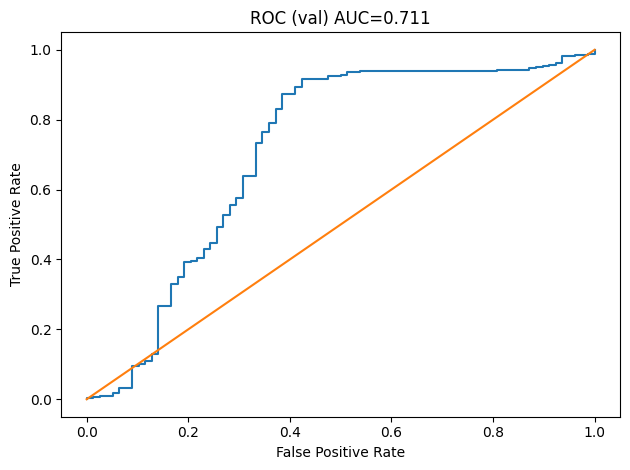

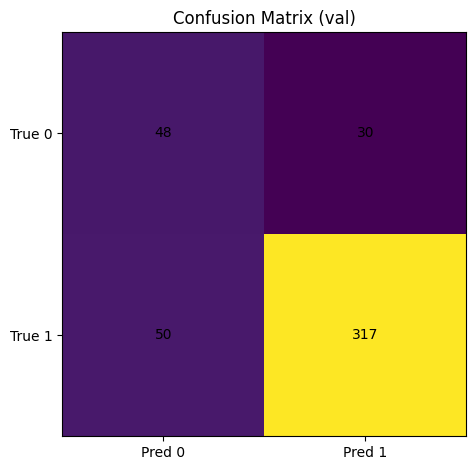

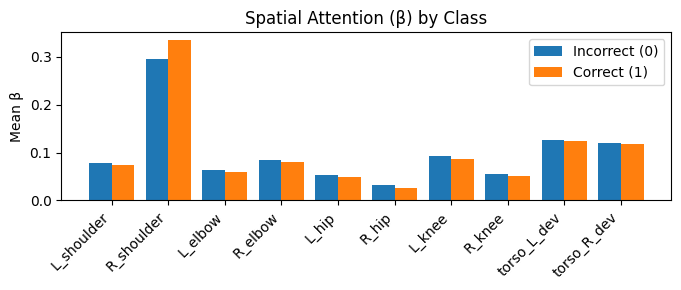

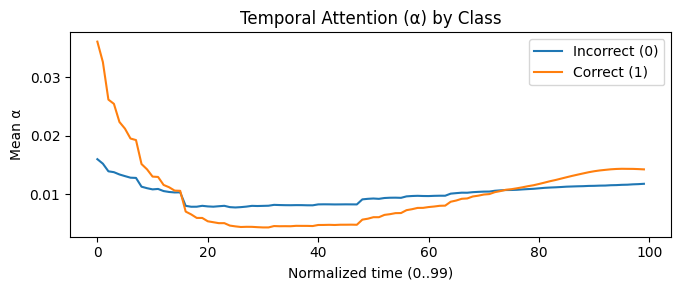

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc as sk_auc

# --- 1) ROC ---
fpr, tpr, _ = roc_curve(y_true_val, p1_val)
roc_auc = sk_auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr)
plt.plot([0,1],[0,1])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title(f"ROC (val) AUC={roc_auc:.3f}")
plt.tight_layout()
plt.savefig("Fig_ROC_val.png", dpi=200)
plt.show()

# --- 2) Confusion matrix ---
plt.figure()
plt.imshow(cm, interpolation="nearest")
plt.title("Confusion Matrix (val)")
plt.xticks([0,1], ["Pred 0","Pred 1"])
plt.yticks([0,1], ["True 0","True 1"])
for i in range(2):
    for j in range(2):
        plt.text(j, i, str(cm[i,j]), ha="center", va="center")
plt.tight_layout()
plt.savefig("Fig_CM_val.png", dpi=200)
plt.show()

# --- helpers to extract alpha/beta on a set of trial_ids ---
ANGLE_NAMES_10 = [
    "L_shoulder", "R_shoulder",
    "L_elbow", "R_elbow",
    "L_hip", "R_hip",
    "L_knee", "R_knee",
    "torso_L_dev", "torso_R_dev"
]

def infer_attention(model, trial_ids, batch=256):
    loader, _ = make_loader(trial_ids, batch=batch, shuffle=False)
    model.eval()
    rows = []
    with torch.no_grad():
        for X, y, tids in loader:
            X = X.to(device)
            logits, alpha, beta = model(X)
            prob1 = torch.softmax(logits, dim=1)[:,1].cpu().numpy()
            pred  = torch.argmax(logits, dim=1).cpu().numpy()
            alpha = alpha.cpu().numpy()  # (B,100)
            beta  = beta.cpu().numpy()   # (B,10)
            y = y.numpy()
            tids = list(tids)
            for i in range(len(tids)):
                rows.append({
                    "trial_id": tids[i],
                    "y_true": int(y[i]),
                    "y_hat": int(pred[i]),
                    "p_correct": float(prob1[i]),
                    "alpha": alpha[i],
                    "beta": beta[i],
                })
    return rows

# use ALL data for visualization (not for official performance claims)
all_ids = meta_df["trial_id"].tolist()
rows_all = infer_attention(final_model, all_ids, batch=256)

# split by class
beta_correct = np.stack([r["beta"] for r in rows_all if r["y_true"]==1], axis=0)
beta_incor   = np.stack([r["beta"] for r in rows_all if r["y_true"]==0], axis=0)

alpha_correct = np.stack([r["alpha"] for r in rows_all if r["y_true"]==1], axis=0)
alpha_incor   = np.stack([r["alpha"] for r in rows_all if r["y_true"]==0], axis=0)

# --- 3) Mean beta by class ---
m1 = beta_correct.mean(axis=0)
m0 = beta_incor.mean(axis=0)

plt.figure(figsize=(7,3))
x = np.arange(len(ANGLE_NAMES_10))
plt.bar(x-0.2, m0, width=0.4, label="Incorrect (0)")
plt.bar(x+0.2, m1, width=0.4, label="Correct (1)")
plt.xticks(x, ANGLE_NAMES_10, rotation=45, ha="right")
plt.ylabel("Mean β")
plt.title("Spatial Attention (β) by Class")
plt.legend()
plt.tight_layout()
plt.savefig("Fig_Beta_byClass.png", dpi=200)
plt.show()

# --- 4) Mean alpha by class ---
a1 = alpha_correct.mean(axis=0)
a0 = alpha_incor.mean(axis=0)

plt.figure(figsize=(7,3))
plt.plot(a0, label="Incorrect (0)")
plt.plot(a1, label="Correct (1)")
plt.xlabel("Normalized time (0..99)")
plt.ylabel("Mean α")
plt.title("Temporal Attention (α) by Class")
plt.legend()
plt.tight_layout()
plt.savefig("Fig_Alpha_byClass.png", dpi=200)
plt.show()

### B4) Attention–Effect Alignment figure (β vs |Cohen’s d|)

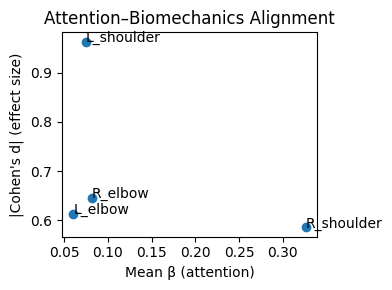

In [ ]:
# Build mapping from feature name -> abs Cohen's d
# stat_df feature values like 'jerk_L_shoulder', 'rom_R_elbow'...
d_map = {row["feature"]: abs(row["cohens_d (correct - incorrect)"]) for _, row in stat_df.iterrows()}

# pick the jerk features for joints we have in beta (most meaningful)
targets = [
    ("L_shoulder", "jerk_L_shoulder"),
    ("R_shoulder", "jerk_R_shoulder"),
    ("L_elbow", "jerk_L_elbow"),
    ("R_elbow", "jerk_R_elbow"),
]

# attention: use mean beta over ALL samples (or over incorrect only)
mean_beta_all = np.stack([r["beta"] for r in rows_all], axis=0).mean(axis=0)
beta_idx = {name:i for i,name in enumerate(ANGLE_NAMES_10)}

xs, ys, labels = [], [], []
for joint, feat in targets:
    xs.append(mean_beta_all[beta_idx[joint]])
    ys.append(d_map.get(feat, np.nan))
    labels.append(joint)

plt.figure(figsize=(4,3))
plt.scatter(xs, ys)
for i, lab in enumerate(labels):
    plt.text(xs[i], ys[i], lab)
plt.xlabel("Mean β (attention)")
plt.ylabel("|Cohen's d| (effect size)")
plt.title("Attention–Biomechanics Alignment")
plt.tight_layout()
plt.savefig("Fig_Attention_Effect_Alignment.png", dpi=200)
plt.show()

### B5) One correct + one incorrect example figure (α + β)

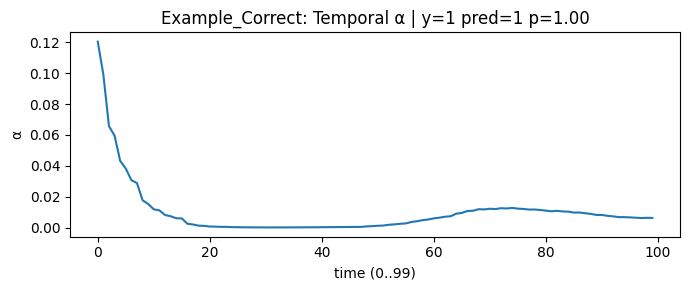

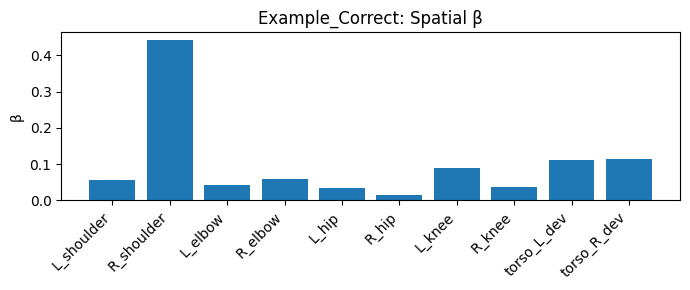

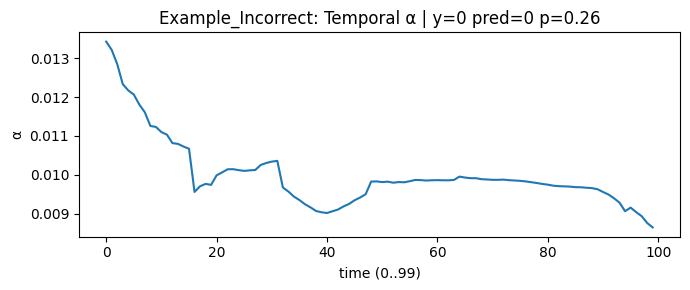

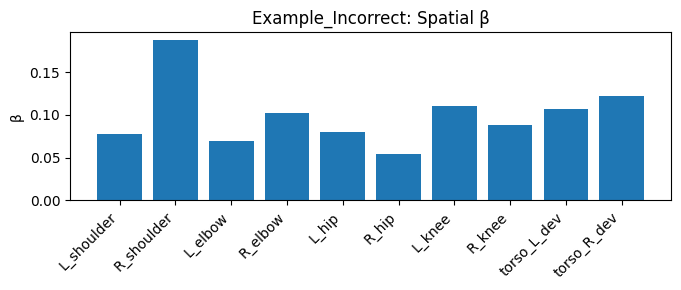

In [ ]:
# choose a high-confidence correct and incorrect from the ALL-data inference
correct_ex = max([r for r in rows_all if r["y_true"]==1], key=lambda r: r["p_correct"])
incorrect_ex = min([r for r in rows_all if r["y_true"]==0], key=lambda r: r["p_correct"])  # confident incorrect

def plot_example(r, name):
    alpha = r["alpha"]
    beta  = r["beta"]
    plt.figure(figsize=(7,3))
    plt.plot(alpha)
    plt.title(f"{name}: Temporal α | y={r['y_true']} pred={r['y_hat']} p={r['p_correct']:.2f}")
    plt.xlabel("time (0..99)")
    plt.ylabel("α")
    plt.tight_layout()
    plt.savefig(f"Fig_{name}_alpha.png", dpi=200)
    plt.show()

    plt.figure(figsize=(7,3))
    plt.bar(np.arange(len(ANGLE_NAMES_10)), beta)
    plt.xticks(np.arange(len(ANGLE_NAMES_10)), ANGLE_NAMES_10, rotation=45, ha="right")
    plt.ylabel("β")
    plt.title(f"{name}: Spatial β")
    plt.tight_layout()
    plt.savefig(f"Fig_{name}_beta.png", dpi=200)
    plt.show()

plot_example(correct_ex, "Example_Correct")
plot_example(incorrect_ex, "Example_Incorrect")

## Section B: Via Shallow Modeling

In [ ]:
# ============================================
# Generalized LR-on-angles with nested C tuning
# ============================================
import numpy as np
import pandas as pd

from sklearn.model_selection import GroupKFold
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import balanced_accuracy_score, f1_score, roc_auc_score, confusion_matrix

# -----------------------------
# Helpers
# -----------------------------
def _stack_angles(meta_sub, angles_cache):
    """meta_sub: DataFrame with trial_id, y. Returns X (N,1000), y (N,)"""
    tids = meta_sub["trial_id"].tolist()
    X = np.stack([angles_cache[tid].reshape(-1) for tid in tids], axis=0).astype(np.float32)
    y = meta_sub["y"].values.astype(int)
    return X, y, tids

def _make_lr(C=1.0):
    # liblinear is robust for small datasets; saga also ok but needs more iters.
    return Pipeline([
        ("scaler", StandardScaler()),
        ("lr", LogisticRegression(
            C=float(C),
            penalty="l2",
            solver="liblinear",
            class_weight="balanced",
            max_iter=4000
        ))
    ])

def _eval_metrics(y_true, y_pred, p1):
    bal = balanced_accuracy_score(y_true, y_pred)
    f1  = f1_score(y_true, y_pred, zero_division=0)
    auc = roc_auc_score(y_true, p1) if len(np.unique(y_true)) == 2 else np.nan
    cm  = confusion_matrix(y_true, y_pred, labels=[0, 1])
    return bal, f1, auc, cm

# -----------------------------
# Nested CV
# -----------------------------
def generalized_lr_nested_cv(meta_df, angles_cache,
                             n_outer=5, n_inner=4,
                             C_grid=(0.01, 0.03, 0.1, 0.3, 1.0, 3.0, 10.0),
                             seed=42):
    """
    Subject-disjoint generalized evaluation:
      Outer: GroupKFold over subject
      Inner: GroupKFold over subject (within outer-train) to pick C by mean balanced accuracy

    Returns:
      fold_df: per-fold test metrics + chosen C
      preds_df: per-trial predictions for all outer test folds
    """
    outer = GroupKFold(n_splits=n_outer)

    fold_rows = []
    pred_rows = []

    # sanity
    assert {"trial_id", "subject", "y"}.issubset(set(meta_df.columns)), \
        "meta_df must contain: trial_id, subject, y"

    for fold, (tr_idx, te_idx) in enumerate(outer.split(meta_df, groups=meta_df["subject"]), start=1):
        meta_tr = meta_df.iloc[tr_idx].reset_index(drop=True)
        meta_te = meta_df.iloc[te_idx].reset_index(drop=True)

        # -------- inner tuning on meta_tr --------
        inner = GroupKFold(n_splits=min(n_inner, meta_tr["subject"].nunique()))
        # If too few subjects for n_inner, GroupKFold will fail; guard:
        if meta_tr["subject"].nunique() < 2:
            raise ValueError("Not enough subjects in training fold for inner CV.")

        C_scores = []
        for C in C_grid:
            bals = []
            for itr_idx, iva_idx in inner.split(meta_tr, groups=meta_tr["subject"]):

                inner_tr = meta_tr.iloc[itr_idx]
                inner_va = meta_tr.iloc[iva_idx]

                Xtr, ytr, _ = _stack_angles(inner_tr, angles_cache)
                Xva, yva, _ = _stack_angles(inner_va, angles_cache)

                # Skip degenerate inner validation folds (only one class)
                if len(np.unique(yva)) < 2:
                    continue


                clf = _make_lr(C=C)
                clf.fit(Xtr, ytr)

                p1 = clf.predict_proba(Xva)[:, 1]
                yhat = (p1 >= 0.5).astype(int)
                bal = balanced_accuracy_score(yva, yhat)
                bals.append(bal)

            C_scores.append((float(C), float(np.mean(bals)), float(np.std(bals))))

        # pick best C by mean bal acc; tie-breaker: smaller C (more regularization)
        C_scores = sorted(C_scores, key=lambda x: (-x[1], x[0]))

        best_C, best_mean, best_std = C_scores[0]

        # -------- train on full meta_tr with best_C, test on meta_te --------
        Xtr, ytr, tr_ids = _stack_angles(meta_tr, angles_cache)
        Xte, yte, te_ids = _stack_angles(meta_te, angles_cache)

        # If outer test fold has only one class, skip fold (metrics not meaningful)
        if len(np.unique(yte)) < 2:
            print(f"[Fold {fold}] skipped: test fold has one class (y distribution: {np.bincount(yte)})")
            continue

        clf = _make_lr(C=best_C)
        clf.fit(Xtr, ytr)

        p1 = clf.predict_proba(Xte)[:, 1]
        yhat = (p1 >= 0.5).astype(int)

        bal, f1, auc, cm = _eval_metrics(yte, yhat, p1)

        fold_rows.append({
            "fold": fold,
            "n_train": len(meta_tr),
            "n_test": len(meta_te),
            "n_train_subjects": int(meta_tr["subject"].nunique()),
            "n_test_subjects": int(meta_te["subject"].nunique()),
            "best_C": best_C,
            "inner_bal_mean": best_mean,
            "inner_bal_std": best_std,
            "bal_acc": float(bal),
            "f1": float(f1),
            "auc": float(auc),
            "cm_00": int(cm[0,0]), "cm_01": int(cm[0,1]),
            "cm_10": int(cm[1,0]), "cm_11": int(cm[1,1]),
        })

        # per-trial preds for later analyses/explanations
        for tid, yt, yh, prob in zip(te_ids, yte, yhat, p1):
            # attach exercise if available
            ex = None
            if "gesture" in meta_df.columns:
                ex = int(meta_df.loc[meta_df["trial_id"] == tid, "gesture"].iloc[0])
            pred_rows.append({
                "fold": fold,
                "trial_id": tid,
                "subject": int(meta_df.loc[meta_df["trial_id"] == tid, "subject"].iloc[0]),
                "exercise": ex,
                "y_true": int(yt),
                "y_hat": int(yh),
                "p_correct": float(prob),
                "best_C": best_C
            })

        print(f"[Fold {fold}] best_C={best_C} | inner_bal={best_mean:.3f}±{best_std:.3f} "
              f"| TEST bal={bal:.3f} f1={f1:.3f} auc={auc:.3f} | cm={cm.tolist()}")

    fold_df = pd.DataFrame(fold_rows)
    preds_df = pd.DataFrame(pred_rows)

    return fold_df, preds_df

In [ ]:
# -----------------------------
# Run
# -----------------------------
C_GRID = (0.01, 0.03, 0.1, 0.3, 1.0, 3.0, 10.0)

fold_lr_angles, preds_lr_angles = generalized_lr_nested_cv(
    meta_df=meta_df,
    angles_cache=angles_cache,
    n_outer=5,
    n_inner=4,
    C_grid=C_GRID,
    seed=42
)

print("\nPer-fold metrics:")
display(fold_lr_angles)

print("\nSummary:")
print(fold_lr_angles[["bal_acc","f1","auc"]].agg(["mean","std","min","max"]))


[Fold 1] best_C=0.03 | inner_bal=0.748±0.074 | TEST bal=0.758 f1=0.875 auc=0.864 | cm=[[84, 46], [51, 339]]
[Fold 2] best_C=0.03 | inner_bal=0.772±0.029 | TEST bal=0.748 f1=0.886 auc=0.861 | cm=[[69, 43], [49, 358]]
[Fold 3] best_C=0.03 | inner_bal=0.796±0.058 | TEST bal=0.794 f1=0.872 auc=0.894 | cm=[[17, 4], [108, 381]]
[Fold 4] best_C=0.1 | inner_bal=0.783±0.081 | TEST bal=0.733 f1=0.813 auc=0.822 | cm=[[92, 37], [94, 285]]
[Fold 5] best_C=0.01 | inner_bal=0.735±0.050 | TEST bal=0.882 f1=0.916 auc=0.950 | cm=[[122, 16], [46, 336]]

Per-fold metrics:


,fold,n_train,n_test,n_train_subjects,n_test_subjects,best_C,inner_bal_mean,inner_bal_std,bal_acc,f1,auc,cm_00,cm_01,cm_10,cm_11
0,1,2057,520,24,6,0.03,0.747726,0.074146,0.757692,0.874839,0.863708,84,46,51,339
1,2,2058,519,24,6,0.03,0.771983,0.029067,0.747839,0.886139,0.860609,69,43,49,358
2,3,2067,510,24,6,0.03,0.796362,0.057534,0.794332,0.871854,0.893563,17,4,108,381
3,4,2069,508,24,6,0.10,0.783200,0.081379,0.732579,0.813124,0.821501,92,37,94,285
4,5,2057,520,24,6,0.01,0.735321,0.049985,0.881820,0.915531,0.949636,122,16,46,336



Summary:
       bal_acc        f1       auc
mean  0.782852  0.872297  0.877803
std   0.059818  0.037312  0.047625
min   0.732579  0.813124  0.821501
max   0.881820  0.915531  0.949636


## Stats

In [ ]:
import numpy as np
from scipy.stats import wilcoxon

# Dual-Attention fold balanced accuracy (IntelliRehabDS generalized)
da = np.array([
    0.766667,
    0.768033,
    0.656442,
    0.736465,
    0.869451
])

# Logistic Regression fold balanced accuracy
lr = np.array([
    0.757692,
    0.747839,
    0.794332,
    0.732579,
    0.881820
])

diff = lr - da

stat, p = wilcoxon(diff)

print("Wilcoxon p-value:", p)
print("Median difference (LR - DA):", np.median(diff))
print("Mean difference (LR - DA):", np.mean(diff))
print("% folds LR > DA:", np.mean(diff > 0))
print("Diff per fold:", diff)

Wilcoxon p-value: 1.0
Median difference (LR - DA): -0.003886000000000056
Mean difference (LR - DA): 0.02344080000000004
% folds LR > DA: 0.4
Diff per fold: [-0.008975 -0.020194  0.13789  -0.003886  0.012369]


# Per exercise modeling

## DA

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import GroupKFold

def run_per_exercise_cv(
    meta_df, angles_cache,
    n_splits_max=5,
    n_trials_optuna=25,
    seed_base=1000,
    epochs_final=60
):
    """
    Runs the same outer CV you already have, but separately for each exercise (gesture).
    Subject-disjoint within each exercise.
    Returns:
      ex_summary_df: per-exercise mean±std of metrics
      ex_fold_df: per-exercise, per-fold metrics
      ex_param_df: per-exercise, per-fold best params
      models_by_ex: dict[(ex, fold)] = trained model
      splits_by_ex: dict[(ex, fold)] = {train_meta, test_meta, ...}
    """
    ex_fold_rows = []
    ex_param_rows = []
    models_by_ex = {}
    splits_by_ex = {}

    for ex in sorted(meta_df["gesture"].unique()):
        meta_ex = meta_df[meta_df["gesture"] == ex].reset_index(drop=True)

        n_subj = meta_ex["subject"].nunique()
        n_trials = len(meta_ex)
        y_counts = meta_ex["y"].value_counts().to_dict()

        print("\n" + "="*60)
        print(f"Exercise {ex} | trials={n_trials} | subjects={n_subj} | y={y_counts}")

        # If too few subjects, GroupKFold can't run meaningfully
        if n_subj < 3:
            print(f"Skipping exercise {ex}: only {n_subj} subjects.")
            continue

        n_splits = min(n_splits_max, n_subj)
        gkf = GroupKFold(n_splits=n_splits)

        for fold, (tr_idx, te_idx) in enumerate(gkf.split(meta_ex, groups=meta_ex["subject"]), start=1):
            meta_train = meta_ex.iloc[tr_idx].reset_index(drop=True)
            meta_test  = meta_ex.iloc[te_idx].reset_index(drop=True)

            # (optional) sanity check: ensure both classes exist in train/test
            tr_classes = set(meta_train["y"].unique())
            te_classes = set(meta_test["y"].unique())
            if len(tr_classes) < 2 or len(te_classes) < 2:
                print(f"[Ex {ex} Fold {fold}] Skipping: class missing in train/test. "
                      f"train={tr_classes}, test={te_classes}")
                continue

            # Tune on meta_train (subject-disjoint inner split already inside tune_params_for_fold)
            best_params, best_val_bal = tune_params_for_fold(
                meta_train, angles_cache,
                n_trials=n_trials_optuna,
                seed=seed_base + ex*10 + fold
            )

            ex_param_rows.append({
                "exercise": ex,
                "fold": fold,
                "best_val_bal": float(best_val_bal),
                **best_params
            })

            rep, model = train_final_and_eval(
                meta_train, meta_test,
                angles_cache,
                best_params,
                epochs=epochs_final
            )

            rep_row = {
                "exercise": ex,
                "fold": fold,
                **rep
            }
            ex_fold_rows.append(rep_row)

            models_by_ex[(ex, fold)] = model
            splits_by_ex[(ex, fold)] = {
                "train_meta": meta_train,
                "test_meta": meta_test,
                "train_ids": meta_train["trial_id"].tolist(),
                "test_ids": meta_test["trial_id"].tolist(),
                "best_params": best_params,
                "best_val_bal": float(best_val_bal)
            }

            print(f"[Ex {ex} Fold {fold}] tuned_val_bal={best_val_bal:.3f} | "
                  f"TEST bal={rep['bal_acc']:.3f} f1={rep['f1']:.3f} auc={rep['auc']:.3f} n={rep['n_test']}")

    ex_fold_df = pd.DataFrame(ex_fold_rows)
    ex_param_df = pd.DataFrame(ex_param_rows)

    # summarize per exercise
    def mean_std(s):
        return pd.Series({"mean": float(np.mean(s)), "std": float(np.std(s))})

    ex_summary_df = (ex_fold_df
        .groupby("exercise")[["bal_acc","f1","auc"]]
        .agg(["mean","std","count"])
        .reset_index()
    )

    return ex_summary_df, ex_fold_df, ex_param_df, models_by_ex, splits_by_ex

In [ ]:
ex_summary_df, ex_fold_df, ex_param_df, models_by_ex, splits_by_ex = run_per_exercise_cv(
    meta_df=meta_df,
    angles_cache=angles_cache,
    n_splits_max=5,
    n_trials_optuna=25,
    seed_base=42,
    epochs_final=60
)

ex_summary_df

[I 2026-02-17 13:06:30,899] A new study created in memory with name: no-name-6faa9d76-93c4-4171-9341-ed112425c9fe



Exercise 0 | trials=258 | subjects=27 | y={1: 213, 0: 45}


  0%|          | 0/25 [00:00<?, ?it/s]

[I 2026-02-17 13:06:39,339] Trial 0 finished with value: 0.5 and parameters: {'hidden': 64, 'levels': 4, 'kernel': 7, 'dropout': 0.16848500552930173, 'lr': 0.0015301036326297482, 'wd': 5.797801971205838e-06, 'batch': 64}. Best is trial 0 with value: 0.5.
[I 2026-02-17 13:06:39,723] Trial 1 finished with value: 0.5 and parameters: {'hidden': 128, 'levels': 4, 'kernel': 3, 'dropout': 0.07475001490914662, 'lr': 0.0021140895528054034, 'wd': 7.834485878135568e-06, 'batch': 128}. Best is trial 0 with value: 0.5.
[I 2026-02-17 13:06:40,054] Trial 2 finished with value: 0.5 and parameters: {'hidden': 96, 'levels': 3, 'kernel': 5, 'dropout': 0.30950513618215447, 'lr': 0.000983755891916399, 'wd': 7.697636301173465e-05, 'batch': 64}. Best is trial 0 with value: 0.5.
[I 2026-02-17 13:06:40,374] Trial 3 finished with value: 0.5 and parameters: {'hidden': 64, 'levels': 5, 'kernel': 7, 'dropout': 0.2328679613777137, 'lr': 0.0006276194375193368, 'wd': 4.151887265119397e-06, 'batch': 64}. Best is trial

[I 2026-02-17 13:06:49,292] A new study created in memory with name: no-name-2501ea73-c983-4862-b1da-6b43db620c3a


[Ex 0 Fold 1] tuned_val_bal=0.500 | TEST bal=1.000 f1=1.000 auc=1.000 n=54


  0%|          | 0/25 [00:00<?, ?it/s]

[I 2026-02-17 13:06:49,605] Trial 0 finished with value: 0.5 and parameters: {'hidden': 32, 'levels': 4, 'kernel': 7, 'dropout': 0.3381578675617002, 'lr': 0.00047259023683234096, 'wd': 1.9184680159538708e-05, 'batch': 128}. Best is trial 0 with value: 0.5.
[I 2026-02-17 13:06:50,023] Trial 1 finished with value: 0.5 and parameters: {'hidden': 32, 'levels': 3, 'kernel': 3, 'dropout': 0.3088023008110878, 'lr': 0.0001659077362770727, 'wd': 4.8848347275485485e-05, 'batch': 64}. Best is trial 0 with value: 0.5.
[I 2026-02-17 13:06:50,440] Trial 2 finished with value: 0.5 and parameters: {'hidden': 128, 'levels': 3, 'kernel': 5, 'dropout': 0.3147834745789639, 'lr': 0.0011816134776603154, 'wd': 0.00031629959608777834, 'batch': 128}. Best is trial 0 with value: 0.5.
[I 2026-02-17 13:06:50,762] Trial 3 finished with value: 0.5 and parameters: {'hidden': 32, 'levels': 5, 'kernel': 5, 'dropout': 0.08970748842155914, 'lr': 0.0002942859012985308, 'wd': 8.361181991168505e-06, 'batch': 128}. Best is 

[I 2026-02-17 13:07:07,691] A new study created in memory with name: no-name-60392a2f-fe07-4bfc-a0e4-d6741d8a298f


[Ex 0 Fold 2] tuned_val_bal=0.812 | TEST bal=0.906 f1=0.978 auc=0.967 n=52


  0%|          | 0/25 [00:00<?, ?it/s]

[I 2026-02-17 13:07:08,005] Trial 0 finished with value: 0.5 and parameters: {'hidden': 32, 'levels': 4, 'kernel': 7, 'dropout': 0.3068546145786873, 'lr': 0.0009125992424601813, 'wd': 0.0009379183965007395, 'batch': 64}. Best is trial 0 with value: 0.5.
[I 2026-02-17 13:07:08,282] Trial 1 finished with value: 0.5 and parameters: {'hidden': 32, 'levels': 3, 'kernel': 3, 'dropout': 0.29566202826961296, 'lr': 0.00012885633599480425, 'wd': 0.0005880965302451701, 'batch': 64}. Best is trial 0 with value: 0.5.
[I 2026-02-17 13:07:09,023] Trial 2 finished with value: 0.8293650793650793 and parameters: {'hidden': 96, 'levels': 4, 'kernel': 5, 'dropout': 0.2977261896491616, 'lr': 0.0004646931028398849, 'wd': 1.9160938956947734e-06, 'batch': 32}. Best is trial 2 with value: 0.8293650793650793.
[I 2026-02-17 13:07:09,257] Trial 3 finished with value: 0.5 and parameters: {'hidden': 32, 'levels': 3, 'kernel': 5, 'dropout': 0.1707113851867054, 'lr': 0.0001243913732459811, 'wd': 2.145963733880339e-05

[I 2026-02-17 13:07:25,623] A new study created in memory with name: no-name-96f7aa56-838c-49ca-8fa2-0f4dff70a4bb


[Ex 0 Fold 3] tuned_val_bal=0.873 | TEST bal=0.500 f1=0.990 auc=0.688 n=49


  0%|          | 0/25 [00:00<?, ?it/s]

[I 2026-02-17 13:07:25,953] Trial 0 finished with value: 0.5 and parameters: {'hidden': 32, 'levels': 4, 'kernel': 5, 'dropout': 0.2023803022111375, 'lr': 0.00013348096715085585, 'wd': 1.9012944181687062e-05, 'batch': 64}. Best is trial 0 with value: 0.5.
[I 2026-02-17 13:07:26,361] Trial 1 finished with value: 0.5 and parameters: {'hidden': 64, 'levels': 4, 'kernel': 7, 'dropout': 0.1685436044309181, 'lr': 0.00028462482817605007, 'wd': 4.605782327409013e-06, 'batch': 32}. Best is trial 0 with value: 0.5.
[I 2026-02-17 13:07:27,204] Trial 2 finished with value: 0.855 and parameters: {'hidden': 64, 'levels': 5, 'kernel': 3, 'dropout': 0.06741539486487584, 'lr': 0.0013068010490386518, 'wd': 1.562459015434422e-06, 'batch': 32}. Best is trial 2 with value: 0.855.
[I 2026-02-17 13:07:28,934] Trial 3 finished with value: 0.825 and parameters: {'hidden': 128, 'levels': 5, 'kernel': 5, 'dropout': 0.09449686854301688, 'lr': 0.0010753220044525424, 'wd': 2.7722329060656786e-06, 'batch': 32}. Best

[I 2026-02-17 13:07:49,613] A new study created in memory with name: no-name-b55084da-52f1-4c70-9246-5aec6395e3ee


[Ex 0 Fold 4] tuned_val_bal=0.875 | TEST bal=0.719 f1=0.957 auc=0.948 n=50


  0%|          | 0/25 [00:00<?, ?it/s]

[I 2026-02-17 13:07:49,939] Trial 0 finished with value: 0.5 and parameters: {'hidden': 64, 'levels': 4, 'kernel': 5, 'dropout': 0.1267977293893887, 'lr': 0.0001085094798265882, 'wd': 1.977779470395541e-06, 'batch': 64}. Best is trial 0 with value: 0.5.
[I 2026-02-17 13:07:50,428] Trial 1 finished with value: 0.8020833333333333 and parameters: {'hidden': 64, 'levels': 3, 'kernel': 5, 'dropout': 0.21590771127036462, 'lr': 0.0024068923944079385, 'wd': 3.450409089645336e-05, 'batch': 64}. Best is trial 1 with value: 0.8020833333333333.
[I 2026-02-17 13:07:51,138] Trial 2 finished with value: 0.8333333333333333 and parameters: {'hidden': 128, 'levels': 3, 'kernel': 5, 'dropout': 0.10239090417594274, 'lr': 0.0003410458648755993, 'wd': 2.63358170052725e-06, 'batch': 128}. Best is trial 2 with value: 0.8333333333333333.
[I 2026-02-17 13:07:51,724] Trial 3 finished with value: 0.8333333333333333 and parameters: {'hidden': 96, 'levels': 4, 'kernel': 3, 'dropout': 0.2185997531329446, 'lr': 0.000

[I 2026-02-17 13:08:03,523] A new study created in memory with name: no-name-7a4f5697-6b5e-4b9f-bf43-502554898b41


[Ex 0 Fold 5] tuned_val_bal=0.865 | TEST bal=0.800 f1=0.927 auc=0.951 n=53

Exercise 1 | trials=279 | subjects=28 | y={1: 234, 0: 45}


  0%|          | 0/25 [00:00<?, ?it/s]

[I 2026-02-17 13:08:03,807] Trial 0 finished with value: 0.5 and parameters: {'hidden': 32, 'levels': 5, 'kernel': 5, 'dropout': 0.09034349669269212, 'lr': 0.0002421129781963895, 'wd': 1.3896455099037473e-06, 'batch': 128}. Best is trial 0 with value: 0.5.
[I 2026-02-17 13:08:04,154] Trial 1 finished with value: 0.7428571428571429 and parameters: {'hidden': 32, 'levels': 3, 'kernel': 3, 'dropout': 0.18235628586657748, 'lr': 0.0018764149902785864, 'wd': 0.000490856484862787, 'batch': 128}. Best is trial 1 with value: 0.7428571428571429.
[I 2026-02-17 13:08:04,418] Trial 2 finished with value: 0.5 and parameters: {'hidden': 64, 'levels': 5, 'kernel': 3, 'dropout': 0.13030547136587034, 'lr': 0.0019064019480886675, 'wd': 4.9932839152652334e-06, 'batch': 128}. Best is trial 1 with value: 0.7428571428571429.
[I 2026-02-17 13:08:04,756] Trial 3 finished with value: 0.5 and parameters: {'hidden': 128, 'levels': 5, 'kernel': 3, 'dropout': 0.2103396869143535, 'lr': 0.0001724766347209979, 'wd': 0

[I 2026-02-17 13:08:36,376] A new study created in memory with name: no-name-a679666e-3022-4c38-b615-1ee7dca3dd8e


[Ex 1 Fold 1] tuned_val_bal=0.886 | TEST bal=0.695 f1=0.840 auc=0.837 n=53


  0%|          | 0/25 [00:00<?, ?it/s]

[I 2026-02-17 13:08:37,142] Trial 0 finished with value: 0.763157894736842 and parameters: {'hidden': 128, 'levels': 4, 'kernel': 3, 'dropout': 0.16746860899409943, 'lr': 0.00039621405634428496, 'wd': 3.705894427972908e-06, 'batch': 128}. Best is trial 0 with value: 0.763157894736842.
[I 2026-02-17 13:08:38,011] Trial 1 finished with value: 0.7236842105263158 and parameters: {'hidden': 128, 'levels': 3, 'kernel': 5, 'dropout': 0.1882270856678031, 'lr': 0.00022251074302258146, 'wd': 0.0003703834024405036, 'batch': 128}. Best is trial 0 with value: 0.763157894736842.
[I 2026-02-17 13:08:38,353] Trial 2 finished with value: 0.5 and parameters: {'hidden': 96, 'levels': 4, 'kernel': 3, 'dropout': 0.11511864541197028, 'lr': 0.00017274132825385876, 'wd': 0.0006933071525984874, 'batch': 128}. Best is trial 0 with value: 0.763157894736842.
[I 2026-02-17 13:08:39,210] Trial 3 finished with value: 0.618421052631579 and parameters: {'hidden': 32, 'levels': 5, 'kernel': 3, 'dropout': 0.263318383079

[I 2026-02-17 13:08:52,778] A new study created in memory with name: no-name-0e91c0f0-f287-47a8-8329-5baf93e89bd7


[Ex 1 Fold 2] tuned_val_bal=0.947 | TEST bal=0.838 f1=0.913 auc=0.915 n=58


  0%|          | 0/25 [00:00<?, ?it/s]

[I 2026-02-17 13:08:53,226] Trial 0 finished with value: 0.5 and parameters: {'hidden': 64, 'levels': 5, 'kernel': 7, 'dropout': 0.06542861266516528, 'lr': 0.0013990311581340402, 'wd': 1.0651648533989916e-06, 'batch': 128}. Best is trial 0 with value: 0.5.
[I 2026-02-17 13:08:53,916] Trial 1 finished with value: 0.7073170731707317 and parameters: {'hidden': 32, 'levels': 4, 'kernel': 3, 'dropout': 0.2837333870451184, 'lr': 0.0003932110224583157, 'wd': 0.000529644849944297, 'batch': 128}. Best is trial 1 with value: 0.7073170731707317.
[I 2026-02-17 13:08:54,240] Trial 2 finished with value: 0.5 and parameters: {'hidden': 96, 'levels': 3, 'kernel': 3, 'dropout': 0.3265371073274681, 'lr': 0.0011100901200601122, 'wd': 1.6417546971364426e-06, 'batch': 64}. Best is trial 1 with value: 0.7073170731707317.
[I 2026-02-17 13:08:54,656] Trial 3 finished with value: 0.5 and parameters: {'hidden': 64, 'levels': 3, 'kernel': 7, 'dropout': 0.11083251839044414, 'lr': 0.0013773927374687747, 'wd': 0.00

[I 2026-02-17 13:09:04,384] A new study created in memory with name: no-name-666be8fb-913b-4bd7-972d-7c41923b9322


[Ex 1 Fold 3] tuned_val_bal=0.881 | TEST bal=0.567 f1=0.866 auc=0.698 n=57


  0%|          | 0/25 [00:00<?, ?it/s]

[I 2026-02-17 13:09:04,791] Trial 0 finished with value: 0.5 and parameters: {'hidden': 32, 'levels': 4, 'kernel': 5, 'dropout': 0.147840026105093, 'lr': 0.00013585680668716854, 'wd': 0.0003181656203325291, 'batch': 64}. Best is trial 0 with value: 0.5.
[I 2026-02-17 13:09:05,198] Trial 1 finished with value: 0.5 and parameters: {'hidden': 128, 'levels': 3, 'kernel': 7, 'dropout': 0.2737151141376187, 'lr': 0.0011958046389227166, 'wd': 0.0009344872042495526, 'batch': 128}. Best is trial 0 with value: 0.5.
[I 2026-02-17 13:09:05,607] Trial 2 finished with value: 0.5 and parameters: {'hidden': 96, 'levels': 4, 'kernel': 3, 'dropout': 0.2858228084651469, 'lr': 0.00017547875290040347, 'wd': 0.00017100652895714693, 'batch': 64}. Best is trial 0 with value: 0.5.
[I 2026-02-17 13:09:06,164] Trial 3 finished with value: 0.5 and parameters: {'hidden': 96, 'levels': 3, 'kernel': 3, 'dropout': 0.18758624048499095, 'lr': 0.00011411203759905284, 'wd': 0.0001584821203478075, 'batch': 32}. Best is tri

[I 2026-02-17 13:09:19,015] A new study created in memory with name: no-name-322eaa2b-0767-4b32-a126-59fa23d90fe8


[Ex 1 Fold 4] tuned_val_bal=0.952 | TEST bal=0.682 f1=0.854 auc=0.757 n=56


  0%|          | 0/25 [00:00<?, ?it/s]

[I 2026-02-17 13:09:19,772] Trial 0 finished with value: 0.5 and parameters: {'hidden': 96, 'levels': 5, 'kernel': 3, 'dropout': 0.07154118636489135, 'lr': 0.0021243988741050713, 'wd': 1.8261711528833845e-05, 'batch': 32}. Best is trial 0 with value: 0.5.
[I 2026-02-17 13:09:20,169] Trial 1 finished with value: 0.5 and parameters: {'hidden': 96, 'levels': 5, 'kernel': 5, 'dropout': 0.05575791131647323, 'lr': 0.001162702102200075, 'wd': 1.3316730034835486e-06, 'batch': 128}. Best is trial 0 with value: 0.5.
[I 2026-02-17 13:09:20,753] Trial 2 finished with value: 0.609375 and parameters: {'hidden': 128, 'levels': 4, 'kernel': 3, 'dropout': 0.30580368437600436, 'lr': 0.0006369817555703516, 'wd': 3.912138516172479e-06, 'batch': 32}. Best is trial 2 with value: 0.609375.
[I 2026-02-17 13:09:21,406] Trial 3 finished with value: 0.6510416666666666 and parameters: {'hidden': 64, 'levels': 4, 'kernel': 7, 'dropout': 0.28265650437404716, 'lr': 0.0008857286137358599, 'wd': 7.214205885833448e-06,

[I 2026-02-17 13:09:38,940] A new study created in memory with name: no-name-94a124ab-2e8b-4cca-998d-cf05a0c45939


[Ex 1 Fold 5] tuned_val_bal=0.818 | TEST bal=0.472 f1=0.962 auc=0.593 n=55

Exercise 2 | trials=375 | subjects=27 | y={1: 229, 0: 146}


  0%|          | 0/25 [00:00<?, ?it/s]

[I 2026-02-17 13:09:39,348] Trial 0 finished with value: 0.5 and parameters: {'hidden': 32, 'levels': 4, 'kernel': 5, 'dropout': 0.07677389328580853, 'lr': 0.0004650142136909094, 'wd': 0.0002090034870870426, 'batch': 64}. Best is trial 0 with value: 0.5.
[I 2026-02-17 13:09:39,933] Trial 1 finished with value: 0.7142857142857143 and parameters: {'hidden': 96, 'levels': 3, 'kernel': 3, 'dropout': 0.057023137051422194, 'lr': 0.0022887670000193783, 'wd': 0.00010169816220379505, 'batch': 64}. Best is trial 1 with value: 0.7142857142857143.
[I 2026-02-17 13:09:41,240] Trial 2 finished with value: 0.7142857142857143 and parameters: {'hidden': 128, 'levels': 5, 'kernel': 7, 'dropout': 0.08307025225282419, 'lr': 0.0003920163290423204, 'wd': 6.103819960716893e-06, 'batch': 64}. Best is trial 1 with value: 0.7142857142857143.
[I 2026-02-17 13:09:41,981] Trial 3 finished with value: 0.7759103641456582 and parameters: {'hidden': 32, 'levels': 3, 'kernel': 5, 'dropout': 0.32373168992119417, 'lr': 0

[I 2026-02-17 13:10:06,071] A new study created in memory with name: no-name-89171718-feef-4375-994a-55025ca546bf


[Ex 2 Fold 1] tuned_val_bal=0.786 | TEST bal=0.981 f1=0.955 auc=0.996 n=75


  0%|          | 0/25 [00:00<?, ?it/s]

[I 2026-02-17 13:10:06,713] Trial 0 finished with value: 0.8388030888030888 and parameters: {'hidden': 96, 'levels': 3, 'kernel': 5, 'dropout': 0.2656251116554878, 'lr': 0.0006450573650635512, 'wd': 5.574748099282604e-05, 'batch': 128}. Best is trial 0 with value: 0.8388030888030888.
[I 2026-02-17 13:10:07,628] Trial 1 finished with value: 0.9375 and parameters: {'hidden': 64, 'levels': 3, 'kernel': 7, 'dropout': 0.309798240067208, 'lr': 0.00023863519694689302, 'wd': 6.372423604812201e-05, 'batch': 32}. Best is trial 1 with value: 0.9375.
[I 2026-02-17 13:10:08,064] Trial 2 finished with value: 0.5 and parameters: {'hidden': 32, 'levels': 5, 'kernel': 7, 'dropout': 0.23698484125254238, 'lr': 0.00023384895306809378, 'wd': 2.4707931584474723e-06, 'batch': 64}. Best is trial 1 with value: 0.9375.
[I 2026-02-17 13:10:08,980] Trial 3 finished with value: 0.8383204633204633 and parameters: {'hidden': 128, 'levels': 5, 'kernel': 5, 'dropout': 0.3396665488658231, 'lr': 0.00023412861755967528, 

[I 2026-02-17 13:10:41,522] A new study created in memory with name: no-name-3d5e418f-2dd0-4c0b-81c4-c339830de186


[Ex 2 Fold 2] tuned_val_bal=0.973 | TEST bal=0.892 f1=0.873 auc=0.978 n=74


  0%|          | 0/25 [00:00<?, ?it/s]

[I 2026-02-17 13:10:41,931] Trial 0 finished with value: 0.5 and parameters: {'hidden': 96, 'levels': 5, 'kernel': 3, 'dropout': 0.11901188797963226, 'lr': 0.0005584735652435903, 'wd': 2.526707031625365e-06, 'batch': 128}. Best is trial 0 with value: 0.5.
[I 2026-02-17 13:10:44,040] Trial 1 finished with value: 0.81 and parameters: {'hidden': 128, 'levels': 5, 'kernel': 5, 'dropout': 0.20977177354602217, 'lr': 0.0004559388345396567, 'wd': 3.4606736945174726e-06, 'batch': 32}. Best is trial 1 with value: 0.81.
[I 2026-02-17 13:10:44,657] Trial 2 finished with value: 0.6799999999999999 and parameters: {'hidden': 32, 'levels': 5, 'kernel': 5, 'dropout': 0.1732371662851585, 'lr': 0.0002054632337236625, 'wd': 1.7059617210545514e-05, 'batch': 64}. Best is trial 1 with value: 0.81.
[I 2026-02-17 13:10:45,212] Trial 3 finished with value: 0.5 and parameters: {'hidden': 32, 'levels': 3, 'kernel': 5, 'dropout': 0.2935313308342066, 'lr': 0.0001443437348412933, 'wd': 0.0007211148298659256, 'batch'

[I 2026-02-17 13:11:08,840] A new study created in memory with name: no-name-b7302aec-fba0-4dea-b3e6-8a8799d097e6


[Ex 2 Fold 3] tuned_val_bal=0.900 | TEST bal=0.926 f1=0.920 auc=0.914 n=77


  0%|          | 0/25 [00:00<?, ?it/s]

[I 2026-02-17 13:11:10,311] Trial 0 finished with value: 1.0 and parameters: {'hidden': 128, 'levels': 5, 'kernel': 3, 'dropout': 0.07615280108268745, 'lr': 0.0016775462401956644, 'wd': 7.869038624929547e-06, 'batch': 128}. Best is trial 0 with value: 1.0.
[I 2026-02-17 13:11:10,579] Trial 1 finished with value: 0.5 and parameters: {'hidden': 96, 'levels': 3, 'kernel': 3, 'dropout': 0.08465017591580877, 'lr': 0.00013875163994131397, 'wd': 1.7836477616204572e-06, 'batch': 128}. Best is trial 0 with value: 1.0.
[I 2026-02-17 13:11:10,885] Trial 2 finished with value: 0.5 and parameters: {'hidden': 96, 'levels': 3, 'kernel': 7, 'dropout': 0.33340133054567755, 'lr': 0.00011392998042905713, 'wd': 0.0007432249361778695, 'batch': 128}. Best is trial 0 with value: 1.0.
[I 2026-02-17 13:11:11,163] Trial 3 finished with value: 0.5 and parameters: {'hidden': 32, 'levels': 4, 'kernel': 3, 'dropout': 0.2449564362683896, 'lr': 0.00021904859879767261, 'wd': 0.00014144106960570308, 'batch': 128}. Best

[I 2026-02-17 13:11:37,484] A new study created in memory with name: no-name-9a209484-dc9a-411e-883a-16ec4942a66f


[Ex 2 Fold 4] tuned_val_bal=1.000 | TEST bal=0.875 f1=0.977 auc=0.984 n=76


  0%|          | 0/25 [00:00<?, ?it/s]

[I 2026-02-17 13:11:37,880] Trial 0 finished with value: 0.7043650793650793 and parameters: {'hidden': 64, 'levels': 4, 'kernel': 3, 'dropout': 0.29639325481534934, 'lr': 0.0007486227441546435, 'wd': 5.704459815946293e-06, 'batch': 128}. Best is trial 0 with value: 0.7043650793650793.
[I 2026-02-17 13:11:39,052] Trial 1 finished with value: 0.7142857142857143 and parameters: {'hidden': 128, 'levels': 4, 'kernel': 3, 'dropout': 0.2155933517680263, 'lr': 0.0011130236949854991, 'wd': 0.000724892588772583, 'batch': 32}. Best is trial 1 with value: 0.7142857142857143.
[I 2026-02-17 13:11:39,678] Trial 2 finished with value: 0.5476190476190476 and parameters: {'hidden': 128, 'levels': 5, 'kernel': 5, 'dropout': 0.26208327125643005, 'lr': 0.00025388021746936934, 'wd': 5.586440718918822e-06, 'batch': 128}. Best is trial 1 with value: 0.7142857142857143.
[I 2026-02-17 13:11:40,263] Trial 3 finished with value: 0.7043650793650793 and parameters: {'hidden': 128, 'levels': 4, 'kernel': 3, 'dropout

[I 2026-02-17 13:12:01,849] A new study created in memory with name: no-name-88373309-4a15-41f2-890e-f038a72a0524


[Ex 2 Fold 5] tuned_val_bal=0.819 | TEST bal=0.478 f1=0.942 auc=0.918 n=73

Exercise 3 | trials=317 | subjects=29 | y={1: 212, 0: 105}


  0%|          | 0/25 [00:00<?, ?it/s]

[I 2026-02-17 13:12:03,185] Trial 0 finished with value: 0.94 and parameters: {'hidden': 32, 'levels': 3, 'kernel': 5, 'dropout': 0.17122495231776919, 'lr': 0.0007612828311752936, 'wd': 5.300346975208043e-06, 'batch': 32}. Best is trial 0 with value: 0.94.
[I 2026-02-17 13:12:04,859] Trial 1 finished with value: 0.9278048780487804 and parameters: {'hidden': 96, 'levels': 3, 'kernel': 3, 'dropout': 0.10800078721342199, 'lr': 0.0002493865130504519, 'wd': 0.000852353410966321, 'batch': 32}. Best is trial 0 with value: 0.94.
[I 2026-02-17 13:12:06,002] Trial 2 finished with value: 0.94 and parameters: {'hidden': 64, 'levels': 5, 'kernel': 3, 'dropout': 0.269958824041859, 'lr': 0.0012022278259755533, 'wd': 2.2600734225062696e-06, 'batch': 128}. Best is trial 0 with value: 0.94.
[I 2026-02-17 13:12:06,883] Trial 3 finished with value: 0.8 and parameters: {'hidden': 32, 'levels': 4, 'kernel': 5, 'dropout': 0.25654587400088524, 'lr': 0.00212034075087955, 'wd': 0.00023934315123203367, 'batch': 

[I 2026-02-17 13:12:32,806] A new study created in memory with name: no-name-d4e24d01-7290-4107-a749-0cf2b36c96df


[Ex 3 Fold 1] tuned_val_bal=0.960 | TEST bal=0.550 f1=0.182 auc=0.748 n=63


  0%|          | 0/25 [00:00<?, ?it/s]

[I 2026-02-17 13:12:33,978] Trial 0 finished with value: 0.9544592030360531 and parameters: {'hidden': 96, 'levels': 4, 'kernel': 5, 'dropout': 0.3109916010368217, 'lr': 0.0005055238563735127, 'wd': 1.7410556097477e-06, 'batch': 64}. Best is trial 0 with value: 0.9544592030360531.
[I 2026-02-17 13:12:34,493] Trial 1 finished with value: 0.9544592030360531 and parameters: {'hidden': 128, 'levels': 5, 'kernel': 3, 'dropout': 0.30869951077914676, 'lr': 0.00010072901461105074, 'wd': 3.212831933846424e-06, 'batch': 64}. Best is trial 0 with value: 0.9544592030360531.
[I 2026-02-17 13:12:36,244] Trial 2 finished with value: 0.9544592030360531 and parameters: {'hidden': 128, 'levels': 5, 'kernel': 7, 'dropout': 0.18273232615277551, 'lr': 0.00015973862060810837, 'wd': 4.08167085190484e-06, 'batch': 64}. Best is trial 0 with value: 0.9544592030360531.
[I 2026-02-17 13:12:36,757] Trial 3 finished with value: 0.5 and parameters: {'hidden': 64, 'levels': 5, 'kernel': 3, 'dropout': 0.24376245107165

[I 2026-02-17 13:12:58,517] A new study created in memory with name: no-name-0562da77-ce86-4be9-a0a9-cf2f94d6eb8e


[Ex 3 Fold 2] tuned_val_bal=0.984 | TEST bal=0.783 f1=0.864 auc=0.888 n=65


  0%|          | 0/25 [00:00<?, ?it/s]

[I 2026-02-17 13:12:59,302] Trial 0 finished with value: 0.9210526315789473 and parameters: {'hidden': 128, 'levels': 3, 'kernel': 7, 'dropout': 0.24444236072842024, 'lr': 0.0009824648622723934, 'wd': 0.0006233338380578977, 'batch': 32}. Best is trial 0 with value: 0.9210526315789473.
[I 2026-02-17 13:12:59,876] Trial 1 finished with value: 0.9210526315789473 and parameters: {'hidden': 128, 'levels': 3, 'kernel': 7, 'dropout': 0.28339852750157984, 'lr': 0.0010636781685989557, 'wd': 0.0007004301396165929, 'batch': 128}. Best is trial 0 with value: 0.9210526315789473.
[I 2026-02-17 13:13:00,546] Trial 2 finished with value: 0.9210526315789473 and parameters: {'hidden': 32, 'levels': 5, 'kernel': 7, 'dropout': 0.31754195234181815, 'lr': 0.00024646065249306375, 'wd': 0.0006224447015269513, 'batch': 64}. Best is trial 0 with value: 0.9210526315789473.
[I 2026-02-17 13:13:00,942] Trial 3 finished with value: 0.7105263157894737 and parameters: {'hidden': 32, 'levels': 3, 'kernel': 3, 'dropout

[I 2026-02-17 13:13:20,241] A new study created in memory with name: no-name-6d8ed82e-1d10-43e1-aa6b-8a1208e478aa


[Ex 3 Fold 3] tuned_val_bal=0.947 | TEST bal=0.836 f1=0.911 auc=0.871 n=65


  0%|          | 0/25 [00:00<?, ?it/s]

[I 2026-02-17 13:13:20,771] Trial 0 finished with value: 0.7414167753150804 and parameters: {'hidden': 64, 'levels': 4, 'kernel': 3, 'dropout': 0.3080579825434048, 'lr': 0.00017548654045586293, 'wd': 9.309311805907551e-05, 'batch': 128}. Best is trial 0 with value: 0.7414167753150804.
[I 2026-02-17 13:13:22,270] Trial 1 finished with value: 0.9743589743589743 and parameters: {'hidden': 128, 'levels': 5, 'kernel': 5, 'dropout': 0.3104981988123872, 'lr': 0.0016028058935406177, 'wd': 0.0005376717262234086, 'batch': 128}. Best is trial 1 with value: 0.9743589743589743.
[I 2026-02-17 13:13:23,325] Trial 2 finished with value: 0.9658843980877879 and parameters: {'hidden': 96, 'levels': 4, 'kernel': 3, 'dropout': 0.06134755740087129, 'lr': 0.0010204002185803924, 'wd': 6.30198418842259e-05, 'batch': 32}. Best is trial 1 with value: 0.9743589743589743.
[I 2026-02-17 13:13:24,432] Trial 3 finished with value: 0.9532811820947413 and parameters: {'hidden': 96, 'levels': 5, 'kernel': 7, 'dropout': 

[I 2026-02-17 13:13:48,392] A new study created in memory with name: no-name-731d3778-0ef6-4e08-b20d-d1f294438c91


[Ex 3 Fold 4] tuned_val_bal=0.979 | TEST bal=0.812 f1=0.939 auc=1.000 n=62


  0%|          | 0/25 [00:00<?, ?it/s]

[I 2026-02-17 13:13:49,035] Trial 0 finished with value: 0.74 and parameters: {'hidden': 32, 'levels': 4, 'kernel': 7, 'dropout': 0.17016635110396677, 'lr': 0.001138741472862224, 'wd': 0.0003236233306657739, 'batch': 32}. Best is trial 0 with value: 0.74.
[I 2026-02-17 13:13:50,009] Trial 1 finished with value: 0.8582608695652174 and parameters: {'hidden': 128, 'levels': 3, 'kernel': 7, 'dropout': 0.06913145722419686, 'lr': 0.0004344911738235217, 'wd': 1.2374203112362011e-05, 'batch': 64}. Best is trial 1 with value: 0.8582608695652174.
[I 2026-02-17 13:13:50,489] Trial 2 finished with value: 0.72 and parameters: {'hidden': 64, 'levels': 3, 'kernel': 7, 'dropout': 0.26881820271601553, 'lr': 0.00028920716026492236, 'wd': 0.0004833544462216693, 'batch': 32}. Best is trial 1 with value: 0.8582608695652174.
[I 2026-02-17 13:13:51,592] Trial 3 finished with value: 0.9199999999999999 and parameters: {'hidden': 96, 'levels': 5, 'kernel': 5, 'dropout': 0.09042317918629197, 'lr': 0.000559977650

[I 2026-02-17 13:14:13,048] A new study created in memory with name: no-name-ccb25138-af9d-4892-accc-9b5d416a6cc4


[Ex 3 Fold 5] tuned_val_bal=0.960 | TEST bal=0.475 f1=0.967 auc=0.934 n=62

Exercise 4 | trials=275 | subjects=26 | y={1: 230, 0: 45}


  0%|          | 0/25 [00:00<?, ?it/s]

[I 2026-02-17 13:14:13,840] Trial 0 finished with value: 0.9166666666666667 and parameters: {'hidden': 128, 'levels': 3, 'kernel': 3, 'dropout': 0.22219727443117765, 'lr': 0.00011738389843982857, 'wd': 1.4496141839424285e-05, 'batch': 32}. Best is trial 0 with value: 0.9166666666666667.
[I 2026-02-17 13:14:14,616] Trial 1 finished with value: 1.0 and parameters: {'hidden': 128, 'levels': 5, 'kernel': 3, 'dropout': 0.2389904816681242, 'lr': 0.00020605388067825467, 'wd': 0.00016388115418552185, 'batch': 32}. Best is trial 1 with value: 1.0.
[I 2026-02-17 13:14:15,101] Trial 2 finished with value: 0.9166666666666667 and parameters: {'hidden': 128, 'levels': 3, 'kernel': 3, 'dropout': 0.19996371021736548, 'lr': 0.0029924205504408114, 'wd': 0.00016532414067409353, 'batch': 32}. Best is trial 1 with value: 1.0.
[I 2026-02-17 13:14:15,376] Trial 3 finished with value: 0.5 and parameters: {'hidden': 96, 'levels': 3, 'kernel': 3, 'dropout': 0.09375920692624937, 'lr': 0.00023278827308060147, 'wd

[I 2026-02-17 13:14:30,790] A new study created in memory with name: no-name-ab527603-a0bd-42a4-9598-4432ad8a1bec


[Ex 4 Fold 1] tuned_val_bal=1.000 | TEST bal=0.416 f1=0.551 auc=0.331 n=54


  0%|          | 0/25 [00:00<?, ?it/s]

[I 2026-02-17 13:14:31,119] Trial 0 finished with value: 0.5 and parameters: {'hidden': 128, 'levels': 3, 'kernel': 5, 'dropout': 0.13713503762636325, 'lr': 0.0005390476538475619, 'wd': 0.0007961830793281341, 'batch': 64}. Best is trial 0 with value: 0.5.
[I 2026-02-17 13:14:31,558] Trial 1 finished with value: 0.5125 and parameters: {'hidden': 96, 'levels': 3, 'kernel': 3, 'dropout': 0.2414214247269162, 'lr': 0.0002040045593887362, 'wd': 0.0008615506650609184, 'batch': 64}. Best is trial 1 with value: 0.5125.
[I 2026-02-17 13:14:31,971] Trial 2 finished with value: 0.5 and parameters: {'hidden': 128, 'levels': 4, 'kernel': 7, 'dropout': 0.34838573063763817, 'lr': 0.0002634030098270621, 'wd': 4.99546368037524e-05, 'batch': 128}. Best is trial 1 with value: 0.5125.
[I 2026-02-17 13:14:32,261] Trial 3 finished with value: 0.5 and parameters: {'hidden': 128, 'levels': 3, 'kernel': 5, 'dropout': 0.055303796645635395, 'lr': 0.0010755737443767016, 'wd': 0.00026425812044632556, 'batch': 128}.

[I 2026-02-17 13:14:46,911] A new study created in memory with name: no-name-4fd8b52c-bccc-456f-8ce2-12c93d478edf


[Ex 4 Fold 2] tuned_val_bal=0.590 | TEST bal=0.941 f1=0.938 auc=0.992 n=56


  0%|          | 0/25 [00:00<?, ?it/s]

[I 2026-02-17 13:14:47,571] Trial 0 finished with value: 0.5 and parameters: {'hidden': 128, 'levels': 4, 'kernel': 5, 'dropout': 0.3277390202536464, 'lr': 0.0002165336271144881, 'wd': 1.646865990933404e-05, 'batch': 32}. Best is trial 0 with value: 0.5.
[I 2026-02-17 13:14:47,892] Trial 1 finished with value: 0.5 and parameters: {'hidden': 64, 'levels': 5, 'kernel': 5, 'dropout': 0.16024765988216938, 'lr': 0.00018631823481505275, 'wd': 4.0735915625255244e-05, 'batch': 128}. Best is trial 0 with value: 0.5.
[I 2026-02-17 13:14:48,237] Trial 2 finished with value: 0.5 and parameters: {'hidden': 64, 'levels': 4, 'kernel': 7, 'dropout': 0.17588972076549736, 'lr': 0.00021124937722508396, 'wd': 0.0009305922058537092, 'batch': 128}. Best is trial 0 with value: 0.5.
[I 2026-02-17 13:14:48,667] Trial 3 finished with value: 0.5 and parameters: {'hidden': 32, 'levels': 5, 'kernel': 7, 'dropout': 0.3147941129061384, 'lr': 0.0006382789479713393, 'wd': 0.00011094123528346592, 'batch': 64}. Best is 

[I 2026-02-17 13:15:00,826] A new study created in memory with name: no-name-401e1c77-3f07-4f0d-9994-4dd1afc2f499


[Ex 4 Fold 3] tuned_val_bal=0.500 | TEST bal=0.923 f1=0.968 auc=0.981 n=56


  0%|          | 0/25 [00:00<?, ?it/s]

[I 2026-02-17 13:15:01,800] Trial 0 finished with value: 1.0 and parameters: {'hidden': 128, 'levels': 4, 'kernel': 5, 'dropout': 0.12510549110455357, 'lr': 0.0017553140795114992, 'wd': 0.00025089287493139324, 'batch': 64}. Best is trial 0 with value: 1.0.
[I 2026-02-17 13:15:02,385] Trial 1 finished with value: 0.5 and parameters: {'hidden': 128, 'levels': 5, 'kernel': 7, 'dropout': 0.09838120932831693, 'lr': 0.0012316345858724342, 'wd': 6.395549821308822e-05, 'batch': 128}. Best is trial 0 with value: 1.0.
[I 2026-02-17 13:15:03,345] Trial 2 finished with value: 1.0 and parameters: {'hidden': 96, 'levels': 3, 'kernel': 7, 'dropout': 0.33463441399396693, 'lr': 0.0005310398704453518, 'wd': 0.000310290314631231, 'batch': 128}. Best is trial 0 with value: 1.0.
[I 2026-02-17 13:15:03,616] Trial 3 finished with value: 0.5 and parameters: {'hidden': 64, 'levels': 3, 'kernel': 3, 'dropout': 0.24031202280557346, 'lr': 0.002894956949663915, 'wd': 2.1515364798807605e-06, 'batch': 64}. Best is t

[I 2026-02-17 13:15:15,449] A new study created in memory with name: no-name-c454a4fa-b69a-4299-b893-4b775f07fd17


[Ex 4 Fold 4] tuned_val_bal=1.000 | TEST bal=0.900 f1=0.990 auc=1.000 n=53


  0%|          | 0/25 [00:00<?, ?it/s]

[I 2026-02-17 13:15:16,070] Trial 0 finished with value: 0.75 and parameters: {'hidden': 96, 'levels': 4, 'kernel': 5, 'dropout': 0.2500581075262009, 'lr': 0.00031132464872562793, 'wd': 3.5377976115968607e-06, 'batch': 128}. Best is trial 0 with value: 0.75.
[I 2026-02-17 13:15:16,656] Trial 1 finished with value: 0.75 and parameters: {'hidden': 96, 'levels': 3, 'kernel': 5, 'dropout': 0.10583175816091916, 'lr': 0.0028555190415412556, 'wd': 1.0489480755211767e-05, 'batch': 64}. Best is trial 0 with value: 0.75.
[I 2026-02-17 13:15:16,893] Trial 2 finished with value: 0.5 and parameters: {'hidden': 64, 'levels': 3, 'kernel': 3, 'dropout': 0.15751352652618644, 'lr': 0.00025203903836561143, 'wd': 3.1039448625786344e-06, 'batch': 128}. Best is trial 0 with value: 0.75.
[I 2026-02-17 13:15:17,532] Trial 3 finished with value: 0.75 and parameters: {'hidden': 32, 'levels': 4, 'kernel': 3, 'dropout': 0.1724604182358185, 'lr': 0.00021529126451592996, 'wd': 8.276336476468704e-06, 'batch': 32}. B

[I 2026-02-17 13:15:34,205] A new study created in memory with name: no-name-d1cca8fe-cc3a-4ccb-84e6-28c0a6bbc581


[Ex 4 Fold 5] tuned_val_bal=1.000 | TEST bal=0.781 f1=0.875 auc=0.841 n=56

Exercise 5 | trials=257 | subjects=28 | y={1: 219, 0: 38}


  0%|          | 0/25 [00:00<?, ?it/s]

[I 2026-02-17 13:15:34,554] Trial 0 finished with value: 0.5 and parameters: {'hidden': 128, 'levels': 5, 'kernel': 3, 'dropout': 0.12067945840490167, 'lr': 0.00041209766989446715, 'wd': 0.00034281456902123946, 'batch': 128}. Best is trial 0 with value: 0.5.
[I 2026-02-17 13:15:34,977] Trial 1 finished with value: 0.5 and parameters: {'hidden': 96, 'levels': 3, 'kernel': 5, 'dropout': 0.2836138352192373, 'lr': 0.00013698904844480536, 'wd': 0.0007542895907456885, 'batch': 32}. Best is trial 0 with value: 0.5.
[I 2026-02-17 13:15:35,306] Trial 2 finished with value: 0.7894736842105263 and parameters: {'hidden': 64, 'levels': 5, 'kernel': 5, 'dropout': 0.18971345046708382, 'lr': 0.002341229474275235, 'wd': 2.4135599437971543e-06, 'batch': 128}. Best is trial 2 with value: 0.7894736842105263.
[I 2026-02-17 13:15:35,598] Trial 3 finished with value: 0.5 and parameters: {'hidden': 32, 'levels': 4, 'kernel': 5, 'dropout': 0.2608552677638925, 'lr': 0.00020558529177885877, 'wd': 1.2335527603560

[I 2026-02-17 13:15:47,494] A new study created in memory with name: no-name-0e84656f-0201-4872-8a24-73372e451f8a


[Ex 5 Fold 1] tuned_val_bal=0.803 | TEST bal=0.697 f1=0.565 auc=0.998 n=53


  0%|          | 0/25 [00:00<?, ?it/s]

[I 2026-02-17 13:15:47,796] Trial 0 finished with value: 0.5 and parameters: {'hidden': 32, 'levels': 5, 'kernel': 5, 'dropout': 0.3360844356125787, 'lr': 0.0002840703101007703, 'wd': 0.0002090596825037195, 'batch': 128}. Best is trial 0 with value: 0.5.
[I 2026-02-17 13:15:48,071] Trial 1 finished with value: 0.5 and parameters: {'hidden': 64, 'levels': 3, 'kernel': 3, 'dropout': 0.09309265197164085, 'lr': 0.0008735117496139259, 'wd': 0.0003416814825715595, 'batch': 64}. Best is trial 0 with value: 0.5.
[I 2026-02-17 13:15:48,347] Trial 2 finished with value: 0.5 and parameters: {'hidden': 96, 'levels': 3, 'kernel': 7, 'dropout': 0.3224361262131146, 'lr': 0.0002778909555870592, 'wd': 2.114958949764087e-05, 'batch': 128}. Best is trial 0 with value: 0.5.
[I 2026-02-17 13:15:48,628] Trial 3 finished with value: 0.5 and parameters: {'hidden': 96, 'levels': 3, 'kernel': 7, 'dropout': 0.20163960768379402, 'lr': 0.00011754516779570116, 'wd': 1.1252965476508372e-06, 'batch': 64}. Best is tri

[I 2026-02-17 13:16:00,411] A new study created in memory with name: no-name-85523fd4-5586-44a7-a880-4822fddad69c


[Ex 5 Fold 2] tuned_val_bal=0.833 | TEST bal=0.683 f1=0.789 auc=0.778 n=49


  0%|          | 0/25 [00:00<?, ?it/s]

[I 2026-02-17 13:16:01,142] Trial 0 finished with value: 0.8717948717948718 and parameters: {'hidden': 96, 'levels': 4, 'kernel': 7, 'dropout': 0.2025101302151005, 'lr': 0.0026050013305420677, 'wd': 3.039415564185476e-05, 'batch': 128}. Best is trial 0 with value: 0.8717948717948718.
[I 2026-02-17 13:16:01,602] Trial 1 finished with value: 0.5 and parameters: {'hidden': 96, 'levels': 4, 'kernel': 7, 'dropout': 0.1291943537097373, 'lr': 0.0002068317186786105, 'wd': 2.0840513528437496e-05, 'batch': 32}. Best is trial 0 with value: 0.8717948717948718.
[I 2026-02-17 13:16:02,077] Trial 2 finished with value: 0.782051282051282 and parameters: {'hidden': 96, 'levels': 3, 'kernel': 5, 'dropout': 0.12136065665741734, 'lr': 0.0005063136056426167, 'wd': 8.081506931609668e-05, 'batch': 32}. Best is trial 0 with value: 0.8717948717948718.
[I 2026-02-17 13:16:02,497] Trial 3 finished with value: 0.5 and parameters: {'hidden': 96, 'levels': 3, 'kernel': 5, 'dropout': 0.349039417621627, 'lr': 0.00014

[I 2026-02-17 13:16:15,474] A new study created in memory with name: no-name-825a0de0-8d50-4565-b524-6ffdb423a073


[Ex 5 Fold 3] tuned_val_bal=0.936 | TEST bal=1.000 f1=1.000 auc=1.000 n=53


  0%|          | 0/25 [00:00<?, ?it/s]

[I 2026-02-17 13:16:15,975] Trial 0 finished with value: 0.7023809523809523 and parameters: {'hidden': 64, 'levels': 3, 'kernel': 5, 'dropout': 0.14796423970813263, 'lr': 0.0002688894240135629, 'wd': 3.401649260507393e-05, 'batch': 32}. Best is trial 0 with value: 0.7023809523809523.
[I 2026-02-17 13:16:16,852] Trial 1 finished with value: 0.7648809523809523 and parameters: {'hidden': 128, 'levels': 4, 'kernel': 5, 'dropout': 0.21000730187770505, 'lr': 0.0022917855648157052, 'wd': 3.5469216826434727e-06, 'batch': 32}. Best is trial 1 with value: 0.7648809523809523.
[I 2026-02-17 13:16:17,302] Trial 2 finished with value: 0.6815476190476191 and parameters: {'hidden': 96, 'levels': 3, 'kernel': 7, 'dropout': 0.14791618575996948, 'lr': 0.00024141091710465788, 'wd': 0.00017514659794366747, 'batch': 64}. Best is trial 1 with value: 0.7648809523809523.
[I 2026-02-17 13:16:18,070] Trial 3 finished with value: 0.7648809523809523 and parameters: {'hidden': 96, 'levels': 4, 'kernel': 3, 'dropout

[I 2026-02-17 13:16:38,662] A new study created in memory with name: no-name-fbbad4bf-37a0-443a-9fff-435a4ad31a9f


[Ex 5 Fold 4] tuned_val_bal=0.827 | TEST bal=0.500 f1=0.971 auc=0.820 n=53
[Ex 5 Fold 5] Skipping: class missing in train/test. train={np.int64(0), np.int64(1)}, test={np.int64(1)}

Exercise 6 | trials=258 | subjects=27 | y={1: 217, 0: 41}


  0%|          | 0/25 [00:00<?, ?it/s]

[I 2026-02-17 13:16:39,313] Trial 0 finished with value: 0.7344262295081967 and parameters: {'hidden': 128, 'levels': 5, 'kernel': 3, 'dropout': 0.17096973735906917, 'lr': 0.002512739575590809, 'wd': 0.0001078036068338587, 'batch': 64}. Best is trial 0 with value: 0.7344262295081967.
[I 2026-02-17 13:16:39,658] Trial 1 finished with value: 0.6540983606557378 and parameters: {'hidden': 128, 'levels': 3, 'kernel': 5, 'dropout': 0.07774388972841531, 'lr': 0.0003928284943668965, 'wd': 5.87569844830218e-05, 'batch': 64}. Best is trial 0 with value: 0.7344262295081967.
[I 2026-02-17 13:16:40,929] Trial 2 finished with value: 0.8098360655737705 and parameters: {'hidden': 32, 'levels': 4, 'kernel': 5, 'dropout': 0.26083886101816484, 'lr': 0.0007178754918099492, 'wd': 6.275573526677735e-05, 'batch': 32}. Best is trial 2 with value: 0.8098360655737705.
[I 2026-02-17 13:16:41,242] Trial 3 finished with value: 0.5 and parameters: {'hidden': 32, 'levels': 5, 'kernel': 5, 'dropout': 0.29587074882769

[I 2026-02-17 13:16:59,317] A new study created in memory with name: no-name-b2ec34cf-e633-458b-8b90-3007839fefb7


[Ex 6 Fold 1] tuned_val_bal=0.810 | TEST bal=0.786 f1=0.873 auc=0.971 n=52


  0%|          | 0/25 [00:00<?, ?it/s]

[I 2026-02-17 13:17:00,253] Trial 0 finished with value: 0.8108108108108107 and parameters: {'hidden': 96, 'levels': 4, 'kernel': 3, 'dropout': 0.23016373157979153, 'lr': 0.0001082925835244551, 'wd': 9.66885552748672e-06, 'batch': 32}. Best is trial 0 with value: 0.8108108108108107.
[I 2026-02-17 13:17:01,090] Trial 1 finished with value: 0.9594594594594594 and parameters: {'hidden': 64, 'levels': 5, 'kernel': 7, 'dropout': 0.17880753707824937, 'lr': 0.00024639542210322585, 'wd': 4.349022584103825e-06, 'batch': 64}. Best is trial 1 with value: 0.9594594594594594.
[I 2026-02-17 13:17:01,877] Trial 2 finished with value: 0.6351351351351351 and parameters: {'hidden': 96, 'levels': 5, 'kernel': 7, 'dropout': 0.14570329180659317, 'lr': 0.00012885468236177795, 'wd': 0.00013022603455617454, 'batch': 32}. Best is trial 1 with value: 0.9594594594594594.
[I 2026-02-17 13:17:02,516] Trial 3 finished with value: 0.5 and parameters: {'hidden': 64, 'levels': 4, 'kernel': 5, 'dropout': 0.209429685354

[I 2026-02-17 13:17:13,453] A new study created in memory with name: no-name-6c37085f-47ae-4e88-8e96-a3c4e52f01b6


[Ex 6 Fold 2] tuned_val_bal=0.986 | TEST bal=0.967 f1=0.966 auc=0.956 n=50


  0%|          | 0/25 [00:00<?, ?it/s]

[I 2026-02-17 13:17:14,002] Trial 0 finished with value: 0.9875 and parameters: {'hidden': 96, 'levels': 3, 'kernel': 7, 'dropout': 0.2231172800667255, 'lr': 0.000233143100803477, 'wd': 1.0584227411247184e-05, 'batch': 64}. Best is trial 0 with value: 0.9875.
[I 2026-02-17 13:17:14,375] Trial 1 finished with value: 0.5 and parameters: {'hidden': 32, 'levels': 3, 'kernel': 7, 'dropout': 0.21453111265131625, 'lr': 0.0002272653537703697, 'wd': 9.638529977236259e-06, 'batch': 64}. Best is trial 0 with value: 0.9875.
[I 2026-02-17 13:17:14,939] Trial 2 finished with value: 0.95 and parameters: {'hidden': 96, 'levels': 3, 'kernel': 7, 'dropout': 0.2106461020947934, 'lr': 0.00018711844000559143, 'wd': 1.8796575647547089e-06, 'batch': 64}. Best is trial 0 with value: 0.9875.
[I 2026-02-17 13:17:15,757] Trial 3 finished with value: 1.0 and parameters: {'hidden': 96, 'levels': 5, 'kernel': 3, 'dropout': 0.07932688136576338, 'lr': 0.0013018801791530703, 'wd': 3.7636341951299636e-05, 'batch': 32}.

[I 2026-02-17 13:17:32,398] A new study created in memory with name: no-name-9172bbd7-ab9a-42f1-ba3d-7bafb26354e3


[Ex 6 Fold 3] tuned_val_bal=1.000 | TEST bal=0.589 f1=0.843 auc=0.836 n=50


  0%|          | 0/25 [00:00<?, ?it/s]

[I 2026-02-17 13:17:32,854] Trial 0 finished with value: 0.5 and parameters: {'hidden': 64, 'levels': 5, 'kernel': 7, 'dropout': 0.1556836748265111, 'lr': 0.00020568217476386817, 'wd': 0.00021944876069481835, 'batch': 32}. Best is trial 0 with value: 0.5.
[I 2026-02-17 13:17:33,228] Trial 1 finished with value: 0.5 and parameters: {'hidden': 128, 'levels': 3, 'kernel': 3, 'dropout': 0.25884441136313824, 'lr': 0.0029576198118801134, 'wd': 6.643730543569514e-05, 'batch': 32}. Best is trial 0 with value: 0.5.
[I 2026-02-17 13:17:33,468] Trial 2 finished with value: 0.5 and parameters: {'hidden': 32, 'levels': 5, 'kernel': 7, 'dropout': 0.29658873589263707, 'lr': 0.0002556322867459307, 'wd': 3.757875014352711e-05, 'batch': 128}. Best is trial 0 with value: 0.5.
[I 2026-02-17 13:17:33,695] Trial 3 finished with value: 0.5 and parameters: {'hidden': 64, 'levels': 4, 'kernel': 5, 'dropout': 0.18407909887448126, 'lr': 0.0006224385559862593, 'wd': 4.851950902634437e-06, 'batch': 128}. Best is t

[I 2026-02-17 13:17:45,737] A new study created in memory with name: no-name-9464de33-a29e-4229-be71-939db85cf753


[Ex 6 Fold 4] tuned_val_bal=0.500 | TEST bal=1.000 f1=1.000 auc=1.000 n=53


  0%|          | 0/25 [00:00<?, ?it/s]

[I 2026-02-17 13:17:46,305] Trial 0 finished with value: 0.85 and parameters: {'hidden': 64, 'levels': 5, 'kernel': 7, 'dropout': 0.3412914291922993, 'lr': 0.0010890142389634715, 'wd': 0.00014449299438253657, 'batch': 64}. Best is trial 0 with value: 0.85.
[I 2026-02-17 13:17:47,047] Trial 1 finished with value: 0.50625 and parameters: {'hidden': 128, 'levels': 4, 'kernel': 7, 'dropout': 0.19217626300948482, 'lr': 0.00024046707610529715, 'wd': 0.0009717630693591658, 'batch': 128}. Best is trial 0 with value: 0.85.
[I 2026-02-17 13:17:47,297] Trial 2 finished with value: 0.5 and parameters: {'hidden': 64, 'levels': 5, 'kernel': 3, 'dropout': 0.3307313408499423, 'lr': 0.00011734606417238748, 'wd': 4.31320822982134e-05, 'batch': 128}. Best is trial 0 with value: 0.85.
[I 2026-02-17 13:17:47,764] Trial 3 finished with value: 0.5 and parameters: {'hidden': 64, 'levels': 4, 'kernel': 7, 'dropout': 0.2107939202959519, 'lr': 0.00023089780285476117, 'wd': 1.2373207829808081e-05, 'batch': 32}. B

[I 2026-02-17 13:18:00,555] A new study created in memory with name: no-name-e9403517-cf53-4127-a902-2184f2d29843


[Ex 6 Fold 5] tuned_val_bal=0.900 | TEST bal=0.500 f1=0.961 auc=0.959 n=53

Exercise 7 | trials=271 | subjects=26 | y={1: 238, 0: 33}


  0%|          | 0/25 [00:00<?, ?it/s]

[I 2026-02-17 13:18:01,096] Trial 0 finished with value: 0.5 and parameters: {'hidden': 96, 'levels': 5, 'kernel': 5, 'dropout': 0.260194509657137, 'lr': 0.0014180873005911554, 'wd': 8.477115585306639e-05, 'batch': 32}. Best is trial 0 with value: 0.5.
[I 2026-02-17 13:18:01,402] Trial 1 finished with value: 0.5 and parameters: {'hidden': 96, 'levels': 5, 'kernel': 3, 'dropout': 0.1903625841773079, 'lr': 0.0004404171463470219, 'wd': 0.0004656541124565019, 'batch': 64}. Best is trial 0 with value: 0.5.
[I 2026-02-17 13:18:01,693] Trial 2 finished with value: 0.5 and parameters: {'hidden': 96, 'levels': 3, 'kernel': 7, 'dropout': 0.14022562943332126, 'lr': 0.0002529611968820512, 'wd': 1.0457773589240308e-06, 'batch': 64}. Best is trial 0 with value: 0.5.
[I 2026-02-17 13:18:01,938] Trial 3 finished with value: 0.5 and parameters: {'hidden': 64, 'levels': 3, 'kernel': 7, 'dropout': 0.2812166792453209, 'lr': 0.00270567648305789, 'wd': 8.79405343847199e-06, 'batch': 128}. Best is trial 0 wi

[I 2026-02-17 13:18:14,261] A new study created in memory with name: no-name-726fbb8d-6970-48c6-bdff-e62a1f533d7f


[Ex 7 Fold 1] tuned_val_bal=0.500 | TEST bal=0.417 f1=0.750 auc=0.356 n=56


  0%|          | 0/25 [00:00<?, ?it/s]

[I 2026-02-17 13:18:14,539] Trial 0 finished with value: 0.5 and parameters: {'hidden': 96, 'levels': 3, 'kernel': 5, 'dropout': 0.15413296364930734, 'lr': 0.00031849464895746145, 'wd': 6.956002058215254e-05, 'batch': 128}. Best is trial 0 with value: 0.5.
[I 2026-02-17 13:18:14,997] Trial 1 finished with value: 0.5 and parameters: {'hidden': 96, 'levels': 5, 'kernel': 5, 'dropout': 0.2037100710320685, 'lr': 0.00010716443348453784, 'wd': 1.1008971321764416e-05, 'batch': 32}. Best is trial 0 with value: 0.5.
[I 2026-02-17 13:18:15,441] Trial 2 finished with value: 0.5 and parameters: {'hidden': 128, 'levels': 5, 'kernel': 3, 'dropout': 0.07794324148589725, 'lr': 0.0002091251770873701, 'wd': 1.3387350175824387e-05, 'batch': 32}. Best is trial 0 with value: 0.5.
[I 2026-02-17 13:18:15,852] Trial 3 finished with value: 0.7303571428571429 and parameters: {'hidden': 32, 'levels': 4, 'kernel': 7, 'dropout': 0.20333370851629706, 'lr': 0.000986443567380251, 'wd': 2.411210641382378e-05, 'batch':

[I 2026-02-17 13:18:26,413] A new study created in memory with name: no-name-da712246-6b11-4898-9654-fc68ca85ca4b


[Ex 7 Fold 2] tuned_val_bal=0.730 | TEST bal=0.611 f1=0.926 auc=0.699 n=53


  0%|          | 0/25 [00:00<?, ?it/s]

[I 2026-02-17 13:18:26,749] Trial 0 finished with value: 0.7692307692307692 and parameters: {'hidden': 64, 'levels': 3, 'kernel': 7, 'dropout': 0.21307031856185837, 'lr': 0.00039268682977629547, 'wd': 1.7569550103506358e-06, 'batch': 64}. Best is trial 0 with value: 0.7692307692307692.
[I 2026-02-17 13:18:27,090] Trial 1 finished with value: 0.5 and parameters: {'hidden': 96, 'levels': 4, 'kernel': 3, 'dropout': 0.26242973621003624, 'lr': 0.002107641983169166, 'wd': 0.00021306235559487952, 'batch': 64}. Best is trial 0 with value: 0.7692307692307692.
[I 2026-02-17 13:18:27,536] Trial 2 finished with value: 0.5 and parameters: {'hidden': 128, 'levels': 5, 'kernel': 5, 'dropout': 0.2465013153920531, 'lr': 0.0010980204769980627, 'wd': 0.0002635370824253067, 'batch': 128}. Best is trial 0 with value: 0.7692307692307692.
[I 2026-02-17 13:18:27,984] Trial 3 finished with value: 0.7692307692307692 and parameters: {'hidden': 128, 'levels': 4, 'kernel': 7, 'dropout': 0.1346588717417598, 'lr': 0

[I 2026-02-17 13:18:40,034] A new study created in memory with name: no-name-6d5712cd-4a37-4e13-92cb-24312a5b4bbe


[Ex 7 Fold 3] tuned_val_bal=0.981 | TEST bal=0.577 f1=0.922 auc=0.846 n=56


  0%|          | 0/25 [00:00<?, ?it/s]

[I 2026-02-17 13:18:41,154] Trial 0 finished with value: 0.6730158730158731 and parameters: {'hidden': 96, 'levels': 4, 'kernel': 7, 'dropout': 0.11274289660794992, 'lr': 0.002174617108844366, 'wd': 2.3502194378359406e-05, 'batch': 32}. Best is trial 0 with value: 0.6730158730158731.
[I 2026-02-17 13:18:41,486] Trial 1 finished with value: 0.5 and parameters: {'hidden': 96, 'levels': 5, 'kernel': 3, 'dropout': 0.12061088744038287, 'lr': 0.00021616658362651477, 'wd': 4.706065751593204e-06, 'batch': 64}. Best is trial 0 with value: 0.6730158730158731.
[I 2026-02-17 13:18:41,817] Trial 2 finished with value: 0.653968253968254 and parameters: {'hidden': 32, 'levels': 3, 'kernel': 3, 'dropout': 0.28866369406273695, 'lr': 0.0002514407278004193, 'wd': 4.2622968593268365e-06, 'batch': 64}. Best is trial 0 with value: 0.6730158730158731.
[I 2026-02-17 13:18:42,286] Trial 3 finished with value: 0.5 and parameters: {'hidden': 128, 'levels': 5, 'kernel': 3, 'dropout': 0.1745267461151477, 'lr': 0.0

[I 2026-02-17 13:18:58,021] A new study created in memory with name: no-name-8a438217-39b8-490e-b028-fc6c752ca300


[Ex 7 Fold 4] tuned_val_bal=0.702 | TEST bal=0.555 f1=0.860 auc=0.858 n=51
[Ex 7 Fold 5] Skipping: class missing in train/test. train={np.int64(0), np.int64(1)}, test={np.int64(1)}

Exercise 8 | trials=287 | subjects=26 | y={1: 255, 0: 32}


  0%|          | 0/25 [00:00<?, ?it/s]

[I 2026-02-17 13:18:58,311] Trial 0 finished with value: 0.5 and parameters: {'hidden': 32, 'levels': 5, 'kernel': 3, 'dropout': 0.15295340484526082, 'lr': 0.0011936989683371776, 'wd': 2.06879155180603e-05, 'batch': 128}. Best is trial 0 with value: 0.5.
[I 2026-02-17 13:18:58,842] Trial 1 finished with value: 0.5 and parameters: {'hidden': 128, 'levels': 4, 'kernel': 5, 'dropout': 0.15853659668669423, 'lr': 0.00021735641882032405, 'wd': 7.60575162972653e-06, 'batch': 32}. Best is trial 0 with value: 0.5.
[I 2026-02-17 13:18:59,197] Trial 2 finished with value: 0.5 and parameters: {'hidden': 64, 'levels': 5, 'kernel': 5, 'dropout': 0.14518564454609628, 'lr': 0.00040996673076469723, 'wd': 0.00039712522477667, 'batch': 128}. Best is trial 0 with value: 0.5.
[I 2026-02-17 13:18:59,584] Trial 3 finished with value: 0.5 and parameters: {'hidden': 128, 'levels': 3, 'kernel': 7, 'dropout': 0.31263705253855245, 'lr': 0.0005674866947805984, 'wd': 0.00010184538374117817, 'batch': 128}. Best is t

[I 2026-02-17 13:19:09,561] A new study created in memory with name: no-name-085f340c-0931-43fa-b368-24ef26bf09b6


[Ex 8 Fold 1] tuned_val_bal=0.500 | TEST bal=0.402 f1=0.865 auc=0.315 n=59


  0%|          | 0/25 [00:00<?, ?it/s]

[I 2026-02-17 13:19:10,113] Trial 0 finished with value: 0.5 and parameters: {'hidden': 64, 'levels': 5, 'kernel': 7, 'dropout': 0.22972824914299433, 'lr': 0.00015191710597456916, 'wd': 1.4747625428325924e-05, 'batch': 32}. Best is trial 0 with value: 0.5.
[I 2026-02-17 13:19:10,611] Trial 1 finished with value: 0.5 and parameters: {'hidden': 128, 'levels': 3, 'kernel': 7, 'dropout': 0.20795637340420325, 'lr': 0.002434335331259127, 'wd': 0.000752725039961, 'batch': 32}. Best is trial 0 with value: 0.5.
[I 2026-02-17 13:19:11,127] Trial 2 finished with value: 0.5 and parameters: {'hidden': 128, 'levels': 5, 'kernel': 3, 'dropout': 0.1670847853618383, 'lr': 0.000618557619519694, 'wd': 1.518055269139132e-06, 'batch': 32}. Best is trial 0 with value: 0.5.
[I 2026-02-17 13:19:11,610] Trial 3 finished with value: 0.5 and parameters: {'hidden': 128, 'levels': 4, 'kernel': 5, 'dropout': 0.07127125369759872, 'lr': 0.0013707548377739447, 'wd': 3.102037852479008e-05, 'batch': 32}. Best is trial 0

[I 2026-02-17 13:19:22,098] A new study created in memory with name: no-name-e15bde41-b217-444c-bea6-3a5eaafdd323


[Ex 8 Fold 2] tuned_val_bal=0.757 | TEST bal=0.480 f1=0.916 auc=0.289 n=58


  0%|          | 0/25 [00:00<?, ?it/s]

[I 2026-02-17 13:19:22,484] Trial 0 finished with value: 0.5 and parameters: {'hidden': 96, 'levels': 4, 'kernel': 5, 'dropout': 0.15078916520594077, 'lr': 0.00016143686310731217, 'wd': 0.00047241907267290433, 'batch': 64}. Best is trial 0 with value: 0.5.
[I 2026-02-17 13:19:22,823] Trial 1 finished with value: 0.5 and parameters: {'hidden': 64, 'levels': 4, 'kernel': 5, 'dropout': 0.3122747622466064, 'lr': 0.0003443027919376226, 'wd': 1.4275530595019827e-05, 'batch': 64}. Best is trial 0 with value: 0.5.
[I 2026-02-17 13:19:23,321] Trial 2 finished with value: 0.5 and parameters: {'hidden': 64, 'levels': 4, 'kernel': 7, 'dropout': 0.1352197084207611, 'lr': 0.0009388902092687535, 'wd': 0.0009301826722092115, 'batch': 32}. Best is trial 0 with value: 0.5.
[I 2026-02-17 13:19:23,645] Trial 3 finished with value: 0.5 and parameters: {'hidden': 32, 'levels': 3, 'kernel': 7, 'dropout': 0.10255993409737363, 'lr': 0.0003485740217748915, 'wd': 0.0008816367429539542, 'batch': 64}. Best is tria

[I 2026-02-17 13:19:35,687] A new study created in memory with name: no-name-618112da-744b-4b4e-804a-6d7e0a9637fc


[Ex 8 Fold 3] tuned_val_bal=0.500 | TEST bal=0.454 f1=0.543 auc=0.422 n=58
[Ex 8 Fold 4] Skipping: class missing in train/test. train={np.int64(0), np.int64(1)}, test={np.int64(1)}


  0%|          | 0/25 [00:00<?, ?it/s]

[I 2026-02-17 13:19:36,037] Trial 0 finished with value: 0.5 and parameters: {'hidden': 128, 'levels': 3, 'kernel': 3, 'dropout': 0.3218482712543136, 'lr': 0.00014288192222924206, 'wd': 3.343448701431855e-06, 'batch': 64}. Best is trial 0 with value: 0.5.
[I 2026-02-17 13:19:36,380] Trial 1 finished with value: 0.5 and parameters: {'hidden': 64, 'levels': 4, 'kernel': 5, 'dropout': 0.1945639139397099, 'lr': 0.00022417201415763093, 'wd': 0.00023889384748761202, 'batch': 64}. Best is trial 0 with value: 0.5.
[I 2026-02-17 13:19:36,847] Trial 2 finished with value: 0.7442922374429224 and parameters: {'hidden': 96, 'levels': 3, 'kernel': 5, 'dropout': 0.17314667532277422, 'lr': 0.0018582384167891177, 'wd': 1.5475244512996154e-05, 'batch': 64}. Best is trial 2 with value: 0.7442922374429224.
[I 2026-02-17 13:19:37,261] Trial 3 finished with value: 0.5 and parameters: {'hidden': 32, 'levels': 3, 'kernel': 7, 'dropout': 0.1376753924918399, 'lr': 0.0003312153803521283, 'wd': 8.464229383068821e

exercise   bal_acc                        f1                       auc  \
                mean       std count      mean       std count      mean   
0        0  0.784909  0.191478     5  0.970446  0.029053     5  0.910737   
1        1  0.650754  0.138551     5  0.886945  0.050334     5  0.759860   
2        2  0.830305  0.201143     5  0.933188  0.039700     5  0.957915   
3        3  0.691320  0.166242     5  0.772402  0.332330     5  0.888130   
4        4  0.792301  0.219478     5  0.864131  0.180434     5  0.828910   
5        5  0.720076  0.207103     4  0.831206  0.200460     4  0.899066   
6        6  0.768254  0.222211     5  0.928583  0.066755     5  0.944222   
7        7  0.539983  0.085368     4  0.864587  0.082066     4  0.689817   
8        8  0.483970  0.083632     4  0.767079  0.165939     4  0.369169   

                   
        std count  
0  0.126497     5  
1  0.124185     5  
2  0.038884     5  
3  0.093131     5  
4  0.286115     5  
5  0.116953     4  
6  0.063204     5  
7  0.233856     4  
8  0.079249     4

In [ ]:
meta_df["gesture"].value_counts()

,count
gesture,
2,375
3,317
8,287
1,279
4,275
7,271
0,258
6,258
5,257


In [ ]:
OUT_DIR = "/content/drive/MyDrive/NeuroYOLO_IRDS (1)/results_da_tcn"
import os
os.makedirs(OUT_DIR, exist_ok=True)

ex_summary_df.to_csv(f"{OUT_DIR}/per_exercise_summary.csv", index=False)
ex_fold_df.to_csv(f"{OUT_DIR}/per_exercise_fold_reports.csv", index=False)
ex_param_df.to_csv(f"{OUT_DIR}/per_exercise_best_params.csv", index=False)

print("Saved to:", OUT_DIR)

Saved to: /content/drive/MyDrive/NeuroYOLO_IRDS (1)/results_da_tcn


In [ ]:
print(meta_df.columns)

Index(['trial_id', 'subject', 'gesture', 'y'], dtype='object')


In [ ]:
att_df

,fold,trial_id,y_true,y_hat,p_correct,beta_L_elbow,beta_R_elbow,beta_L_knee,beta_R_knee,beta_L_shoulder,...,alpha_t090,alpha_t091,alpha_t092,alpha_t093,alpha_t094,alpha_t095,alpha_t096,alpha_t097,alpha_t098,alpha_t099
0,1,104_18_0_1_1_stand.txt,1,1,0.999793,0.100275,0.197894,0.033117,0.058106,0.320069,...,0.025153,0.022188,0.019443,0.016946,0.014446,0.011664,0.009311,0.007396,0.005872,0.004741
1,1,104_18_0_2_1_stand.txt,1,1,0.999921,0.102658,0.198003,0.032198,0.059535,0.324478,...,0.045850,0.044800,0.041428,0.038590,0.035489,0.032114,0.028356,0.024570,0.021161,0.018280
2,1,104_18_0_3_1_stand.txt,1,1,0.997605,0.110649,0.201218,0.032694,0.059898,0.306725,...,0.030438,0.027934,0.024217,0.021478,0.018935,0.015900,0.013360,0.011237,0.009791,0.008135
3,1,104_18_0_4_1_stand.txt,1,1,0.999722,0.105595,0.200467,0.032622,0.059182,0.314048,...,0.031413,0.028316,0.023915,0.021138,0.018689,0.016484,0.013604,0.011492,0.009104,0.007268
4,1,104_18_0_5_1_stand.txt,1,1,0.999471,0.107243,0.203885,0.032871,0.058187,0.304507,...,0.020525,0.018404,0.015216,0.012867,0.010379,0.008542,0.006528,0.005180,0.004390,0.004070
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2572,5,307_18_8_5_1_sit.txt,1,1,0.950330,0.123840,0.149544,0.189961,0.064036,0.147091,...,0.010990,0.010971,0.010942,0.010921,0.010907,0.010897,0.010882,0.010875,0.010874,0.010870
2573,5,307_18_8_6_1_sit.txt,1,1,0.946153,0.123509,0.148180,0.187874,0.063621,0.146255,...,0.011117,0.011094,0.011084,0.011086,0.011080,0.011066,0.011055,0.011059,0.011121,0.011173
2574,5,307_18_8_7_1_stand.txt,1,1,0.669453,0.119154,0.105791,0.145478,0.086869,0.177037,...,0.013004,0.013035,0.013054,0.013046,0.013046,0.013072,0.013068,0.013031,0.013017,0.013019
2575,5,307_18_8_8_1_stand.txt,1,1,0.701782,0.117624,0.106661,0.146030,0.086763,0.175282,...,0.013179,0.013185,0.013188,0.013189,0.013178,0.013158,0.013122,0.013089,0.013053,0.013010


In [ ]:
# Merge exercise (gesture) into att_df
meta_small = meta_df[["trial_id", "gesture"]].copy()

att_df = att_df.merge(meta_small, on="trial_id", how="left")

print("Missing gesture after merge:", att_df["gesture_y"].isna().sum())

Missing gesture after merge: 0


In [ ]:
att_df[["trial_id", "gesture_y", "y_true", "fold"]].head()

,trial_id,gesture_y,y_true,fold
0,104_18_0_1_1_stand.txt,0,1,1
1,104_18_0_2_1_stand.txt,0,1,1
2,104_18_0_3_1_stand.txt,0,1,1
3,104_18_0_4_1_stand.txt,0,1,1
4,104_18_0_5_1_stand.txt,0,1,1


In [ ]:
# Do the labels match? (they should)
chk = att_df.merge(meta_df[["trial_id","y"]], on="trial_id", how="left")
print("y_true != meta y count:", (chk["y_true"] != chk["y"]).sum())

y_true != meta y count: 0


In [ ]:
import numpy as np
import pandas as pd

# columns
beta_cols  = [c for c in att_df.columns if c.startswith("beta_")]
alpha_cols = [c for c in att_df.columns if c.startswith("alpha_t")]

assert "gesture_y" in att_df.columns, "gesture missing in att_df (merge failed)."
assert len(beta_cols)  > 0, "No beta_* columns found."
assert len(alpha_cols) > 0, "No alpha_t* columns found."

print("beta cols:", len(beta_cols), "| alpha cols:", len(alpha_cols))

# -----------------------------
# A) β summaries per exercise
# -----------------------------
beta_rows = []
for ex in sorted(att_df["gesture_y"].dropna().unique()):
    sub = att_df[att_df["gesture_y"] == ex].copy()
    if sub["y_true"].nunique() < 2:
        continue

    g = sub.groupby("y_true")[beta_cols].mean()
    m0 = g.loc[0].values
    m1 = g.loc[1].values
    d  = m1 - m0

    for col, a0, a1, dd in zip(beta_cols, m0, m1, d):
        beta_rows.append({
            "exercise": int(ex),
            "angle": col.replace("beta_", ""),
            "mean_beta_incorrect": float(a0),
            "mean_beta_correct": float(a1),
            "delta_correct_minus_incorrect": float(dd),
            "n_trials": int(len(sub)),
            "n_incorrect": int((sub["y_true"]==0).sum()),
            "n_correct": int((sub["y_true"]==1).sum()),
        })

beta_ex_df = pd.DataFrame(beta_rows)
beta_ex_df = beta_ex_df.sort_values(["exercise","delta_correct_minus_incorrect"], ascending=[True, False]).reset_index(drop=True)
display(beta_ex_df.head(20))

# --------------------------------
# B) α phase summaries per exercise
# --------------------------------
def alpha_phase_bins_from_row(row, alpha_cols, n_bins=5):
    a = row[alpha_cols].values.astype(np.float32)
    bins = np.array_split(a, n_bins)
    return np.array([b.sum() for b in bins], dtype=np.float32)

phase_names = [f"phase_{i+1}" for i in range(5)]

phase_rows = []
for ex in sorted(att_df["gesture_y"].dropna().unique()):
    sub = att_df[att_df["gesture_y"] == ex].copy()
    if sub["y_true"].nunique() < 2:
        continue

    phase_mat = np.vstack(sub.apply(alpha_phase_bins_from_row, axis=1, args=(alpha_cols, 5)).values)  # (N,5)
    phase_df = pd.DataFrame(phase_mat, columns=phase_names)
    phase_df["y_true"] = sub["y_true"].values

    g = phase_df.groupby("y_true")[phase_names].mean()
    m0 = g.loc[0].values
    m1 = g.loc[1].values
    d  = m1 - m0

    for pn, a0, a1, dd in zip(phase_names, m0, m1, d):
        phase_rows.append({
            "exercise": int(ex),
            "phase": pn,
            "mean_alpha_incorrect": float(a0),
            "mean_alpha_correct": float(a1),
            "delta_correct_minus_incorrect": float(dd),
            "n_trials": int(len(sub)),
            "n_incorrect": int((sub["y_true"]==0).sum()),
            "n_correct": int((sub["y_true"]==1).sum()),
        })

phase_ex_df = pd.DataFrame(phase_rows).sort_values(["exercise","phase"]).reset_index(drop=True)
display(phase_ex_df.head(20))

# -------------------------------------------------------
# C) Failure signatures per exercise (incorrect trials)
# -------------------------------------------------------
def topk_beta_cols(row, k=3):
    vals = row[beta_cols].values.astype(np.float32)
    idx = np.argsort(vals)[::-1][:k]
    return [beta_cols[i].replace("beta_", "") for i in idx]

tmp = att_df.copy()
tmp["top3_angles"] = tmp.apply(topk_beta_cols, axis=1)

incorrect = tmp[tmp["y_true"] == 0].copy()
sig = (incorrect
       .explode("top3_angles")
       .groupby(["gesture_y","top3_angles"])
       .size()
       .reset_index(name="count"))

sig = sig.sort_values(["gesture_y","count"], ascending=[True, False]).reset_index(drop=True)

sig_top3 = sig.groupby("gesture_y").head(3).reset_index(drop=True)
sig_top3 = sig_top3.rename(columns={"gesture":"exercise","top3_angles":"angle"})
display(sig_top3)

# -------------------------------------------------------
# D) Fold-consistency: top-1 per fold per exercise
# -------------------------------------------------------
cons = (incorrect
        .explode("top3_angles")
        .groupby(["fold","gesture_y","top3_angles"])
        .size()
        .reset_index(name="count"))

cons["freq"] = cons.groupby(["fold","gesture_y"])["count"].transform(lambda x: x / (x.sum() + 1e-9))

top1 = (cons.sort_values(["fold","gesture_y","freq"], ascending=[True,True,False])
            .groupby(["fold","gesture_y"])
            .head(1)
            .reset_index(drop=True))

top1 = top1.rename(columns={"gesture":"exercise","top3_angles":"angle"})
display(top1.head(20))

# -----------------------------
# Save outputs
# -----------------------------
beta_ex_df.to_csv("beta_summary_by_exercise.csv", index=False)
phase_ex_df.to_csv("phase_summary_by_exercise.csv", index=False)
sig_top3.to_csv("failure_signatures_by_exercise.csv", index=False)
top1.to_csv("fold_consistency_top1_by_exercise.csv", index=False)

print("Saved:")
print(" - beta_summary_by_exercise.csv")
print(" - phase_summary_by_exercise.csv")
print(" - failure_signatures_by_exercise.csv")
print(" - fold_consistency_top1_by_exercise.csv")

beta cols: 10 | alpha cols: 100


,exercise,angle,mean_beta_incorrect,mean_beta_correct,delta_correct_minus_incorrect,n_trials,n_incorrect,n_correct
0,0,R_elbow,0.119936,0.187405,0.067468,258,45,213
1,0,L_hip,0.081461,0.117961,0.036500,258,45,213
2,0,L_shoulder,0.163858,0.184596,0.020738,258,45,213
3,0,torso_R_dev,0.027809,0.028650,0.000841,258,45,213
4,0,torso_L_dev,0.053047,0.040527,-0.012520,258,45,213
5,0,L_elbow,0.129180,0.114763,-0.014417,258,45,213
6,0,R_knee,0.078614,0.059109,-0.019505,258,45,213
7,0,L_knee,0.084342,0.062501,-0.021841,258,45,213
8,0,R_shoulder,0.183753,0.156376,-0.027377,258,45,213
9,0,R_hip,0.077999,0.048112,-0.029888,258,45,213


,exercise,phase,mean_alpha_incorrect,mean_alpha_correct,delta_correct_minus_incorrect,n_trials,n_incorrect,n_correct
0,0,phase_1,0.352895,0.534029,0.181134,258,45,213
1,0,phase_2,0.120625,0.043341,-0.077283,258,45,213
2,0,phase_3,0.129421,0.040399,-0.089022,258,45,213
3,0,phase_4,0.164112,0.106084,-0.058028,258,45,213
4,0,phase_5,0.232948,0.276147,0.043199,258,45,213
5,1,phase_1,0.449170,0.382450,-0.066721,279,45,234
6,1,phase_2,0.108030,0.067127,-0.040902,279,45,234
7,1,phase_3,0.096214,0.058264,-0.037950,279,45,234
8,1,phase_4,0.165128,0.127402,-0.037726,279,45,234
9,1,phase_5,0.181458,0.364757,0.183299,279,45,234


,gesture_y,angle,count
0,0,R_shoulder,42
1,0,L_shoulder,36
2,0,L_elbow,34
3,1,R_shoulder,43
4,1,L_elbow,34
5,1,L_shoulder,30
6,2,R_shoulder,126
7,2,L_shoulder,100
8,2,L_elbow,87
9,3,L_shoulder,94


,fold,gesture_y,angle,count,freq
0,1,0,L_shoulder,1,0.333333
1,1,1,L_shoulder,3,0.333333
2,1,2,L_shoulder,50,0.333333
3,1,3,L_shoulder,45,0.333333
4,1,4,L_shoulder,4,0.333333
5,1,5,L_shoulder,5,0.333333
6,1,6,L_shoulder,4,0.333333
7,1,7,L_shoulder,6,0.333333
8,1,8,L_shoulder,12,0.333333
9,2,0,L_elbow,7,0.333333


Saved:
 - beta_summary_by_exercise.csv
 - phase_summary_by_exercise.csv
 - failure_signatures_by_exercise.csv
 - fold_consistency_top1_by_exercise.csv


## Shallow

In [ ]:
# ============================================
# Per-Exercise LR-on-angles with nested tuning
# ============================================


def per_exercise_lr_nested(meta_df, angles_cache,
                           n_outer=5, n_inner=4,
                           C_grid=(0.01,0.03,0.1,0.3,1,3,10)):

    results = []

    exercises = sorted(meta_df["gesture"].unique())

    for ex in exercises:
        print(f"\n=== Exercise {ex} ===")

        meta_ex = meta_df[meta_df["gesture"] == ex].reset_index(drop=True)

        # need at least 3 subjects for group CV
        if meta_ex["subject"].nunique() < 3:
            print("Skipped (too few subjects)")
            continue

        fold_df, _ = generalized_lr_nested_cv(
            meta_df=meta_ex,
            angles_cache=angles_cache,
            n_outer=min(n_outer, meta_ex["subject"].nunique()),
            n_inner=min(n_inner, meta_ex["subject"].nunique()-1),
            C_grid=C_grid
        )

        summary = {
            "exercise": ex,
            "bal_acc_mean": fold_df["bal_acc"].mean(),
            "bal_acc_std": fold_df["bal_acc"].std(),
            "auc_mean": fold_df["auc"].mean(),
            "auc_std": fold_df["auc"].std(),
            "n_subjects": meta_ex["subject"].nunique(),
            "n_trials": len(meta_ex)
        }

        results.append(summary)

    return pd.DataFrame(results)

per_ex_lr = per_exercise_lr_nested(meta_df, angles_cache)
display(per_ex_lr)


=== Exercise 0 ===
[Fold 1] best_C=3.0 | inner_bal=0.940±0.042 | TEST bal=0.985 f1=0.985 auc=0.999 | cm=[[21, 0], [1, 32]]
[Fold 2] best_C=1.0 | inner_bal=0.887±0.091 | TEST bal=0.873 f1=0.944 auc=0.986 | cm=[[5, 1], [4, 42]]
[Fold 3] best_C=3.0 | inner_bal=0.956±0.051 | TEST bal=0.938 f1=0.933 auc=1.000 | cm=[[1, 0], [6, 42]]
[Fold 4] best_C=10.0 | inner_bal=0.962±0.054 | TEST bal=0.969 f1=0.968 auc=0.958 | cm=[[2, 0], [3, 45]]
[Fold 5] best_C=0.1 | inner_bal=0.926±0.043 | TEST bal=0.987 f1=0.987 auc=1.000 | cm=[[15, 0], [1, 37]]

=== Exercise 1 ===
[Fold 1] best_C=0.03 | inner_bal=0.919±0.047 | TEST bal=0.814 f1=0.771 auc=0.867 | cm=[[10, 0], [16, 27]]
[Fold 2] best_C=0.03 | inner_bal=0.704±0.136 | TEST bal=0.875 f1=0.857 auc=1.000 | cm=[[10, 0], [12, 36]]
[Fold 3] best_C=0.01 | inner_bal=0.743±0.093 | TEST bal=0.940 f1=0.937 auc=0.978 | cm=[[15, 0], [5, 37]]
[Fold 4] best_C=0.03 | inner_bal=0.860±0.044 | TEST bal=0.936 f1=0.932 auc=0.981 | cm=[[9, 0], [6, 41]]
[Fold 5] best_C=0.03 

,exercise,bal_acc_mean,bal_acc_std,auc_mean,auc_std,n_subjects,n_trials
0,0,0.950226,0.047380,0.988480,0.017921,27,258
1,1,0.800157,0.210467,0.887484,0.163063,28,279
2,2,0.923820,0.063401,0.993243,0.005192,27,375
3,3,0.905992,0.082027,0.961359,0.061097,29,317
4,4,0.734605,0.229096,0.817223,0.249719,26,275
5,5,0.888643,0.100012,0.963889,0.052411,28,257
6,6,0.866179,0.160164,0.862240,0.208264,27,258
7,7,0.678879,0.241044,0.752556,0.260935,26,271
8,8,0.581008,0.163044,0.545476,0.317590,26,287


In [ ]:
import shap

In [ ]:
X_flat = X.reshape(X.shape[0], -1)

In [ ]:
angle_names = [
    "L_elbow","R_elbow","L_knee","R_knee",
    "L_hip","R_hip","L_shoulder","R_shoulder",
    "torso_L_dev","torso_R_dev"
]

In [ ]:
feature_names = []
for t in range(100):
    for a in angle_names:
        feature_names.append(f"{a}_t{t}")

In [ ]:
import numpy as np

# Make sure meta_df is your full trial table (1072 rows)
print("meta_df:", meta_df.shape)

# Build X from cache in the same order as meta_df
trial_ids = meta_df["trial_id"].tolist()

X_list = []
for tid in trial_ids:
    X_list.append(angles_cache[tid])   # (100,10)

X_full = np.stack(X_list, axis=0)      # (N,100,10)
X_flat_full = X_full.reshape(X_full.shape[0], -1)  # (N,1000)

y_full = meta_df["y"].values.astype(int)
groups_full = meta_df["subject"].values

print("X_flat_full:", X_flat_full.shape)
print("y_full:", y_full.shape, "groups_full:", groups_full.shape)

meta_df: (2577, 4)
X_flat_full: (2577, 1000)
y_full: (2577,) groups_full: (2577,)


In [ ]:
import pandas as pd
import shap
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GroupKFold
from sklearn.preprocessing import StandardScaler

angle_names = [
    "L_elbow","R_elbow","L_knee","R_knee",
    "L_hip","R_hip","L_shoulder","R_shoulder",
    "torso_L_dev","torso_R_dev"
]

N_SPLITS = 5
gkf = GroupKFold(n_splits=N_SPLITS)

all_shap_rows = []

for ex in sorted(meta_df["gesture"].unique()):
    print(f"\n=== Exercise {ex} ===")

    idx_ex = (meta_df["gesture"].values == ex)
    X_ex = X_flat_full[idx_ex]
    y_ex = y_full[idx_ex]
    groups_ex = groups_full[idx_ex]

    # need both classes
    if len(np.unique(y_ex)) < 2:
        print("  skipped (one class only)")
        continue

    # also need enough subjects for GroupKFold
    if len(np.unique(groups_ex)) < N_SPLITS:
        print("  skipped (too few subjects for 5-fold)")
        continue

    for fold, (tr_idx, te_idx) in enumerate(gkf.split(X_ex, y_ex, groups_ex), 1):
        X_tr, X_te = X_ex[tr_idx], X_ex[te_idx]
        y_tr, y_te = y_ex[tr_idx], y_ex[te_idx]

        scaler = StandardScaler()
        X_tr_s = scaler.fit_transform(X_tr)
        X_te_s = scaler.transform(X_te)

        # TODO: plug in fold-specific best_C from your nested tuning table
        clf = LogisticRegression(C=1.0, max_iter=5000, solver="liblinear")
        clf.fit(X_tr_s, y_tr)

        # SHAP for linear models
        explainer = shap.LinearExplainer(clf, X_tr_s)
        shap_vals = explainer.shap_values(X_te_s)

        # shap returns list for binary sometimes
        if isinstance(shap_vals, list):
            shap_vals = shap_vals[1]

        # Aggregate per angle (collapse time)
        shap_abs = np.abs(shap_vals).reshape(shap_vals.shape[0], 100, 10)
        shap_angle = shap_abs.mean(axis=1)  # (n_test, 10)

        for i, ang in enumerate(angle_names):
            all_shap_rows.append({
                "exercise": int(ex),
                "fold": int(fold),
                "angle": ang,
                "mean_abs_shap": float(shap_angle[:, i].mean()),
                "n_test": int(len(te_idx)),
            })

shap_ex_df = pd.DataFrame(all_shap_rows)
print("shap_ex_df:", shap_ex_df.shape)
shap_ex_df.head()



=== Exercise 0 ===

=== Exercise 1 ===

=== Exercise 2 ===

=== Exercise 3 ===

=== Exercise 4 ===

=== Exercise 5 ===

=== Exercise 6 ===

=== Exercise 7 ===

=== Exercise 8 ===
shap_ex_df: (450, 5)


,exercise,fold,angle,mean_abs_shap,n_test
0,0,1,L_elbow,0.066418,54
1,0,1,R_elbow,0.065667,54
2,0,1,L_knee,0.022629,54
3,0,1,R_knee,0.029854,54
4,0,1,L_hip,0.034891,54


In [ ]:
shap_summary = (shap_ex_df
    .groupby(["exercise","angle"])["mean_abs_shap"]
    .mean()
    .reset_index()
    .sort_values(["exercise","mean_abs_shap"], ascending=[True, False])
)

display(shap_summary.groupby("exercise").head(3))

,exercise,angle,mean_abs_shap
4,0,R_elbow,0.057379
5,0,R_hip,0.056199
1,0,L_hip,0.052478
11,1,L_hip,0.099502
10,1,L_elbow,0.089754
18,1,torso_L_dev,0.054810
25,2,R_hip,0.113270
24,2,R_elbow,0.088811
29,2,torso_R_dev,0.059723
31,3,L_hip,0.085561


## Stats

In [ ]:
import re
import numpy as np
import pandas as pd
from scipy.stats import wilcoxon

# -----------------------------
# 1) LR per-exercise logs here (exactly as you posted)
# -----------------------------
lr_text = r"""
=== Exercise 1 ===
[Fold 1] best_C=0.03 | inner_bal=0.919±0.047 | TEST bal=0.814 f1=0.771 auc=0.867 | cm=[[10, 0], [16, 27]]
[Fold 2] best_C=0.03 | inner_bal=0.704±0.136 | TEST bal=0.875 f1=0.857 auc=1.000 | cm=[[10, 0], [12, 36]]
[Fold 3] best_C=0.01 | inner_bal=0.743±0.093 | TEST bal=0.940 f1=0.937 auc=0.978 | cm=[[15, 0], [5, 37]]
[Fold 4] best_C=0.03 | inner_bal=0.860±0.044 | TEST bal=0.936 f1=0.932 auc=0.981 | cm=[[9, 0], [6, 41]]
[Fold 5] best_C=0.03 | inner_bal=0.894±0.041 | TEST bal=0.435 f1=0.922 auc=0.611 | cm=[[0, 1], [7, 47]]

=== Exercise 2 ===
[Fold 1] best_C=10.0 | inner_bal=0.931±0.041 | TEST bal=0.954 f1=0.894 auc=0.989 | cm=[[49, 5], [0, 21]]
[Fold 2] best_C=0.1 | inner_bal=0.827±0.129 | TEST bal=0.845 f1=0.816 auc=0.992 | cm=[[45, 0], [9, 20]]
[Fold 3] best_C=1.0 | inner_bal=0.719±0.162 | TEST bal=0.968 f1=0.967 auc=1.000 | cm=[[30, 0], [3, 44]]
[Fold 4] best_C=1.0 | inner_bal=0.917±0.035 | TEST bal=0.867 f1=0.969 auc=0.988 | cm=[[9, 3], [1, 63]]
[Fold 5] best_C=0.03 | inner_bal=0.856±0.117 | TEST bal=0.985 f1=0.985 auc=0.997 | cm=[[5, 0], [2, 66]]

=== Exercise 3 ===
[Fold 1] best_C=1.0 | inner_bal=0.950±0.023 | TEST bal=0.800 f1=0.750 auc=0.992 | cm=[[43, 0], [8, 12]]
[Fold 2] best_C=0.03 | inner_bal=0.890±0.071 | TEST bal=0.852 f1=0.923 auc=0.853 | cm=[[16, 6], [1, 42]]
[Fold 3] best_C=0.3 | inner_bal=0.849±0.106 | TEST bal=0.988 f1=0.988 auc=0.978 | cm=[[23, 0], [1, 41]]
[Fold 4] best_C=0.1 | inner_bal=0.890±0.088 | TEST bal=0.906 f1=0.968 auc=1.000 | cm=[[13, 3], [0, 46]]
[Fold 5] best_C=0.1 | inner_bal=0.828±0.163 | TEST bal=0.984 f1=0.983 auc=0.984 | cm=[[1, 0], [2, 59]]

=== Exercise 4 ===
[Fold 1] best_C=0.1 | inner_bal=0.917±0.052 | TEST bal=0.432 f1=0.492 auc=0.389 | cm=[[5, 5], [28, 16]]
[Fold 2] best_C=0.03 | inner_bal=0.804±0.190 | TEST bal=0.841 f1=0.928 auc=0.929 | cm=[[4, 1], [6, 45]]
[Fold 3] best_C=1.0 | inner_bal=0.741±0.194 | TEST bal=0.913 f1=0.957 auc=0.981 | cm=[[8, 1], [3, 44]]
[Fold 4] best_C=0.1 | inner_bal=0.757±0.220 | TEST bal=0.938 f1=0.933 auc=0.979 | cm=[[5, 0], [6, 42]]
[Fold 5] best_C=10.0 | inner_bal=0.802±0.198 | TEST bal=0.550 f1=0.839 auc=0.808 | cm=[[2, 14], [1, 39]]

=== Exercise 5 ===
[Fold 1] best_C=0.03 | inner_bal=0.880±0.064 | TEST bal=0.985 f1=0.985 auc=1.000 | cm=[[20, 0], [1, 32]]
[Fold 2] best_C=0.3 | inner_bal=0.891±0.050 | TEST bal=0.776 f1=0.849 auc=0.889 | cm=[[7, 2], [9, 31]]
[Fold 3] best_C=0.1 | inner_bal=0.848±0.086 | TEST bal=0.833 f1=0.979 auc=1.000 | cm=[[4, 2], [0, 47]]
[Fold 4] best_C=10.0 | inner_bal=0.864±0.035 | TEST bal=0.960 f1=0.958 auc=0.967 | cm=[[3, 0], [4, 46]]
[Fold 5] skipped: test fold has one class (y distribution: [ 0 49])

=== Exercise 6 ===
[Fold 1] best_C=0.3 | inner_bal=0.929±0.038 | TEST bal=0.881 f1=0.925 auc=0.959 | cm=[[16, 5], [0, 31]]
[Fold 2] best_C=1.0 | inner_bal=0.943±0.024 | TEST bal=0.967 f1=0.966 auc=0.956 | cm=[[5, 0], [3, 42]]
[Fold 3] best_C=0.1 | inner_bal=0.878±0.057 | TEST bal=0.889 f1=0.875 auc=0.902 | cm=[[5, 0], [10, 35]]
[Fold 4] best_C=1.0 | inner_bal=0.914±0.059 | TEST bal=1.000 f1=1.000 auc=1.000 | cm=[[6, 0], [0, 47]]
[Fold 5] best_C=1.0 | inner_bal=0.942±0.042 | TEST bal=0.594 f1=0.939 auc=0.495 | cm=[[1, 3], [3, 46]]

=== Exercise 7 ===
[Fold 1] best_C=0.01 | inner_bal=0.736±0.214 | TEST bal=0.420 f1=0.462 auc=0.419 | cm=[[6, 6], [29, 15]]
[Fold 2] best_C=0.3 | inner_bal=0.667±0.161 | TEST bal=0.530 f1=0.780 auc=0.672 | cm=[[3, 6], [12, 32]]
[Fold 3] best_C=1.0 | inner_bal=0.671±0.052 | TEST bal=0.846 f1=0.961 auc=0.952 | cm=[[3, 1], [3, 49]]
[Fold 4] best_C=0.03 | inner_bal=0.530±0.062 | TEST bal=0.919 f1=0.911 auc=0.968 | cm=[[8, 0], [7, 36]]
[Fold 5] skipped: test fold has one class (y distribution: [ 0 55])

=== Exercise 8 ===
[Fold 1] best_C=3.0 | inner_bal=0.542±0.115 | TEST bal=0.402 f1=0.865 auc=0.137 | cm=[[0, 3], [11, 45]]
[Fold 2] best_C=10.0 | inner_bal=0.569±0.091 | TEST bal=0.700 f1=0.795 auc=0.784 | cm=[[5, 2], [16, 35]]
[Fold 3] best_C=1.0 | inner_bal=0.569±0.091 | TEST bal=0.485 f1=0.783 auc=0.451 | cm=[[2, 13], [7, 36]]
[Fold 4] skipped: test fold has one class (y distribution: [ 0 54])
[Fold 5] best_C=0.1 | inner_bal=0.561±0.212 | TEST bal=0.737 f1=0.920 auc=0.810 | cm=[[4, 3], [5, 46]]
"""

# -----------------------------
# 2) Parse LR logs -> DataFrame
# -----------------------------
ex_pat = re.compile(r"^===\s*Exercise\s*(\d+)\s*===", re.MULTILINE)
fold_pat = re.compile(r"\[Fold\s*(\d+)\].*?TEST\s+bal=([0-9]*\.?[0-9]+)", re.IGNORECASE)

lr_rows = []
current_ex = None
for line in lr_text.splitlines():
    m_ex = ex_pat.match(line.strip())
    if m_ex:
        current_ex = int(m_ex.group(1))
        continue
    m_f = fold_pat.search(line)
    if m_f and current_ex is not None:
        lr_rows.append({
            "exercise": current_ex,
            "fold": int(m_f.group(1)),
            "bal_acc": float(m_f.group(2)),
            "model": "LR"
        })

lr_df = pd.DataFrame(lr_rows)
assert len(lr_df) > 0, "LR parsing failed — check that lr_text contains the logs."

# -----------------------------
# 3) Load DA per-exercise fold results from uploaded CSV
# -----------------------------
csv_path = "/content/drive/MyDrive/NeuroYOLO_IRDS (1)/results_da_tcn/per_exercise_fold_reports.csv"
da_raw = pd.read_csv(csv_path)

# Try to infer columns robustly
# Expected-ish columns: exercise/gesture, fold, model, bal_acc
cols = {c.lower(): c for c in da_raw.columns}

def pick_col(*cands):
    for c in cands:
        if c in cols:
            return cols[c]
    return None

col_ex = pick_col("exercise", "gesture", "ex", "g")
col_fold = pick_col("fold", "k")
col_model = pick_col("model", "clf", "method")
col_bal = pick_col("bal_acc", "balanced_accuracy", "ba", "bal")

if col_ex is None or col_fold is None or col_bal is None:
    raise ValueError(
        f"Couldn't infer needed columns from CSV. Found columns: {list(da_raw.columns)}\n"
        "Need at least: exercise/gesture, fold, bal_acc."
    )

da_df = da_raw.copy()
da_df = da_df.rename(columns={col_ex: "exercise", col_fold: "fold", col_bal: "bal_acc"})

# If there is a model column, filter to DA; otherwise assume CSV already contains DA
if col_model is not None:
    da_df = da_df.rename(columns={col_model: "model"})
    # Accept common spellings
    da_df["model"] = da_df["model"].astype(str).str.lower()
    da_df = da_df[da_df["model"].str.contains("da", na=False)]
else:
    da_df["model"] = "DA"

da_df["exercise"] = da_df["exercise"].astype(int)
da_df["fold"] = da_df["fold"].astype(int)
da_df["bal_acc"] = da_df["bal_acc"].astype(float)
da_df = da_df[["exercise", "fold", "bal_acc", "model"]]

# -----------------------------
# 4) Paired Wilcoxon per exercise + global test
# -----------------------------
results = []
for ex in sorted(set(lr_df["exercise"]).intersection(set(da_df["exercise"]))):
    lr_vals = lr_df[lr_df["exercise"] == ex].sort_values("fold")["bal_acc"].values
    da_vals = da_df[da_df["exercise"] == ex].sort_values("fold")["bal_acc"].values

    # Align by fold in case any are missing
    lr_map = dict(zip(lr_df[lr_df["exercise"]==ex]["fold"], lr_df[lr_df["exercise"]==ex]["bal_acc"]))
    da_map = dict(zip(da_df[da_df["exercise"]==ex]["fold"], da_df[da_df["exercise"]==ex]["bal_acc"]))
    common_folds = sorted(set(lr_map).intersection(set(da_map)))
    lr_vals = np.array([lr_map[f] for f in common_folds], dtype=float)
    da_vals = np.array([da_map[f] for f in common_folds], dtype=float)

    diff = lr_vals - da_vals
    # Wilcoxon requires at least one non-zero diff
    if np.allclose(diff, 0):
        p = 1.0
    else:
        _, p = wilcoxon(diff)

    results.append({
        "exercise": ex,
        "n_folds": len(common_folds),
        "median_delta_LR_minus_DA": float(np.median(diff)),
        "mean_delta_LR_minus_DA": float(np.mean(diff)),
        "pct_folds_LR_gt_DA": float(np.mean(diff > 0)),
        "p_value": float(p),
    })

per_ex_stats = pd.DataFrame(results).sort_values("exercise")

# Global test across exercises on per-exercise median deltas
deltas = per_ex_stats["median_delta_LR_minus_DA"].values
# If all deltas are 0, p=1; otherwise Wilcoxon vs 0
if np.allclose(deltas, 0):
    p_global = 1.0
else:
    _, p_global = wilcoxon(deltas)

print("Per-exercise Wilcoxon (paired across folds):")
print(per_ex_stats.to_string(index=False))
print("\nGlobal test on per-exercise median deltas:")
print("p_global =", p_global, "| median(median_delta) =", float(np.median(deltas)))

# -----------------------------
# 5) OPTIONAL: BH-FDR correction across the 6 per-exercise tests
# -----------------------------
def bh_fdr(pvals):
    pvals = np.asarray(pvals, dtype=float)
    m = len(pvals)
    order = np.argsort(pvals)
    ranked = pvals[order]
    q = ranked * m / (np.arange(1, m+1))
    q = np.minimum.accumulate(q[::-1])[::-1]
    out = np.empty_like(q)
    out[order] = np.clip(q, 0, 1)
    return out

per_ex_stats["p_value_fdr_bh"] = bh_fdr(per_ex_stats["p_value"].values)
print("\nWith BH-FDR corrected p-values:")
print(per_ex_stats[["exercise","p_value","p_value_fdr_bh"]].to_string(index=False))


Per-exercise Wilcoxon (paired across folds):
 exercise  n_folds  median_delta_LR_minus_DA  mean_delta_LR_minus_DA  pct_folds_LR_gt_DA  p_value
        1        5                  0.118651                0.149246                0.80   0.1250
        2        5                 -0.008000                0.093495                0.40   1.0000
        3        5                  0.152079                0.214680                1.00   0.0625
        4        5                 -0.010168               -0.057501                0.40   0.6250
        5        4                  0.190348                0.168424                0.75   0.3750
        6        5                  0.094000                0.097946                0.80   0.1250
        7        4                  0.136205                0.138767                0.75   0.3750
        8        4                  0.084148                0.097030                1.00   0.1250

Global test on per-exercise median deltas:
p_global = 0.0390625 | median

# Individualized Model

## DA On Angles

In [ ]:
GLOBAL_PARAMS = {
    "hidden": 64,
    "levels": 3,
    "kernel": 5,
    "dropout": 0.15,
    "lr": 5e-4,
    "wd": 1e-4,
    "batch": 16,   # small because tiny training sets
}
EPOCHS_PERSONAL = 80
PATIENCE = 10

In [ ]:
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.metrics import balanced_accuracy_score, f1_score, roc_auc_score, confusion_matrix

def make_loader_from_ids(meta_sub, trial_ids, batch, shuffle):
    ds = AngleDataset(meta_sub, angles_cache, trial_ids)
    return DataLoader(ds, batch_size=batch, shuffle=shuffle, drop_last=False), ds

def eval_loader(model, loader, device):
    model.eval()
    y_true, y_hat, p1 = [], [], []
    with torch.no_grad():
        for X, y, _ in loader:
            X = X.to(device)
            logits, alpha, beta = model(X)
            prob1 = torch.softmax(logits, dim=1)[:, 1].cpu().numpy()
            pred  = torch.argmax(logits, dim=1).cpu().numpy()
            y_true.append(y.numpy())
            y_hat.append(pred)
            p1.append(prob1)
    y_true = np.concatenate(y_true)
    y_hat  = np.concatenate(y_hat)
    p1     = np.concatenate(p1)
    bal = balanced_accuracy_score(y_true, y_hat)
    f1  = f1_score(y_true, y_hat)
    auc = roc_auc_score(y_true, p1) if len(np.unique(y_true)) == 2 else np.nan
    cm  = confusion_matrix(y_true, y_hat)
    return bal, f1, auc, cm

def train_personalized_model(meta_train, params, device, epochs=80, patience=10, seed=0):
    # Split meta_train into train/val (stratified) for early stopping
    y = meta_train["y"].values
    ids = meta_train["trial_id"].values

    sss = StratifiedShuffleSplit(n_splits=1, test_size=0.25, random_state=seed)
    tr_i, va_i = next(sss.split(ids, y))
    tr_ids = ids[tr_i].tolist()
    va_ids = ids[va_i].tolist()

    train_loader, _ = make_loader_from_ids(meta_train, tr_ids, batch=params["batch"], shuffle=True)
    val_loader, _   = make_loader_from_ids(meta_train, va_ids, batch=params["batch"], shuffle=False)

    model = DualAttentionTCN(
        A=10, T=100,
        hidden=params["hidden"],
        levels=params["levels"],
        k=params["kernel"],
        dropout=params["dropout"]
    ).to(device)

    # class-weighted CE from training subset
    y_tr = meta_train[meta_train["trial_id"].isin(tr_ids)]["y"].values
    pos = (y_tr == 1).sum()
    neg = (y_tr == 0).sum()
    w0 = (pos + neg) / (2 * max(neg, 1))
    w1 = (pos + neg) / (2 * max(pos, 1))
    loss_fn = nn.CrossEntropyLoss(weight=torch.tensor([w0, w1], dtype=torch.float32).to(device))

    opt = torch.optim.AdamW(model.parameters(), lr=params["lr"], weight_decay=params["wd"])

    best_state = None
    best_bal = -1
    bad = 0

    for ep in range(1, epochs + 1):
        model.train()
        for X, yb, _ in train_loader:
            X, yb = X.to(device), yb.to(device)
            opt.zero_grad()
            logits, _, _ = model(X)
            loss = loss_fn(logits, yb)
            loss.backward()
            nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            opt.step()

        bal, f1, auc, cm = eval_loader(model, val_loader, device)

        if bal > best_bal + 1e-4:
            best_bal = bal
            best_state = {k: v.detach().cpu().clone() for k, v in model.state_dict().items()}
            bad = 0
        else:
            bad += 1
            if bad >= patience:
                break

    if best_state is not None:
        model.load_state_dict(best_state)

    return model

In [ ]:
# Build counts table
counts = (meta_df
          .groupby(["subject","gesture","y"])
          .size()
          .unstack(fill_value=0)
          .rename(columns={0:"n0_incorrect", 1:"n1_correct"})
          .reset_index())
counts["min_class"] = counts[["n0_incorrect","n1_correct"]].min(axis=1)

# Keep only feasible groups for binary splits
valid_pairs = counts[counts["min_class"] >= 2][["subject","gesture"]]

# Filter meta_df to only those pairs
meta_valid = meta_df.merge(valid_pairs, on=["subject","gesture"], how="inner").reset_index(drop=True)

print("Original trials:", len(meta_df))
print("Valid trials:", len(meta_valid))
print("Valid pairs:", len(valid_pairs))

Original trials: 2577
Valid trials: 619
Valid pairs: 36


In [ ]:
from sklearn.model_selection import StratifiedShuffleSplit
import numpy as np
import pandas as pd

def personalized_eval_robust(meta_df, angles_cache, params,
                             repeats=20, base_test_size=0.3,
                             min_class=3, min_total=8,
                             seed_base=42):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    rows = []
    skipped = []

    for (subj, gest), grp in meta_df.groupby(["subject", "gesture"]):
        grp = grp.reset_index(drop=True)

        # must have both classes
        if grp["y"].nunique() < 2:
            skipped.append((subj, gest, "one_class"))
            continue

        n0 = int((grp["y"] == 0).sum())
        n1 = int((grp["y"] == 1).sum())
        n_total = len(grp)

        # require enough samples
        if n_total < min_total:
            skipped.append((subj, gest, f"too_small_total={n_total}"))
            continue
        if min(n0, n1) < min_class:
            skipped.append((subj, gest, f"min_class={min(n0,n1)}"))
            continue

        ids = grp["trial_id"].values
        y   = grp["y"].values

        # choose a test_size that guarantees >=2 samples from minority in test
        # conservative: keep test size <= (min_class-1)/min_class? Actually we need at least 2 in BOTH splits.
        # simplest: ensure test count per class >=2 and train count per class >=2
        # Let n_min = min(n0,n1). choose n_test_min = max(2, int(round(base_test_size*n_min))) but <= n_min-2
        n_min = min(n0, n1)
        n_test_min = max(2, int(round(base_test_size * n_min)))
        n_test_min = min(n_test_min, n_min - 2)  # keep >=2 in train for minority
        if n_test_min < 2:
            skipped.append((subj, gest, "cannot_allocate_test"))
            continue

        # convert to fraction for StratifiedShuffleSplit
        # approximate: test_size fraction so minority expected ≈ n_test_min
        test_size = max(base_test_size, n_test_min / n_min)
        test_size = min(test_size, 0.49)  # keep at least ~half for training

        sss = StratifiedShuffleSplit(
            n_splits=repeats,
            test_size=test_size,
            random_state=seed_base + int(subj)*100 + int(gest)
        )

        bal_list, f1_list, auc_list = [], [], []

        for r, (tr_i, te_i) in enumerate(sss.split(ids, y), start=1):
            tr_ids = ids[tr_i].tolist()
            te_ids = ids[te_i].tolist()

            meta_train = grp[grp["trial_id"].isin(tr_ids)].reset_index(drop=True)

            model = train_personalized_model(
                meta_train,
                params=params,
                device=device,
                epochs=EPOCHS_PERSONAL,
                patience=PATIENCE,
                seed=seed_base + r
            )

            test_loader, _ = make_loader_from_ids(grp, te_ids, batch=params["batch"], shuffle=False)
            bal, f1, auc, cm = eval_loader(model, test_loader, device)

            bal_list.append(bal); f1_list.append(f1); auc_list.append(auc)

        rows.append({
            "subject": int(subj),
            "exercise": int(gest),
            "n_trials": int(n_total),
            "n_incorrect": int(n0),
            "n_correct": int(n1),
            "test_size_used": float(test_size),
            "bal_acc_mean": float(np.mean(bal_list)),
            "bal_acc_std": float(np.std(bal_list)),
            "f1_mean": float(np.mean(f1_list)),
            "f1_std": float(np.std(f1_list)),
            "auc_mean": float(np.nanmean(auc_list)),
            "auc_std": float(np.nanstd(auc_list)),
        })

    df_personal = pd.DataFrame(rows).sort_values(["exercise","subject"]).reset_index(drop=True)
    df_skipped = pd.DataFrame(skipped, columns=["subject","exercise","reason"])

    print("Personalized groups evaluated:", len(df_personal))
    print("Groups skipped:", len(df_skipped))
    if len(df_skipped):
        print(df_skipped["reason"].value_counts().head(10))

    return df_personal, df_skipped

df_personal, df_skipped = personalized_eval_robust(
    meta_valid, angles_cache, GLOBAL_PARAMS,
    repeats=30, base_test_size=0.3,
    min_class=2, min_total=6,
    seed_base=42
)

per_ex_personal = (df_personal
    .groupby("exercise")[["bal_acc_mean","auc_mean"]]
    .agg(["mean","std","count"])
    .reset_index()
)

print(df_personal[["bal_acc_mean","auc_mean"]].describe())
per_ex_personal

df_personal.head(), df_skipped.head()

Personalized groups evaluated: 16
Groups skipped: 20
reason
cannot_allocate_test    20
Name: count, dtype: int64
       bal_acc_mean   auc_mean
count     16.000000  16.000000
mean       0.584845   0.649820
std        0.124690   0.187753
min        0.466667   0.366667
25%        0.498958   0.533333
50%        0.528241   0.622111
75%        0.621875   0.771875
max        0.836667   0.945833


(   subject  exercise  n_trials  n_incorrect  n_correct  test_size_used  \
 0      201         0        13            5          8        0.400000   
 1      201         1        16           10          6        0.333333   
 2      206         1        12            7          5        0.400000   
 3      201         2        46           42          4        0.490000   
 4      203         2        34           30          4        0.490000   
 
    bal_acc_mean  bal_acc_std   f1_mean    f1_std  auc_mean   auc_std  
 0      0.662500     0.185826  0.756931  0.220414  0.837500  0.256479  
 1      0.800000     0.234076  0.625556  0.455882  0.945833  0.198125  
 2      0.477778     0.064310  0.182222  0.247102  0.366667  0.266667  
 3      0.580952     0.181078  0.184000  0.320599  0.750000  0.374234  
 4      0.836667     0.221502  0.677059  0.356321  0.934444  0.196918  ,
    subject  exercise                reason
 0      105         0  cannot_allocate_test
 1      202         7  cann

In [ ]:
per_ex_personal = (df_personal
    .groupby("exercise")[["bal_acc_mean","auc_mean"]]
    .agg(["mean","std","count"])
    .reset_index()
)
per_ex_personal

exercise bal_acc_mean                  auc_mean                
                   mean       std count      mean       std count
0        0     0.662500       NaN     1  0.837500       NaN     1
1        1     0.638889  0.227846     2  0.656250  0.409533     2
2        2     0.596302  0.136862     5  0.687733  0.157854     5
3        3     0.805641       NaN     1  0.919487       NaN     1
4        4     0.528086  0.023793     3  0.601646  0.046013     3
5        5     0.487500       NaN     1  0.483333       NaN     1
6        6     0.466667       NaN     1  0.429167       NaN     1
7        7     0.483333       NaN     1  0.427083       NaN     1
8        8     0.608333       NaN     1  0.744444       NaN     1

In [ ]:
df_personal[["bal_acc_mean","auc_mean"]].describe()

,bal_acc_mean,auc_mean
count,16.000000,16.000000
mean,0.584845,0.649820
std,0.124690,0.187753
min,0.466667,0.366667
25%,0.498958,0.533333
50%,0.528241,0.622111
75%,0.621875,0.771875
max,0.836667,0.945833


In [ ]:
global_ex = ex_summary_df.copy()
# flatten columns if needed
# global_ex has multiindex columns; easiest:
global_flat = global_ex.copy()
global_flat.columns = ["_".join([c for c in col if c]) if isinstance(col, tuple) else col for col in global_flat.columns]
global_flat = global_flat.rename(columns={"exercise_": "exercise"}) if "exercise_" in global_flat.columns else global_flat
# check actual column name of exercise
global_flat

,exercise,bal_acc_mean,bal_acc_std,bal_acc_count,f1_mean,f1_std,f1_count,auc_mean,auc_std,auc_count
0,0,0.774493,0.180105,5,0.974791,0.029281,5,0.851612,0.119408,5
1,1,0.484552,0.122140,5,0.756605,0.112799,5,0.504017,0.320895,5
2,2,0.848891,0.101578,5,0.865144,0.175080,5,0.923352,0.089678,5
3,3,0.707745,0.207612,5,0.752373,0.422055,5,0.787939,0.341024,5
4,4,0.678636,0.154503,5,0.793992,0.312182,5,0.890667,0.184972,5
5,5,0.804444,0.245789,4,0.965196,0.047232,4,0.883889,0.139138,4
6,6,0.749841,0.231484,5,0.934899,0.060141,5,0.873123,0.187903,5
7,7,0.459499,0.218032,4,0.774622,0.164233,4,0.406031,0.322558,4
8,8,0.401556,0.108687,4,0.737649,0.177242,4,0.240712,0.083571,4


In [ ]:
import numpy as np
import pandas as pd
import torch

ANGLE_NAMES = [
    "L_elbow", "R_elbow",
    "L_knee", "R_knee",
    "L_shoulder", "R_shoulder",
    "L_hip", "R_hip",
    "torso_L_dev", "torso_R_dev"
]
beta_cols = [f"beta_{n}" for n in ANGLE_NAMES]

def entropy_rows(P, eps=1e-12):
    P = np.clip(P, eps, 1.0)
    return -np.sum(P * np.log(P), axis=1)

def alpha_to_phases(alpha, n_bins=5):
    # alpha: (N,T)
    bins = np.array_split(alpha, n_bins, axis=1)
    # sum of attention mass per bin (N,5)
    return np.stack([b.sum(axis=1) for b in bins], axis=1)

def infer_attention(model, loader, device):
    """
    Returns list of dicts with: trial_id, y_true, y_hat, p1, alpha(100,), beta(10,)
    """
    model.eval()
    rows = []
    with torch.no_grad():
        for X, y, tids in loader:
            X = X.to(device)
            logits, alpha, beta = model(X)  # alpha(B,T) beta(B,A)
            p1 = torch.softmax(logits, dim=1)[:, 1].cpu().numpy()
            y_hat = torch.argmax(logits, dim=1).cpu().numpy()

            alpha = alpha.cpu().numpy()
            beta  = beta.cpu().numpy()
            y = y.numpy()
            tids = list(tids)

            for i in range(len(tids)):
                rows.append({
                    "trial_id": tids[i],
                    "y_true": int(y[i]),
                    "y_hat": int(y_hat[i]),
                    "p_correct": float(p1[i]),
                    "alpha": alpha[i].astype(np.float32),
                    "beta":  beta[i].astype(np.float32),
                })
    return rows

In [ ]:
from sklearn.model_selection import StratifiedShuffleSplit

def personalized_eval_DA_with_attention(meta_df, angles_cache, params,
                                        repeats=30, base_test_size=0.3,
                                        min_class=2, min_total=6,
                                        seed_base=42):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    perf_rows = []
    skipped = []
    att_rows = []   # <-- NEW: store attention per test trial per repeat

    for (subj, gest), grp in meta_df.groupby(["subject", "gesture"]):
        grp = grp.reset_index(drop=True)

        # must have both classes
        if grp["y"].nunique() < 2:
            skipped.append((subj, gest, "one_class"))
            continue

        n0 = int((grp["y"] == 0).sum())
        n1 = int((grp["y"] == 1).sum())
        n_total = len(grp)

        if n_total < min_total:
            skipped.append((subj, gest, f"too_small_total={n_total}"))
            continue
        if min(n0, n1) < min_class:
            skipped.append((subj, gest, f"min_class={min(n0,n1)}"))
            continue

        ids = grp["trial_id"].values
        y   = grp["y"].values

        # pick a test_size that keeps >=2 of minority in BOTH splits
        n_min = min(n0, n1)
        n_test_min = max(2, int(round(base_test_size * n_min)))
        n_test_min = min(n_test_min, n_min - 2)  # keep >=2 in train for minority
        if n_test_min < 2:
            skipped.append((subj, gest, "cannot_allocate_test"))
            continue

        test_size = max(base_test_size, n_test_min / n_min)
        test_size = min(test_size, 0.49)

        sss = StratifiedShuffleSplit(
            n_splits=repeats,
            test_size=test_size,
            random_state=seed_base + int(subj)*100 + int(gest)
        )

        bal_list, f1_list, auc_list = [], [], []

        for r, (tr_i, te_i) in enumerate(sss.split(ids, y), start=1):
            tr_ids = ids[tr_i].tolist()
            te_ids = ids[te_i].tolist()

            meta_train = grp[grp["trial_id"].isin(tr_ids)].reset_index(drop=True)

            model = train_personalized_model(
                meta_train,
                params=params,
                device=device,
                epochs=EPOCHS_PERSONAL,
                patience=PATIENCE,
                seed=seed_base + r
            )

            # eval perf
            test_loader, _ = make_loader_from_ids(grp, te_ids, batch=params["batch"], shuffle=False)
            bal, f1, auc, cm = eval_loader(model, test_loader, device)
            bal_list.append(bal); f1_list.append(f1); auc_list.append(auc)

            # ---- NEW: attention on TEST split ----
            att = infer_attention(model, test_loader, device)
            for row in att:
                row.update({
                    "subject": int(subj),
                    "exercise": int(gest),
                    "repeat": int(r),
                    "test_size_used": float(test_size),
                })
                att_rows.append(row)

        perf_rows.append({
            "subject": int(subj),
            "exercise": int(gest),
            "n_trials": int(n_total),
            "n_incorrect": int(n0),
            "n_correct": int(n1),
            "test_size_used": float(test_size),
            "bal_acc_mean": float(np.mean(bal_list)),
            "bal_acc_std": float(np.std(bal_list)),
            "f1_mean": float(np.mean(f1_list)),
            "f1_std": float(np.std(f1_list)),
            "auc_mean": float(np.nanmean(auc_list)),
            "auc_std": float(np.nanstd(auc_list)),
        })

    df_perf = pd.DataFrame(perf_rows).sort_values(["exercise","subject"]).reset_index(drop=True)
    df_skipped = pd.DataFrame(skipped, columns=["subject","exercise","reason"])
    att_df = pd.DataFrame(att_rows)

    print("Personalized groups evaluated:", len(df_perf))
    print("Groups skipped:", len(df_skipped))
    if len(df_skipped):
        print(df_skipped["reason"].value_counts().head(10))

    print("Attention rows:", len(att_df), " (test trials across repeats)")
    return df_perf, df_skipped, att_df

In [ ]:
df_personal_DA, df_skipped_DA, att_personal = personalized_eval_DA_with_attention(
    meta_valid, angles_cache, GLOBAL_PARAMS,
    repeats=30, base_test_size=0.3,
    min_class=2, min_total=6,
    seed_base=42
)

Personalized groups evaluated: 16
Groups skipped: 20
reason
cannot_allocate_test    20
Name: count, dtype: int64
Attention rows: 4710  (test trials across repeats)


In [ ]:
import numpy as np
import pandas as pd

ANGLE_NAMES = [
    "L_elbow", "R_elbow",
    "L_knee", "R_knee",
    "L_shoulder", "R_shoulder",
    "L_hip", "R_hip",
    "torso_L_dev", "torso_R_dev"
]
beta_cols = [f"beta_{n}" for n in ANGLE_NAMES]

# 1) ensure beta columns exist in att_personal (if you haven't expanded them yet)
if not set(beta_cols).issubset(att_personal.columns):
    B = np.stack(att_personal["beta"].values, axis=0)  # (N,10)
    for i, name in enumerate(ANGLE_NAMES):
        att_personal[f"beta_{name}"] = B[:, i]

# 2) mean beta per (subject, exercise, class)
beta_means = (att_personal
             .groupby(["subject", "exercise", "y_true"])[beta_cols]
             .mean()
             .reset_index())

# 3) melt -> pivot into correct/incorrect per angle
long = beta_means.melt(
    id_vars=["subject","exercise","y_true"],
    value_vars=beta_cols,
    var_name="angle",
    value_name="mean_beta"
)
long["angle"] = long["angle"].str.replace("beta_", "", regex=False)

wide = (long.pivot_table(
            index=["subject","exercise","angle"],
            columns="y_true",
            values="mean_beta"
        )
        .reset_index()
        .rename(columns={0:"mean_beta_incorrect", 1:"mean_beta_correct"}))

# 4) keep only rows where both classes exist
wide = wide.dropna(subset=["mean_beta_incorrect", "mean_beta_correct"]).copy()
wide["delta_correct_minus_incorrect"] = wide["mean_beta_correct"] - wide["mean_beta_incorrect"]

beta_why_individual = wide.sort_values(
    ["exercise","subject","delta_correct_minus_incorrect"],
    ascending=[True, True, False]
).reset_index(drop=True)

beta_why_individual.head(30)

y_true,subject,exercise,angle,mean_beta_incorrect,mean_beta_correct,delta_correct_minus_incorrect
0,201,0,L_knee,0.106444,0.109994,0.003550
1,201,0,L_elbow,0.101437,0.104192,0.002755
2,201,0,torso_R_dev,0.103634,0.106244,0.002609
3,201,0,R_knee,0.100907,0.102344,0.001437
4,201,0,R_hip,0.099716,0.100231,0.000515
5,201,0,R_elbow,0.096573,0.095324,-0.001250
6,201,0,L_hip,0.095230,0.093830,-0.001400
7,201,0,R_shoulder,0.098543,0.096709,-0.001835
8,201,0,L_shoulder,0.096733,0.094739,-0.001994
9,201,0,torso_L_dev,0.100780,0.096392,-0.004388


In [ ]:
def alpha_to_phases(alpha, n_bins=5):
    bins = np.array_split(alpha, n_bins, axis=1)
    return np.stack([b.sum(axis=1) for b in bins], axis=1)

phase_names = [f"phase_{i+1}" for i in range(5)]

A = np.stack(att_personal["alpha"].values, axis=0)  # (N,100)
ph = alpha_to_phases(A, n_bins=5)                   # (N,5)

phase_df = att_personal[["subject","exercise","y_true"]].copy()
for j, pn in enumerate(phase_names):
    phase_df[pn] = ph[:, j]

phase_means = (phase_df
               .groupby(["subject","exercise","y_true"])[phase_names]
               .mean()
               .reset_index())

longp = phase_means.melt(
    id_vars=["subject","exercise","y_true"],
    value_vars=phase_names,
    var_name="phase",
    value_name="mean_alpha"
)

widep = (longp.pivot_table(
            index=["subject","exercise","phase"],
            columns="y_true",
            values="mean_alpha"
        )
        .reset_index()
        .rename(columns={0:"mean_alpha_incorrect", 1:"mean_alpha_correct"}))

widep = widep.dropna(subset=["mean_alpha_incorrect","mean_alpha_correct"]).copy()
widep["delta_correct_minus_incorrect"] = widep["mean_alpha_correct"] - widep["mean_alpha_incorrect"]

phase_why_individual = widep.sort_values(["exercise","subject","phase"]).reset_index(drop=True)
phase_why_individual.head(30)

y_true,subject,exercise,phase,mean_alpha_incorrect,mean_alpha_correct,delta_correct_minus_incorrect
0,201,0,phase_1,0.200785,0.200313,-0.000472
1,201,0,phase_2,0.200080,0.200187,0.000107
2,201,0,phase_3,0.199987,0.200240,0.000253
3,201,0,phase_4,0.199697,0.199902,0.000205
4,201,0,phase_5,0.199451,0.199357,-0.000094
5,201,1,phase_1,0.198529,0.199107,0.000578
6,201,1,phase_2,0.200313,0.200269,-0.000044
7,201,1,phase_3,0.200336,0.200104,-0.000232
8,201,1,phase_4,0.200416,0.200100,-0.000316
9,201,1,phase_5,0.200406,0.200421,0.000015


In [ ]:
def dominant_top1_by_repeat(att_personal):
    rows = []
    for (subj, ex, rep), g in att_personal.groupby(["subject","exercise","repeat"]):
        mean_beta = np.mean(np.stack(g["beta"].values, axis=0), axis=0)  # (10,)
        top1 = ANGLE_NAMES[int(np.argmax(mean_beta))]
        rows.append({"subject": subj, "exercise": ex, "repeat": rep, "top1": top1})
    top1_df = pd.DataFrame(rows)

    stab = (top1_df.groupby(["subject","exercise","top1"])
            .size().reset_index(name="count"))
    stab["freq"] = stab.groupby(["subject","exercise"])["count"].transform(lambda x: x / x.sum())

    dominant = (stab.sort_values(["subject","exercise","freq"], ascending=[True,True,False])
                .groupby(["subject","exercise"]).head(1).reset_index(drop=True))
    return top1_df, stab, dominant

top1_df, stability_top1, dominant_top1 = dominant_top1_by_repeat(att_personal)
dominant_top1.head(20)

,subject,exercise,top1,count,freq
0,201,0,L_elbow,5,0.166667
1,201,1,R_hip,7,0.233333
2,201,2,L_hip,7,0.233333
3,202,4,L_hip,5,0.166667
4,203,2,R_elbow,7,0.233333
5,203,5,R_hip,6,0.200000
6,204,2,R_elbow,5,0.166667
7,204,3,L_shoulder,5,0.166667
8,204,8,R_hip,5,0.166667
9,206,1,L_elbow,5,0.166667


## LR On Angles

In [ ]:
import numpy as np
import pandas as pd

from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import balanced_accuracy_score, f1_score, roc_auc_score

def personalized_eval_lr_angles(meta_df, angles_cache,
                                repeats=50, test_size=0.3,
                                min_class=2, seed_base=42,
                                C=1.0):
    """
    Individualized evaluation: subject × exercise (gesture)
    LR on RAW angles (flattened 100×10 -> 1000 features).
    """
    rows = []
    skipped = []

    for (subj, gest), grp in meta_df.groupby(["subject", "gesture"]):
        grp = grp.reset_index(drop=True)

        if grp["y"].nunique() < 2:
            skipped.append((int(subj), int(gest), "one_class"))
            continue

        n0 = int((grp["y"] == 0).sum())
        n1 = int((grp["y"] == 1).sum())
        if min(n0, n1) < min_class:
            skipped.append((int(subj), int(gest), f"min_class={min(n0,n1)}"))
            continue

        # Build X (N, 1000) and y
        trial_ids = grp["trial_id"].tolist()
        X = np.stack([angles_cache[tid].reshape(-1) for tid in trial_ids], axis=0).astype(np.float32)
        y = grp["y"].values.astype(int)

        sss = StratifiedShuffleSplit(
            n_splits=repeats,
            test_size=test_size,
            random_state=seed_base + int(subj)*100 + int(gest)
        )

        bals, f1s, aucs = [], [], []

        for tr_i, te_i in sss.split(X, y):
            Xtr, Xte = X[tr_i], X[te_i]
            ytr, yte = y[tr_i], y[te_i]

            clf = Pipeline([
                ("scaler", StandardScaler()),
                ("lr", LogisticRegression(
                    max_iter=3000,
                    class_weight="balanced",
                    solver="liblinear",   # stable for small N
                    C=C
                ))
            ])

            clf.fit(Xtr, ytr)
            p1 = clf.predict_proba(Xte)[:, 1]
            yhat = (p1 >= 0.5).astype(int)

            bals.append(balanced_accuracy_score(yte, yhat))
            f1s.append(f1_score(yte, yhat))
            aucs.append(roc_auc_score(yte, p1) if len(np.unique(yte)) == 2 else np.nan)

        rows.append({
            "subject": int(subj),
            "exercise": int(gest),
            "n_trials": int(len(grp)),
            "n_incorrect": int(n0),
            "n_correct": int(n1),
            "bal_acc_mean": float(np.mean(bals)),
            "bal_acc_std": float(np.std(bals)),
            "f1_mean": float(np.mean(f1s)),
            "f1_std": float(np.std(f1s)),
            "auc_mean": float(np.nanmean(aucs)),
            "auc_std": float(np.nanstd(aucs)),
        })

    df_lr_angles = pd.DataFrame(rows).sort_values(["exercise","subject"]).reset_index(drop=True)
    df_skipped = pd.DataFrame(skipped, columns=["subject","exercise","reason"])

    print("Evaluated groups:", len(df_lr_angles))
    print("Skipped groups:", len(df_skipped))
    if len(df_skipped):
        print(df_skipped["reason"].value_counts())

    return df_lr_angles, df_skipped

In [ ]:
df_lr_angles, df_lr_angles_skipped = personalized_eval_lr_angles(
    meta_df, angles_cache,
    repeats=50, test_size=0.3,
    min_class=2, seed_base=42,
    C=1.0
)

print(df_lr_angles[["bal_acc_mean","auc_mean"]].describe())

per_ex_lr_angles = (df_lr_angles
    .groupby("exercise")[["bal_acc_mean","auc_mean"]]
    .agg(["mean","std","count"])
    .reset_index()
)

per_ex_lr_angles

Evaluated groups: 36
Skipped groups: 208
reason
one_class      187
min_class=1     21
Name: count, dtype: int64
       bal_acc_mean   auc_mean
count     36.000000  36.000000
mean       0.772963   0.844656
std        0.162080   0.205420
min        0.330000   0.200000
25%        0.685104   0.783542
50%        0.792500   0.941067
75%        0.902500   0.988115
max        1.000000   1.000000


exercise bal_acc_mean                  auc_mean                
                   mean       std count      mean       std count
0        0     0.810000  0.141480     4  0.970000  0.025820     4
1        1     0.772333  0.154799     6  0.801333  0.214841     6
2        2     0.799810  0.221304     7  0.837514  0.265387     7
3        3     0.663462  0.314755     3  0.666667  0.416333     3
4        4     0.819479  0.106698     4  0.871875  0.113281     4
5        5     0.740556  0.071770     3  0.888889  0.096456     3
6        6     0.725000       NaN     1  0.866667       NaN     1
7        7     0.719444  0.128391     3  0.737778  0.220412     3
8        8     0.796143  0.156745     5  0.924571  0.137468     5

In [ ]:
df_lr, df_lr_skipped = personalized_eval_logreg(
    feat_df,
    repeats=50,      # increase for stability (cheap)
    test_size=0.3,
    min_class=2,
    seed_base=42
)

df_lr[["bal_acc_mean","auc_mean"]].describe(), df_lr.head()

cmp = df_lr_angles.merge(df_lr, on=["subject","exercise"], suffixes=("_lr_angles","_lr_feat"))
cmp = cmp.merge(df_personal, on=["subject","exercise"], suffixes=("", "_da"))

cmp["delta_feat_minus_angles"] = cmp["bal_acc_mean_lr_feat"] - cmp["bal_acc_mean_lr_angles"]
cmp["delta_angles_minus_da"]   = cmp["bal_acc_mean_lr_angles"] - cmp["bal_acc_mean"]  # df_personal bal_acc_mean

cmp.sort_values("delta_feat_minus_angles", ascending=False).head(50)[
    ["subject","exercise",
     "bal_acc_mean_lr_angles","bal_acc_mean_lr_feat","delta_feat_minus_angles",
     "bal_acc_mean","delta_angles_minus_da",
     "auc_mean_lr_angles","auc_mean_lr_feat","auc_mean"]
]

Evaluated groups: 36
Skipped groups: 208
reason
one_class      187
min_class=1     21
Name: count, dtype: int64


,subject,exercise,bal_acc_mean_lr_angles,bal_acc_mean_lr_feat,delta_feat_minus_angles,bal_acc_mean,delta_angles_minus_da,auc_mean_lr_angles,auc_mean_lr_feat,auc_mean
13,206,6,0.725000,0.830000,0.105000,0.466667,0.258333,0.866667,0.826667,0.429167
12,203,5,0.666667,0.760000,0.093333,0.487500,0.179167,0.826667,0.733333,0.483333
14,206,7,0.593333,0.686667,0.093333,0.483333,0.110000,0.483333,0.696667,0.427083
10,206,4,0.836667,0.900000,0.063333,0.550000,0.286667,0.933333,1.000000,0.550000
2,206,1,0.585000,0.625000,0.040000,0.477778,0.107222,0.515000,0.615000,0.366667
4,203,2,0.941000,0.980000,0.039000,0.836667,0.104333,0.967000,1.000000,0.934444
9,202,4,0.691250,0.719167,0.027917,0.531481,0.159769,0.764167,0.802500,0.638272
3,201,2,0.900000,0.916154,0.016154,0.580952,0.319048,0.988462,0.978462,0.750000
8,204,3,0.955385,0.946154,-0.009231,0.805641,0.149744,1.000000,1.000000,0.919487
0,201,0,0.865000,0.845000,-0.020000,0.662500,0.202500,0.960000,1.000000,0.837500


In [ ]:
import numpy as np
import pandas as pd

from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import balanced_accuracy_score, roc_auc_score

import shap


ANGLE_NAMES_10 = [
    "L_elbow", "R_elbow",
    "L_knee", "R_knee",
    "L_shoulder", "R_shoulder",
    "L_hip", "R_hip",
    "torso_L_dev", "torso_R_dev"
]

def _angles_to_flat(angles_100x10):
    # angles: (100,10) -> (1000,)
    return angles_100x10.reshape(-1).astype(np.float32)

def _aggregate_shap_to_angles(shap_vals_flat):
    """
    shap_vals_flat: (n_samples, 1000)
    returns angle_importance: (10,) = mean over samples of mean abs SHAP over time for each angle
    """
    # reshape back to (n_samples, 100, 10)
    S = shap_vals_flat.reshape(shap_vals_flat.shape[0], 100, 10)
    # abs -> mean over time -> mean over samples
    angle_imp = np.mean(np.mean(np.abs(S), axis=1), axis=0)  # (10,)
    return angle_imp

def individualized_lr_shap_angles(
    meta_df, angles_cache,
    repeats=30, test_size=0.3,
    min_class=2, min_total=6,
    seed_base=42,
    C=1.0,
    max_test_samples_for_shap=64  # keep SHAP light per split
):
    """
    For each (subject, gesture/exercise):
      - fit LR on flattened angles
      - compute SHAP on held-out test samples
      - aggregate SHAP to 10 angles
    Returns:
      shap_df: rows per (subject, exercise, angle) with mean_abs_shap + performance
      skipped_df
    """
    rows = []
    skipped = []

    for (subj, gest), grp in meta_df.groupby(["subject", "gesture"]):
        grp = grp.reset_index(drop=True)

        # feasibility checks
        if grp["y"].nunique() < 2:
            skipped.append((int(subj), int(gest), "one_class"))
            continue

        n0 = int((grp["y"] == 0).sum())
        n1 = int((grp["y"] == 1).sum())
        n_total = len(grp)

        if n_total < min_total:
            skipped.append((int(subj), int(gest), f"too_small_total={n_total}"))
            continue
        if min(n0, n1) < min_class:
            skipped.append((int(subj), int(gest), f"min_class={min(n0,n1)}"))
            continue

        trial_ids = grp["trial_id"].tolist()
        X = np.stack([_angles_to_flat(angles_cache[tid]) for tid in trial_ids], axis=0)  # (N,1000)
        y = grp["y"].values.astype(int)

        sss = StratifiedShuffleSplit(
            n_splits=repeats,
            test_size=test_size,
            random_state=seed_base + int(subj)*100 + int(gest)
        )

        # accumulate angle importances across repeats
        angle_imps = []
        bal_list = []
        auc_list = []

        for r, (tr_i, te_i) in enumerate(sss.split(X, y), start=1):
            Xtr, Xte = X[tr_i], X[te_i]
            ytr, yte = y[tr_i], y[te_i]

            clf = Pipeline([
                ("scaler", StandardScaler()),
                ("lr", LogisticRegression(
                    max_iter=3000,
                    class_weight="balanced",
                    solver="liblinear",
                    C=C
                ))
            ])
            clf.fit(Xtr, ytr)

            # performance on this split
            p1 = clf.predict_proba(Xte)[:, 1]
            yhat = (p1 >= 0.5).astype(int)
            bal = balanced_accuracy_score(yte, yhat)
            bal_list.append(bal)
            auc_list.append(roc_auc_score(yte, p1) if len(np.unique(yte)) == 2 else np.nan)

            # --- SHAP on ANGLES ---
            # Use a small background from TRAIN (after scaling)
            scaler = clf.named_steps["scaler"]
            lr = clf.named_steps["lr"]

            Xtr_s = scaler.transform(Xtr)
            Xte_s = scaler.transform(Xte)

            # sub-sample background + test for speed/stability
            rng = np.random.RandomState(seed_base + r)
            bg_idx = rng.choice(len(Xtr_s), size=min(64, len(Xtr_s)), replace=False)
            te_idx = rng.choice(len(Xte_s), size=min(max_test_samples_for_shap, len(Xte_s)), replace=False)

            background = Xtr_s[bg_idx]
            Xexpl = Xte_s[te_idx]

            # New SHAP API: prefer masker over deprecated feature_perturbation
            masker = shap.maskers.Independent(background)
            explainer = shap.LinearExplainer(lr, masker=masker)

            shap_vals = explainer(Xexpl).values  # (n_expl, 1000)

            # Aggregate to angles (10,)
            angle_imp = _aggregate_shap_to_angles(shap_vals)
            angle_imps.append(angle_imp)

        # average across repeats
        angle_imps = np.stack(angle_imps, axis=0)  # (repeats, 10)
        mean_angle_imp = angle_imps.mean(axis=0)   # (10,)

        for a, name in enumerate(ANGLE_NAMES_10):
            rows.append({
                "subject": int(subj),
                "exercise": int(gest),
                "angle": name,
                "mean_abs_shap": float(mean_angle_imp[a]),
                "n_trials": int(n_total),
                "n_incorrect": int(n0),
                "n_correct": int(n1),
                "test_size_used": float(test_size),
                "bal_acc_mean": float(np.mean(bal_list)),
                "auc_mean": float(np.nanmean(auc_list)),
            })

    shap_df = pd.DataFrame(rows).sort_values(
        ["exercise", "subject", "mean_abs_shap"],
        ascending=[True, True, False]
    ).reset_index(drop=True)

    skipped_df = pd.DataFrame(skipped, columns=["subject", "exercise", "reason"])

    print("Evaluated pairs:", shap_df[["subject","exercise"]].drop_duplicates().shape[0])
    print("Skipped pairs:", len(skipped_df))
    if len(skipped_df):
        print(skipped_df["reason"].value_counts())

    return shap_df, skipped_df


# ---- RUN ----
shap_individual_df, shap_skipped = individualized_lr_shap_angles(
    meta_df=meta_valid,          # use your filtered feasible pairs
    angles_cache=angles_cache,
    repeats=30,
    test_size=0.3,
    min_class=2,
    min_total=6,
    seed_base=42,
    C=1.0
)

# Example: top-5 angles per subject×exercise
top5 = (shap_individual_df
        .groupby(["subject","exercise"])
        .head(5)
        .reset_index(drop=True))
top5.head(20)

# Per-exercise aggregate importance (mean over subjects)
ex_shap_summary = (shap_individual_df
    .groupby(["exercise","angle"])["mean_abs_shap"]
    .mean()
    .reset_index()
    .sort_values(["exercise","mean_abs_shap"], ascending=[True, False])
)
ex_shap_summary.groupby("exercise").head(5)

Evaluated pairs: 36
Skipped pairs: 0


,exercise,angle,mean_abs_shap
4,0,R_elbow,0.026416
0,0,L_elbow,0.023645
7,0,R_shoulder,0.019585
3,0,L_shoulder,0.016312
9,0,torso_R_dev,0.011584
15,1,R_hip,0.022855
12,1,L_knee,0.019642
13,1,L_shoulder,0.019360
16,1,R_knee,0.019098
10,1,L_elbow,0.018224


## LR On Engineered Features

In [ ]:
import numpy as np
import pandas as pd

def biomech_features_from_angles(X):  # X: (T, A=10)
    # ROM
    rom = X.max(axis=0) - X.min(axis=0)                      # (10,)
    # velocity and jerk (absolute)
    vel = np.diff(X, axis=0)                                 # (T-1,10)
    jerk = np.diff(X, n=2, axis=0)                            # (T-2,10)
    mvel = np.mean(np.abs(vel), axis=0) if vel.shape[0] else np.zeros(X.shape[1])
    mjerk = np.mean(np.abs(jerk), axis=0) if jerk.shape[0] else np.zeros(X.shape[1])

    feat = np.concatenate([rom, mvel, mjerk], axis=0).astype(np.float32)  # (30,)
    feat = np.nan_to_num(feat, nan=0.0, posinf=0.0, neginf=0.0)
    return feat

def build_feature_table(meta_df, angles_cache):
    rows = []
    for _, r in meta_df.iterrows():
        tid = r["trial_id"]
        X = angles_cache[tid]  # (100,10)
        feat = biomech_features_from_angles(X)
        rows.append({
            "trial_id": tid,
            "subject": int(r["subject"]),
            "gesture": int(r["gesture"]),
            "y": int(r["y"]),
            **{f"f{i:02d}": float(feat[i]) for i in range(len(feat))}
        })
    return pd.DataFrame(rows)

feat_df = build_feature_table(meta_df, angles_cache)
feat_df.shape, feat_df.head()

((2577, 34),
                  trial_id  subject  gesture  y       f00       f01       f02  \
 0  101_18_0_1_1_stand.txt      101        0  1  0.028659  1.879752  0.017141   
 1  101_18_0_2_1_stand.txt      101        0  1  0.008030  1.940774  0.013808   
 2  101_18_0_3_1_stand.txt      101        0  1  0.012542  2.482363  0.013302   
 3  101_18_0_4_1_stand.txt      101        0  1  0.020128  2.386391  0.021488   
 4  101_18_0_5_1_stand.txt      101        0  1  0.010471  2.464372  0.017508   
 
         f03       f04       f05  ...       f20       f21       f22       f23  \
 0  0.025651  0.015150  0.196037  ...  0.000703  0.024106  0.000480  0.000548   
 1  0.010618  0.008682  0.148560  ...  0.000291  0.020379  0.000227  0.000245   
 2  0.012976  0.007376  0.227360  ...  0.000450  0.044151  0.000317  0.000447   
 3  0.009726  0.013614  0.260638  ...  0.000653  0.035948  0.000381  0.000455   
 4  0.012316  0.011870  0.244138  ...  0.000504  0.033873  0.000418  0.000570   
 
         f2

In [ ]:
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import balanced_accuracy_score, f1_score, roc_auc_score

def personalized_eval_logreg(feat_df, repeats=50, test_size=0.3, min_class=2, seed_base=42):
    feat_cols = [c for c in feat_df.columns if c.startswith("f")]

    rows = []
    skipped = []

    for (subj, gest), grp in feat_df.groupby(["subject","gesture"]):
        grp = grp.reset_index(drop=True)

        if grp["y"].nunique() < 2:
            skipped.append((subj, gest, "one_class"))
            continue

        n0 = int((grp["y"]==0).sum())
        n1 = int((grp["y"]==1).sum())
        n_min = min(n0, n1)
        if n_min < min_class:
            skipped.append((subj, gest, f"min_class={n_min}"))
            continue

        X = grp[feat_cols].values
        y = grp["y"].values

        # ensure both train and test get at least 1 sample per class
        # (sklearn needs >=2 overall for stratification; we already enforced)
        sss = StratifiedShuffleSplit(n_splits=repeats, test_size=test_size,
                                     random_state=seed_base + subj*100 + gest)

        bals, f1s, aucs = [], [], []

        for tr_i, te_i in sss.split(X, y):
            Xtr, Xte = X[tr_i], X[te_i]
            ytr, yte = y[tr_i], y[te_i]

            # Logistic Regression baseline
            clf = LogisticRegression(
                max_iter=2000,
                class_weight="balanced",
                solver="liblinear"
            )
            clf.fit(Xtr, ytr)

            p1 = clf.predict_proba(Xte)[:, 1]
            yhat = (p1 >= 0.5).astype(int)

            bal = balanced_accuracy_score(yte, yhat)
            f1  = f1_score(yte, yhat)
            auc = roc_auc_score(yte, p1) if len(np.unique(yte)) == 2 else np.nan

            bals.append(bal); f1s.append(f1); aucs.append(auc)

        rows.append({
            "subject": int(subj),
            "exercise": int(gest),
            "n_trials": int(len(grp)),
            "n_incorrect": int(n0),
            "n_correct": int(n1),
            "bal_acc_mean": float(np.mean(bals)),
            "bal_acc_std": float(np.std(bals)),
            "f1_mean": float(np.mean(f1s)),
            "f1_std": float(np.std(f1s)),
            "auc_mean": float(np.nanmean(aucs)),
            "auc_std": float(np.nanstd(aucs)),
        })

    df_res = pd.DataFrame(rows).sort_values(["exercise","subject"]).reset_index(drop=True)
    df_skip = pd.DataFrame(skipped, columns=["subject","exercise","reason"])

    print("Evaluated groups:", len(df_res))
    print("Skipped groups:", len(df_skip))
    if len(df_skip):
        print(df_skip["reason"].value_counts())

    return df_res, df_skip

df_lr, df_lr_skipped = personalized_eval_logreg(
    feat_df,
    repeats=50,      # increase for stability (cheap)
    test_size=0.3,
    min_class=2,
    seed_base=42
)

df_lr[["bal_acc_mean","auc_mean"]].describe(), df_lr.head()

Evaluated groups: 36
Skipped groups: 208
reason
one_class      187
min_class=1     21
Name: count, dtype: int64


(       bal_acc_mean   auc_mean
 count     36.000000  36.000000
 mean       0.657982   0.763253
 std        0.188853   0.269965
 min        0.325000   0.070000
 25%        0.500000   0.675000
 50%        0.627500   0.828333
 75%        0.833750   1.000000
 max        0.990714   1.000000,
    subject  exercise  n_trials  n_incorrect  n_correct  bal_acc_mean  \
 0      105         0        12            2         10      0.460000   
 1      201         0        13            5          8      0.845000   
 2      209         0         7            2          5      0.650000   
 3      217         0         9            2          7      0.630000   
 4      201         1        16           10          6      0.913333   
 
    bal_acc_std   f1_mean    f1_std  auc_mean   auc_std  
 0     0.091652  0.806857  0.119849  0.073333  0.138082  
 1     0.165000  0.882667  0.118929  1.000000  0.000000  
 2     0.200000  0.759333  0.126893  0.740000  0.249800  
 3     0.235797  0.742000  0.236719  0.

In [ ]:
per_ex_lr = (df_lr
    .groupby("exercise")[["bal_acc_mean","auc_mean"]]
    .agg(["mean","std","count"])
    .reset_index()
)
per_ex_lr

exercise bal_acc_mean                  auc_mean                
                   mean       std count      mean       std count
0        0     0.646250  0.157553     4  0.663333  0.407649     4
1        1     0.630389  0.180315     6  0.666611  0.232951     6
2        2     0.735332  0.221580     7  0.845704  0.232568     7
3        3     0.648718  0.257587     3  0.900000  0.173205     3
4        4     0.673542  0.176250     4  0.870625  0.157538     4
5        5     0.598333  0.141097     3  0.811111  0.164429     3
6        6     0.830000       NaN     1  0.826667       NaN     1
7        7     0.547222  0.175613     3  0.522222  0.305038     3
8        8     0.653143  0.256837     5  0.779000  0.402995     5

In [ ]:
cmp = df_lr.merge(df_personal, on=["subject","exercise"], suffixes=("_lr","_da"), how="inner")
cmp["delta_bal"] = cmp["bal_acc_mean_lr"] - cmp["bal_acc_mean_da"]
cmp[["subject","exercise","bal_acc_mean_lr","bal_acc_mean_da","delta_bal","auc_mean_lr","auc_mean_da"]].sort_values("delta_bal", ascending=False).head(20)

,subject,exercise,bal_acc_mean_lr,bal_acc_mean_da,delta_bal,auc_mean_lr,auc_mean_da
5,204,2,0.888667,0.522222,0.366444,0.971467,0.627556
13,206,6,0.830000,0.466667,0.363333,0.826667,0.429167
10,206,4,0.900000,0.550000,0.350000,1.000000,0.550000
3,201,2,0.916154,0.580952,0.335201,0.978462,0.750000
6,206,2,0.852500,0.525000,0.327500,0.950000,0.576667
12,203,5,0.760000,0.487500,0.272500,0.733333,0.483333
14,206,7,0.686667,0.483333,0.203333,0.696667,0.427083
9,202,4,0.719167,0.531481,0.187685,0.802500,0.638272
0,201,0,0.845000,0.662500,0.182500,1.000000,0.837500
15,204,8,0.790000,0.608333,0.181667,0.995000,0.744444


In [ ]:
df_lr.groupby("exercise")[["bal_acc_mean","auc_mean"]].mean()

,bal_acc_mean,auc_mean
exercise,,
0,0.646250,0.663333
1,0.630389,0.666611
2,0.735332,0.845704
3,0.648718,0.900000
4,0.673542,0.870625
5,0.598333,0.811111
6,0.830000,0.826667
7,0.547222,0.522222
8,0.653143,0.779000


In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import balanced_accuracy_score, roc_auc_score
import shap

ANGLE_NAMES = ["L_elbow","R_elbow","L_knee","R_knee","L_shoulder","R_shoulder","L_hip","R_hip","torso_L_dev","torso_R_dev"]

def flatten_angles(X_seq):
    # X_seq: (N,100,10) -> (N,1000)
    return X_seq.reshape(X_seq.shape[0], -1)

def shap_to_angle_importance(shap_vals, T=100, A=10):
    """
    shap_vals: (n_test, T*A) for the positive class
    returns: (A,) mean absolute SHAP per angle aggregated across time
    """
    sv = np.abs(shap_vals)                         # (n, T*A)
    sv = sv.reshape(sv.shape[0], T, A)             # (n, T, A)
    return sv.mean(axis=(0,1))                     # (A,)

def individualized_lr_shap(meta_sub, angles_cache, repeats=30, base_test_size=0.3, seed_base=42,
                           min_class=2, min_total=6, bg_max=50):
    rows = []
    skipped = []

    for (subj, gest), grp in meta_sub.groupby(["subject","gesture"]):
        grp = grp.reset_index(drop=True)

        # hard guards (prevents your crash)
        if grp["y"].nunique() < 2:
            skipped.append((subj, gest, "one_class"))
            continue

        n0 = int((grp["y"] == 0).sum())
        n1 = int((grp["y"] == 1).sum())
        n_total = len(grp)

        if n_total < min_total:
            skipped.append((subj, gest, f"too_small_total={n_total}"))
            continue
        if min(n0, n1) < min_class:
            skipped.append((subj, gest, f"min_class={min(n0,n1)}"))
            continue

        # build X,y
        trial_ids = grp["trial_id"].tolist()
        X_seq = np.stack([angles_cache[t] for t in trial_ids], axis=0).astype(np.float32)  # (N,100,10)
        y = grp["y"].values.astype(int)

        X_flat = flatten_angles(X_seq)  # (N,1000)

        # choose a feasible test_size (ensure at least 1 per class in test AND train)
        n_min = min(n0, n1)
        # want >=1 per class in test and >=1 per class in train, so test_min <= n_min-1
        test_min = max(1, int(round(base_test_size * n_min)))
        test_min = min(test_min, n_min - 1)
        if test_min < 1:
            skipped.append((subj, gest, "cannot_allocate_test"))
            continue
        test_size = max(base_test_size, test_min / n_min)
        test_size = min(test_size, 0.49)

        sss = StratifiedShuffleSplit(
            n_splits=repeats,
            test_size=test_size,
            random_state=seed_base + int(subj)*100 + int(gest)
        )

        imp_list = []
        bal_list, auc_list = [], []

        for r, (tr_i, te_i) in enumerate(sss.split(X_flat, y), start=1):
            X_tr, X_te = X_flat[tr_i], X_flat[te_i]
            y_tr, y_te = y[tr_i], y[te_i]

            # extra safety (rare, but can happen with tiny sets)
            if len(np.unique(y_tr)) < 2 or len(np.unique(y_te)) < 2:
                continue

            model = Pipeline([
                ("scaler", StandardScaler()),
                ("lr", LogisticRegression(
                    C=1.0,
                    max_iter=5000,
                    class_weight="balanced",
                    solver="liblinear",
                    random_state=seed_base + r
                ))
            ])
            model.fit(X_tr, y_tr)

            # eval
            p1 = model.predict_proba(X_te)[:, 1]
            y_hat = (p1 >= 0.5).astype(int)
            bal_list.append(balanced_accuracy_score(y_te, y_hat))
            auc_list.append(roc_auc_score(y_te, p1) if len(np.unique(y_te)) == 2 else np.nan)

            # --- SHAP (new masker API) ---
            scaler = model.named_steps["scaler"]
            lr = model.named_steps["lr"]

            # background from TRAIN only
            n_bg = min(bg_max, len(X_tr))
            bg_idx = np.random.RandomState(seed_base + r).choice(len(X_tr), size=n_bg, replace=False)
            X_bg_s = scaler.transform(X_tr[bg_idx])
            X_te_s = scaler.transform(X_te)

            masker = shap.maskers.Independent(X_bg_s)
            explainer = shap.LinearExplainer(lr, masker)
            sv = explainer.shap_values(X_te_s)

            sv_pos = sv[1] if isinstance(sv, list) else sv
            imp_list.append(shap_to_angle_importance(sv_pos, T=100, A=10))

        if len(imp_list) == 0:
            skipped.append((subj, gest, "no_valid_splits"))
            continue

        imp_mean = np.mean(np.stack(imp_list, axis=0), axis=0)  # (10,)

        for a, name in enumerate(ANGLE_NAMES):
            rows.append({
                "subject": int(subj),
                "exercise": int(gest),
                "angle": name,
                "mean_abs_shap": float(imp_mean[a]),
                "n_trials": int(n_total),
                "n_incorrect": int(n0),
                "n_correct": int(n1),
                "test_size_used": float(test_size),
                "bal_acc_mean": float(np.mean(bal_list)) if len(bal_list) else np.nan,
                "auc_mean": float(np.nanmean(auc_list)) if len(auc_list) else np.nan,
            })

    shap_df = pd.DataFrame(rows).sort_values(["exercise","subject","mean_abs_shap"], ascending=[True, True, False])
    skip_df = pd.DataFrame(skipped, columns=["subject","exercise","reason"])

    print("Evaluated pairs:", shap_df[["subject","exercise"]].drop_duplicates().shape[0])
    print("Skipped pairs:", len(skip_df))
    if len(skip_df):
        print(skip_df["reason"].value_counts())

    return shap_df, skip_df

In [ ]:
shap_individual_df, shap_skipped = individualized_lr_shap(
    meta_valid, angles_cache,
    repeats=30, base_test_size=0.3,
    min_class=2, min_total=6
)

shap_individual_df.head()

Evaluated pairs: 36
Skipped pairs: 0


,subject,exercise,angle,mean_abs_shap,n_trials,n_incorrect,n_correct,test_size_used,bal_acc_mean,auc_mean
1,105,0,R_elbow,0.032634,12,2,10,0.49,0.946667,0.96
5,105,0,R_shoulder,0.023843,12,2,10,0.49,0.946667,0.96
4,105,0,L_shoulder,0.013225,12,2,10,0.49,0.946667,0.96
0,105,0,L_elbow,0.012726,12,2,10,0.49,0.946667,0.96
8,105,0,torso_L_dev,0.012623,12,2,10,0.49,0.946667,0.96


In [ ]:
topk = (shap_individual_df
        .groupby(["subject","exercise"])
        .apply(lambda d: d.sort_values("mean_abs_shap", ascending=False).head(3))
        .reset_index(drop=True))

topk

/tmp/ipython-input-2461807174.py:3: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda d: d.sort_values("mean_abs_shap", ascending=False).head(3))


,subject,exercise,angle,mean_abs_shap,n_trials,n_incorrect,n_correct,test_size_used,bal_acc_mean,auc_mean
0,105,0,R_elbow,0.032634,12,2,10,0.490000,0.946667,0.960000
1,105,0,R_shoulder,0.023843,12,2,10,0.490000,0.946667,0.960000
2,105,0,L_shoulder,0.013225,12,2,10,0.490000,0.946667,0.960000
3,201,0,L_elbow,0.022179,13,5,8,0.400000,0.833333,0.954167
4,201,0,R_elbow,0.021127,13,5,8,0.400000,0.833333,0.954167
...,...,...,...,...,...,...,...,...,...,...
103,217,0,L_shoulder,0.014189,9,2,7,0.490000,0.854167,0.858333
104,217,0,R_elbow,0.013551,9,2,7,0.490000,0.854167,0.858333
105,217,1,R_knee,0.064938,8,5,3,0.333333,0.800000,0.666667
106,217,1,R_hip,0.063028,8,5,3,0.333333,0.800000,0.666667


## Stats

In [ ]:
import numpy as np
import pandas as pd
from scipy.stats import wilcoxon

# LR: df_lr_angles with columns: subject, exercise, bal_acc_mean
# DA: df_personal_DA (or df_personal) with columns: subject, exercise, bal_acc_mean

lr = df_lr_angles[["subject","exercise","bal_acc_mean"]].rename(columns={"bal_acc_mean":"bal_lr"})
da = df_personal_DA[["subject","exercise","bal_acc_mean"]].rename(columns={"bal_acc_mean":"bal_da"})

paired = lr.merge(da, on=["subject","exercise"], how="inner")
paired["delta"] = paired["bal_lr"] - paired["bal_da"]

diff = paired["delta"].values
stat, p = wilcoxon(diff)

print("n_pairs:", len(diff))
print("Wilcoxon p:", p)
print("median Δ (LR-DA):", float(np.median(diff)))
print("mean Δ (LR-DA):", float(np.mean(diff)))
print("% pairs LR > DA:", float(np.mean(diff > 0)))

n_pairs: 16
Wilcoxon p: 3.0517578125e-05
median Δ (LR-DA): 0.23541666666666664
mean Δ (LR-DA): 0.24667433608058612
% pairs LR > DA: 1.0


In [ ]:
import numpy as np

def bootstrap_ci(data, n_boot=5000, alpha=0.05):
    rng = np.random.default_rng(42)
    meds = []
    for _ in range(n_boot):
        sample = rng.choice(data, size=len(data), replace=True)
        meds.append(np.median(sample))
    lo = np.percentile(meds, 100 * (alpha/2))
    hi = np.percentile(meds, 100 * (1-alpha/2))
    return lo, hi

ci_lo, ci_hi = bootstrap_ci(diff)

print("95% CI median Δ:", (ci_lo, ci_hi))

95% CI median Δ: (np.float64(0.1685416666666665), np.float64(0.32301587301587287))


In [ ]:
paired.describe()

,subject,exercise,bal_lr,bal_da,delta
count,46.000000,46.000000,46.000000,46.000000,46.000000
mean,5.173913,3.369565,0.920073,0.564097,0.355976
std,2.610273,1.743033,0.069774,0.064004,0.071516
min,1.000000,1.000000,0.709000,0.481944,0.148583
25%,3.000000,2.000000,0.880000,0.518333,0.321250
50%,5.000000,3.000000,0.923750,0.545417,0.357500
75%,7.000000,5.000000,0.986667,0.585833,0.402847
max,9.000000,6.000000,1.000000,0.750000,0.483333


# All Results

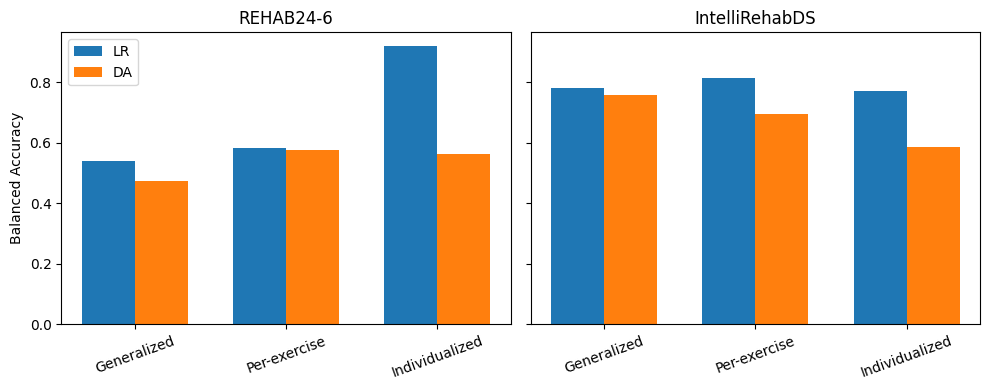

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# --------------------------
# REHAB24-6
# --------------------------

rehab_lr_gen = 0.541
rehab_lr_gen_std = 0.062
rehab_da_gen = 0.473
rehab_da_gen_std = 0.036

rehab_lr_per_ex = np.array([0.470, 0.531, 0.732, 0.544, 0.549, 0.677])
rehab_da_per_ex = np.array([0.525, 0.528, 0.672, 0.592, 0.553, 0.591])

rehab_lr_ind = 0.920
rehab_lr_ind_std = 0.070
rehab_da_ind = 0.564
rehab_da_ind_std = 0.064


# --------------------------
# IntelliRehabDS
# --------------------------

intelli_lr_gen = 0.783
intelli_lr_gen_std = 0.060
intelli_da_gen = 0.759
intelli_da_gen_std = 0.081

intelli_lr_per_ex = np.array([
    0.950226, 0.800157, 0.923820, 0.905992,
    0.734605, 0.888643, 0.866179, 0.678879, 0.581008
])

intelli_da_per_ex = np.array([
    0.784909, 0.650754, 0.830305, 0.691320,
    0.792301, 0.720076, 0.768254, 0.539983, 0.483970
])

intelli_lr_ind = 0.773
intelli_lr_ind_std = 0.162
intelli_da_ind = 0.585
intelli_da_ind_std = 0.125


# --------------------------
# Compute macro means
# --------------------------

rehab_lr_macro = rehab_lr_per_ex.mean()
rehab_da_macro = rehab_da_per_ex.mean()

intelli_lr_macro = intelli_lr_per_ex.mean()
intelli_da_macro = intelli_da_per_ex.mean()


# --------------------------
# Prepare figure
# --------------------------

labels = ["Generalized", "Per-exercise", "Individualized"]
x = np.arange(len(labels))
width = 0.35

fig, axes = plt.subplots(1, 2, figsize=(10,4), sharey=True)

# -------- REHAB24-6 --------
axes[0].bar(x - width/2,
            [rehab_lr_gen, rehab_lr_macro, rehab_lr_ind],
            width, label="LR")

axes[0].bar(x + width/2,
            [rehab_da_gen, rehab_da_macro, rehab_da_ind],
            width, label="DA")

axes[0].set_title("REHAB24-6")
axes[0].set_xticks(x)
axes[0].set_xticklabels(labels, rotation=20)
axes[0].set_ylabel("Balanced Accuracy")
axes[0].legend()


# -------- IntelliRehabDS --------
axes[1].bar(x - width/2,
            [intelli_lr_gen, intelli_lr_macro, intelli_lr_ind],
            width, label="LR")

axes[1].bar(x + width/2,
            [intelli_da_gen, intelli_da_macro, intelli_da_ind],
            width, label="DA")

axes[1].set_title("IntelliRehabDS")
axes[1].set_xticks(x)
axes[1].set_xticklabels(labels, rotation=20)

plt.tight_layout()
plt.show()

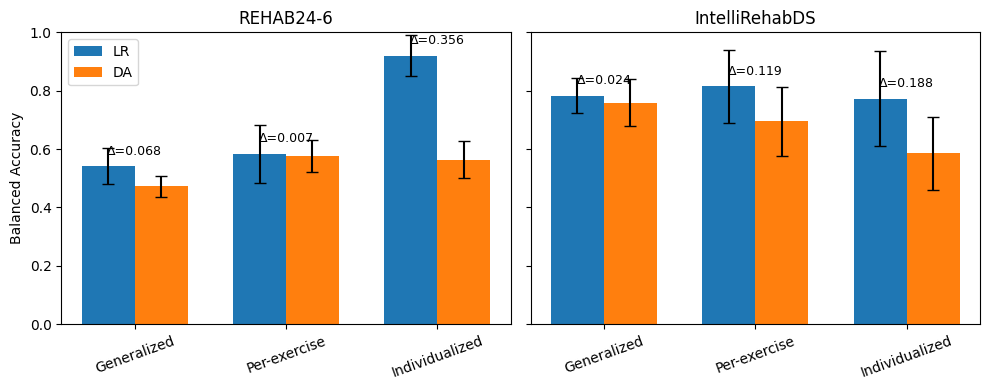

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

labels = ["Generalized", "Per-exercise", "Individualized"]
x = np.arange(len(labels))
width = 0.35

# --------------------------
# REHAB24-6
# --------------------------

rehab_lr_gen = 0.541
rehab_lr_gen_std = 0.062
rehab_da_gen = 0.473
rehab_da_gen_std = 0.036

rehab_lr_per_ex = np.array([0.470, 0.531, 0.732, 0.544, 0.549, 0.677])
rehab_da_per_ex = np.array([0.525, 0.528, 0.672, 0.592, 0.553, 0.591])

rehab_lr_ind = 0.920
rehab_lr_ind_std = 0.070
rehab_da_ind = 0.564
rehab_da_ind_std = 0.064


# --------------------------
# IntelliRehabDS
# --------------------------

intelli_lr_gen = 0.783
intelli_lr_gen_std = 0.060
intelli_da_gen = 0.759
intelli_da_gen_std = 0.081

intelli_lr_per_ex = np.array([
    0.950226, 0.800157, 0.923820, 0.905992,
    0.734605, 0.888643, 0.866179, 0.678879, 0.581008
])

intelli_da_per_ex = np.array([
    0.784909, 0.650754, 0.830305, 0.691320,
    0.792301, 0.720076, 0.768254, 0.539983, 0.483970
])

intelli_lr_ind = 0.773
intelli_lr_ind_std = 0.162
intelli_da_ind = 0.585
intelli_da_ind_std = 0.125

# --- Per-exercise: mean + std across exercises ---
rehab_lr_macro = rehab_lr_per_ex.mean()
rehab_lr_macro_std = rehab_lr_per_ex.std(ddof=1)
rehab_da_macro = rehab_da_per_ex.mean()
rehab_da_macro_std = rehab_da_per_ex.std(ddof=1)

intelli_lr_macro = intelli_lr_per_ex.mean()
intelli_lr_macro_std = intelli_lr_per_ex.std(ddof=1)
intelli_da_macro = intelli_da_per_ex.mean()
intelli_da_macro_std = intelli_da_per_ex.std(ddof=1)

# Pack means and stds in regime order
rehab_lr_means = [rehab_lr_gen, rehab_lr_macro, rehab_lr_ind]
rehab_lr_stds  = [rehab_lr_gen_std, rehab_lr_macro_std, rehab_lr_ind_std]
rehab_da_means = [rehab_da_gen, rehab_da_macro, rehab_da_ind]
rehab_da_stds  = [rehab_da_gen_std, rehab_da_macro_std, rehab_da_ind_std]

int_lr_means = [intelli_lr_gen, intelli_lr_macro, intelli_lr_ind]
int_lr_stds  = [intelli_lr_gen_std, intelli_lr_macro_std, intelli_lr_ind_std]
int_da_means = [intelli_da_gen, intelli_da_macro, intelli_da_ind]
int_da_stds  = [intelli_da_gen_std, intelli_da_macro_std, intelli_da_ind_std]

fig, axes = plt.subplots(1, 2, figsize=(10, 4), sharey=True)

def add_delta_labels(ax, lr_means, da_means):
    for i, (m1, m2) in enumerate(zip(lr_means, da_means)):
        delta = m1 - m2
        ymax = max(m1, m2)
        ax.text(i, ymax + 0.03, f"Δ={delta:.3f}", ha="center", va="bottom", fontsize=9)

# --- REHAB24-6 ---
ax = axes[0]
ax.bar(x - width/2, rehab_lr_means, width, yerr=rehab_lr_stds, capsize=4, label="LR")
ax.bar(x + width/2, rehab_da_means, width, yerr=rehab_da_stds, capsize=4, label="DA")
ax.set_title("REHAB24-6")
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=20)
ax.set_ylabel("Balanced Accuracy")
ax.legend()
add_delta_labels(ax, rehab_lr_means, rehab_da_means)

# --- IntelliRehabDS ---
ax = axes[1]
ax.bar(x - width/2, int_lr_means, width, yerr=int_lr_stds, capsize=4, label="LR")
ax.bar(x + width/2, int_da_means, width, yerr=int_da_stds, capsize=4, label="DA")
ax.set_title("IntelliRehabDS")
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=20)
add_delta_labels(ax, int_lr_means, int_da_means)

plt.tight_layout()
plt.ylim(0, 1.0)

plt.show()

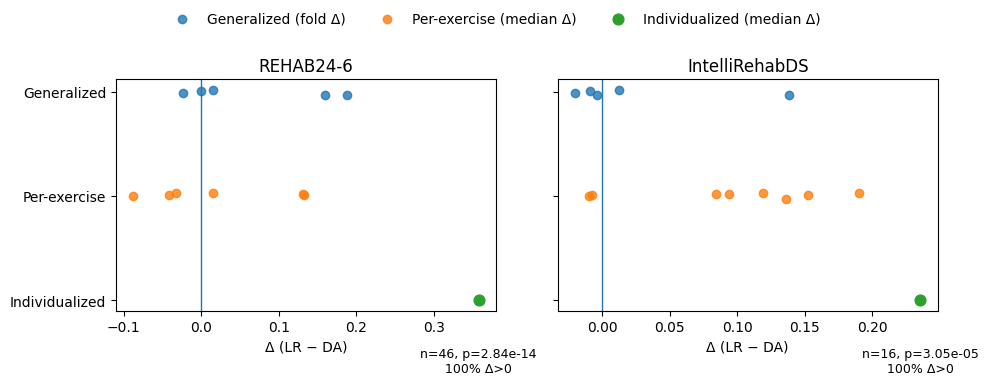

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# --------------------------
# REHAB24-6 (given)
# --------------------------
rehab_gen_deltas = np.array([-0.000224, -0.023872, 0.159835, 0.187607, 0.015114])

rehab_per_ex_medians = np.array([
    -0.032000,
    -0.041833,
    0.132273,
    -0.087471,
    0.014871,
    0.131333
])

rehab_ind_median = 0.3575
rehab_ind_n = 46
rehab_ind_p = 2.842170943040401e-14
rehab_ind_pct_pos = 1.0  # 100%

# --------------------------
# IntelliRehabDS (given)
# --------------------------
intelli_gen_deltas = np.array([-0.008975, -0.020194, 0.13789, -0.003886, 0.012369])

intelli_per_ex_medians = np.array([
    0.118651,
    -0.008000,
    0.152079,
    -0.010168,
    0.190348,
    0.094000,
    0.136205,
    0.084148
])

intelli_ind_median = 0.23541666666666664
intelli_ind_n = 16
intelli_ind_p = 3.0517578125e-05
intelli_ind_pct_pos = 1.0  # 100%

# --------------------------
# Plot helper
# --------------------------
def plot_dataset(ax, gen, per_ex, ind_median, ind_n, ind_p, ind_pct_pos, title=""):
    # y positions for the three regimes
    y_gen, y_per, y_ind = 2, 1, 0

    # Small jitter so points don't overlap perfectly (optional)
    rng = np.random.default_rng(0)
    jitter_gen = rng.uniform(-0.03, 0.03, size=len(gen))
    jitter_per = rng.uniform(-0.03, 0.03, size=len(per_ex))

    # Scatter points
    ax.scatter(gen, np.full_like(gen, y_gen) + jitter_gen, alpha=0.8, label="Generalized (fold Δ)")
    ax.scatter(per_ex, np.full_like(per_ex, y_per) + jitter_per, alpha=0.8, label="Per-exercise (median Δ)")

    # Individualized median point
    ax.scatter([ind_median], [y_ind], s=60, zorder=3, label="Individualized (median Δ)")

    # Reference line at Δ=0
    ax.axvline(0, linewidth=1)

    # Axis formatting
    ax.set_yticks([y_gen, y_per, y_ind])
    ax.set_yticklabels(["Generalized", "Per-exercise", "Individualized"])
    ax.set_xlabel("Δ (LR − DA)")
    ax.set_title(title)

    # Annotate individualized stats
    pct_txt = f"{int(ind_pct_pos*100)}% Δ>0"
    p_txt = f"p={ind_p:.2e}"
    # Slightly below the lowest regime row (Individualized)
    y_offset = -0.45  # more negative = lower

    ax.text(ind_median, y_ind + y_offset,
            f"n={ind_n}, {p_txt}\n{pct_txt}",
            ha="center", va="top", fontsize=9)


# --------------------------
# Figure
# --------------------------
fig, axes = plt.subplots(1, 2, figsize=(10, 4), sharey=True)

plot_dataset(
    axes[0],
    rehab_gen_deltas,
    rehab_per_ex_medians,
    rehab_ind_median,
    rehab_ind_n,
    rehab_ind_p,
    rehab_ind_pct_pos,
    title="REHAB24-6"
)

plot_dataset(
    axes[1],
    intelli_gen_deltas,
    intelli_per_ex_medians,
    intelli_ind_median,
    intelli_ind_n,
    intelli_ind_p,
    intelli_ind_pct_pos,
    title="IntelliRehabDS"
)

# Optional: simplify legend (show once)
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles[:3], labels[:3], loc="upper center", ncol=3, frameon=False)

plt.tight_layout(rect=[0, 0, 1, 0.9])
plt.show()

In [ ]:
gen_lr_summary = fold_df.agg({
    "bal_acc": ["mean","std"],
    "auc": ["mean","std"],
    "f1": ["mean","std"]
}).T

gen_lr_summary.columns = ["mean","std"]
gen_lr_summary

,mean,std
bal_acc,0.712650,0.143377
auc,0.834954,0.077762
f1,0.895873,0.060336


In [ ]:
gen_da_summary = ex_summary_df.copy()
gen_da_summary

exercise   bal_acc                        f1                       auc  \
                mean       std count      mean       std count      mean   
0        0  0.724692  0.199734     5  0.936016  0.051511     5  0.715674   
1        1  0.725430  0.216983     5  0.899572  0.030164     5  0.799576   
2        2  0.856557  0.091666     5  0.896087  0.138723     5  0.942191   
3        3  0.860807  0.164763     5  0.826157  0.316440     5  0.935690   
4        4  0.795104  0.186004     5  0.846021  0.208197     5  0.844646   
5        5  0.797569  0.246316     4  0.957004  0.067975     4  0.897361   
6        6  0.653333  0.211608     5  0.917234  0.069791     5  0.857896   
7        7  0.484640  0.031870     4  0.879407  0.050025     4  0.553968   
8        8  0.425199  0.104426     4  0.621478  0.255110     4  0.406428   

                   
        std count  
0  0.316608     5  
1  0.300599     5  
2  0.073303     5  
3  0.104353     5  
4  0.241457     5  
5  0.120301     4  
6  0.146304     5  
7  0.223547     4  
8  0.107032     4

In [ ]:
per_ex_lr_angles = (
    df_lr_angles
    .groupby("exercise")[["bal_acc_mean","auc_mean"]]
    .agg(["mean","std","count"])
    .reset_index()
)

per_ex_lr_angles

exercise bal_acc_mean                  auc_mean                
                   mean       std count      mean       std count
0        0     0.810000  0.141480     4  0.970000  0.025820     4
1        1     0.772333  0.154799     6  0.801333  0.214841     6
2        2     0.799810  0.221304     7  0.837514  0.265387     7
3        3     0.663462  0.314755     3  0.666667  0.416333     3
4        4     0.819479  0.106698     4  0.871875  0.113281     4
5        5     0.740556  0.071770     3  0.888889  0.096456     3
6        6     0.725000       NaN     1  0.866667       NaN     1
7        7     0.719444  0.128391     3  0.737778  0.220412     3
8        8     0.796143  0.156745     5  0.924571  0.137468     5

In [ ]:
per_ex_da = (
    df_personal_DA
    .groupby("exercise")[["bal_acc_mean","auc_mean"]]
    .agg(["mean","std","count"])
    .reset_index()
)

per_ex_da

exercise bal_acc_mean                  auc_mean                
                   mean       std count      mean       std count
0        0     0.716667       NaN     1  0.841667       NaN     1
1        1     0.643750  0.238649     2  0.673611  0.402658     2
2        2     0.594984  0.144604     5  0.762356  0.123285     5
3        3     0.817692       NaN     1  0.884615       NaN     1
4        4     0.558333  0.025000     3  0.634156  0.121457     3
5        5     0.487500       NaN     1  0.537500       NaN     1
6        6     0.508333       NaN     1  0.479167       NaN     1
7        7     0.489583       NaN     1  0.508333       NaN     1
8        8     0.658333       NaN     1  0.866667       NaN     1

In [ ]:
ind_lr_summary = df_lr_angles[["bal_acc_mean","auc_mean"]].describe()
ind_lr_summary

,bal_acc_mean,auc_mean
count,36.000000,36.000000
mean,0.772963,0.844656
std,0.162080,0.205420
min,0.330000,0.200000
25%,0.685104,0.783542
50%,0.792500,0.941067
75%,0.902500,0.988115
max,1.000000,1.000000


In [ ]:
ind_da_summary = df_personal_DA[["bal_acc_mean","auc_mean"]].describe()
ind_da_summary

,bal_acc_mean,auc_mean
count,16.000000,16.000000
mean,0.600971,0.698714
std,0.128749,0.178902
min,0.475000,0.388889
25%,0.508750,0.530208
50%,0.545833,0.690333
75%,0.672917,0.847917
max,0.850000,0.958333


In [ ]:
top_shap = (
    shap_individual_df
    .groupby(["exercise","angle"])["mean_abs_shap"]
    .mean()
    .reset_index()
    .sort_values(["exercise","mean_abs_shap"], ascending=[True,False])
)

top_shap.groupby("exercise").head(5)

,exercise,angle,mean_abs_shap
4,0,R_elbow,0.019691
7,0,R_shoulder,0.016614
0,0,L_elbow,0.016429
3,0,L_shoulder,0.011637
9,0,torso_R_dev,0.010194
15,1,R_hip,0.021449
16,1,R_knee,0.018993
10,1,L_elbow,0.017911
12,1,L_knee,0.017726
14,1,R_elbow,0.017516


In [ ]:
beta_top = (
    beta_why_individual
    .groupby(["exercise","angle"])["delta_correct_minus_incorrect"]
    .mean()
    .reset_index()
    .sort_values(["exercise","delta_correct_minus_incorrect"], ascending=[True,False])
)

beta_top.groupby("exercise").head(5)

,exercise,angle,delta_correct_minus_incorrect
1,0,L_hip,3.106534e-03
0,0,L_elbow,1.443289e-03
3,0,L_shoulder,1.172453e-03
6,0,R_knee,1.938492e-04
5,0,R_hip,1.534596e-04
19,1,torso_R_dev,2.520494e-03
14,1,R_elbow,9.317845e-04
13,1,L_shoulder,3.836118e-04
16,1,R_knee,3.627092e-04
18,1,torso_L_dev,2.663769e-04


# Robustness Checks

In [ ]:
# ============================================================
# Robustness Experiments (Minimal 13 conditions) — IntelliRehabDS
# Uses YOUR existing notebook objects:
#   - df, meta_df
#   - simplified_dir
#   - load_skeleton, map_kinect_to_coco, normalize_length
#   - compute_angle_timeseries
#   - fold_splits (DA outer splits + best_params per fold)
#   - fold_lr_angles (LR outer results with best_C per fold)
#   - train_final_and_eval (DA training+test, fixed hyperparams per fold)
#   - _make_lr, _stack_angles (LR helpers from your LR cell)
#
# IMPORTANT: No re-tuning. We reuse:
#   - DA: fold_splits[fold]["best_params"]
#   - LR: fold_lr_angles.best_C
# ============================================================

import numpy as np
import pandas as pd
from pathlib import Path
from tqdm import tqdm
from scipy.stats import wilcoxon

# -------------------------
# 0) Sanity: required objects exist
# -------------------------
required = ["df", "meta_df", "simplified_dir",
            "load_skeleton", "map_kinect_to_coco", "normalize_length", "compute_angle_timeseries",
            "fold_splits", "fold_lr_angles",
            "train_final_and_eval", "_make_lr", "_stack_angles"]
missing = [x for x in required if x not in globals()]
assert not missing, f"Missing required objects: {missing}"

TARGET_LEN = 100

# -------------------------
# 1) Robust scale (for jitter) + interpolation utilities
# -------------------------
def body_scale(seq, mode="shoulder_width"):
    # COCO indices in your mapping
    L_SHOULDER, R_SHOULDER = 5, 6
    L_HIP, R_HIP = 11, 12

    S = seq.astype(float).copy()
    if np.isnan(S).any():
        med = np.nanmedian(S, axis=0, keepdims=True)
        S = np.where(np.isnan(S), med, S)

    if mode == "shoulder_width":
        sw = np.linalg.norm(S[:, R_SHOULDER, :] - S[:, L_SHOULDER, :], axis=1)
        s = float(np.median(sw))
        if np.isfinite(s) and s > 1e-8:
            return s

    if mode == "torso_len":
        mid_sh = 0.5 * (S[:, L_SHOULDER, :] + S[:, R_SHOULDER, :])
        mid_hip = 0.5 * (S[:, L_HIP, :] + S[:, R_HIP, :])
        tl = np.linalg.norm(mid_sh - mid_hip, axis=1)
        s = float(np.median(tl))
        if np.isfinite(s) and s > 1e-8:
            return s

    return max(float(np.nanstd(S)), 1e-6)

def _interp1d_nan(x):
    x = x.astype(float)
    n = len(x)
    idx = np.arange(n)
    mask = ~np.isnan(x)
    if mask.sum() == 0:
        return np.zeros_like(x)
    if mask.sum() == 1:
        return np.full_like(x, x[mask][0])
    x[~mask] = np.interp(idx[~mask], idx[mask], x[mask])
    return x

def interpolate_missing(seq):
    # seq: (T,J,D) with NaNs
    out = seq.astype(float).copy()
    T, J, D = out.shape
    for j in range(J):
        for d in range(D):
            out[:, j, d] = _interp1d_nan(out[:, j, d])
    return out

def resample_sequence(seq, target_T=100):
    # linear interpolation over time axis
    T = seq.shape[0]
    if T == target_T:
        return seq.astype(np.float32)
    x_old = np.linspace(0.0, 1.0, T)
    x_new = np.linspace(0.0, 1.0, target_T)
    flat = seq.reshape(T, -1).astype(float)
    out = np.zeros((target_T, flat.shape[1]), dtype=float)
    for k in range(flat.shape[1]):
        out[:, k] = np.interp(x_new, x_old, flat[:, k])
    return out.reshape((target_T,) + seq.shape[1:]).astype(np.float32)

# -------------------------
# 2) Corruptions on keypoints (seq: 100x17x3)
# -------------------------
def add_jitter(seq, alpha, rng, scale_mode="shoulder_width"):
    if alpha <= 0:
        return seq.astype(np.float32)
    s = body_scale(seq, mode=scale_mode)
    noise = rng.normal(0.0, alpha * s, size=seq.shape)
    return (seq + noise).astype(np.float32)

def joint_dropout(seq, p, rng, extremity_biased=False, extremity_mult=2.0):
    if p <= 0:
        return seq.astype(np.float32)
    T, J, D = seq.shape
    drop_prob = np.full((J,), p, dtype=float)
    if extremity_biased:
        # wrists/ankles in COCO
        for j in [9, 10, 15, 16]:
            if j < J:
                drop_prob[j] = min(1.0, p * extremity_mult)

    mask = rng.random((T, J)) < drop_prob[None, :]
    out = seq.astype(float).copy()
    out[mask, :] = np.nan
    out = interpolate_missing(out)
    return out.astype(np.float32)

def burst_occlusion(seq, frac, rng, joints_pool=None):
    if frac <= 0:
        return seq.astype(np.float32)
    T, J, D = seq.shape
    L = int(round(frac * T))
    L = max(1, min(L, T))
    if joints_pool is None:
        joints_pool = [7, 8, 9, 10, 13, 14, 15, 16]  # elbows/wrists/knees/ankles
        joints_pool = [j for j in joints_pool if j < J] or list(range(J))
    joint = int(rng.choice(joints_pool))
    start = int(rng.integers(0, T - L + 1))
    end = start + L
    out = seq.astype(float).copy()
    out[start:end, joint, :] = np.nan
    out = interpolate_missing(out)
    return out.astype(np.float32)

def frame_drop(seq, q, rng, target_T=100):
    # delete q% frames then resample back to target_T
    if q <= 0:
        return resample_sequence(seq, target_T)
    T = seq.shape[0]
    n_drop = int(round(q * T))
    n_drop = min(max(n_drop, 1), T - 2)
    idx_all = np.arange(T)
    drop_idx = rng.choice(idx_all, size=n_drop, replace=False)
    keep_idx = np.sort(np.setdiff1d(idx_all, drop_idx))
    kept = seq[keep_idx]
    return resample_sequence(kept, target_T)

# -------------------------
# 3) Experiment matrix (minimal 13)
# -------------------------
def build_conditions():
    conds = []
    for a in [0.00, 0.01, 0.02, 0.05]:
        conds.append(("jitter", {"alpha": a}))
    for p in [0.05, 0.10, 0.20]:
        conds.append(("dropout", {"p": p, "extremity_biased": False}))
    for f in [0.10, 0.25, 0.40]:
        conds.append(("burst", {"frac": f}))
    for q in [0.05, 0.10, 0.20]:
        conds.append(("framedrop", {"q": q}))
    return conds

def apply_condition(seq, family, params, rng):
    if family == "jitter":
        return add_jitter(seq, params["alpha"], rng)
    if family == "dropout":
        return joint_dropout(seq, params["p"], rng, extremity_biased=params.get("extremity_biased", False))
    if family == "burst":
        return burst_occlusion(seq, params["frac"], rng)
    if family == "framedrop":
        return frame_drop(seq, params["q"], rng, target_T=TARGET_LEN)
    raise ValueError(f"Unknown family: {family}")

def forward_fill_missing(seq):
    out = seq.copy().astype(float)
    T,J,D = out.shape
    for j in range(J):
        for d in range(D):
            x = out[:,j,d]
            # forward fill NaNs
            for t in range(1,T):
                if np.isnan(x[t]):
                    x[t] = x[t-1]
            # if starting NaNs remain, backfill with first non-NaN
            if np.isnan(x[0]):
                first = np.where(~np.isnan(x))[0]
                x[:] = 0.0 if len(first)==0 else x[first[0]]
            out[:,j,d] = x
    return out.astype(np.float32)

# -------------------------
# 4) Cache clean COCO sequences once (trial_id -> (100,17,3))
# -------------------------
# Map: trial_id -> filename (from df)
tid_to_file = df.drop_duplicates("trial_id").set_index("trial_id")["filename"].to_dict()

coco_cache = {}
for tid in tqdm(meta_df["trial_id"].tolist(), desc="Caching clean COCO sequences"):
    fpath = Path(simplified_dir) / tid_to_file[tid]
    skel = load_skeleton(fpath)                 # (T,25,3)
    coco = map_kinect_to_coco(skel)             # (T,17,3)
    coco = normalize_length(coco, TARGET_LEN)   # (100,17,3)
    coco_cache[tid] = coco.astype(np.float32)

print("Cached sequences:", len(coco_cache))

Caching clean COCO sequences: 100%|██████████| 2577/2577 [00:11<00:00, 215.26it/s]

Cached sequences: 2577


In [ ]:
# -------------------------
# 5) Evaluation (NO retuning)
# -------------------------
def eval_lr_generalized_fixedC(angles_cache_corrupted, fold_lr_angles, meta_df):
    # use outer splits exactly as in DA (fold_splits) OR recompute with GroupKFold
    # Here we reuse fold_splits to guarantee identical outer folds across models.
    bals = []
    bestCs = []

    # fold_lr_angles has rows for folds 1..5 with best_C
    bestC_map = fold_lr_angles.set_index("fold")["best_C"].to_dict()

    for fold in sorted(fold_splits.keys()):
        meta_tr = fold_splits[fold]["train_meta"]
        meta_te = fold_splits[fold]["test_meta"]

        C = float(bestC_map[fold])
        clf = _make_lr(C=C)

        Xtr, ytr, _ = _stack_angles(meta_tr, angles_cache_corrupted)
        Xte, yte, _ = _stack_angles(meta_te, angles_cache_corrupted)

        # guard: skip degenerate test
        if len(np.unique(yte)) < 2:
            bals.append(np.nan); bestCs.append(C); continue

        clf.fit(Xtr, ytr)
        p1 = clf.predict_proba(Xte)[:, 1]
        yhat = (p1 >= 0.5).astype(int)

        from sklearn.metrics import balanced_accuracy_score
        bal = balanced_accuracy_score(yte, yhat)
        bals.append(float(bal))
        bestCs.append(C)

    return np.array(bals, dtype=float), np.array(bestCs, dtype=float)

def eval_da_generalized_fixedParams(angles_cache_corrupted):
    bals = []
    params_used = []

    for fold in sorted(fold_splits.keys()):
        meta_tr = fold_splits[fold]["train_meta"]
        meta_te = fold_splits[fold]["test_meta"]
        params  = fold_splits[fold]["best_params"]  # from clean tuning

        rep, _ = train_final_and_eval(meta_tr, meta_te, angles_cache_corrupted, params, epochs=60)
        bals.append(float(rep["bal_acc"]))
        params_used.append(params)

    return np.array(bals, dtype=float), params_used

# -------------------------
# 6) Run robustness grid
# -------------------------
conditions = build_conditions()

robust_rows = []

In [ ]:
# -------------------------
# 5) Evaluation (NO retuning)
# -------------------------
def eval_lr_generalized_fixedC(angles_cache_corrupted, fold_lr_angles, meta_df):
    # use outer splits exactly as in DA (fold_splits) OR recompute with GroupKFold
    # Here we reuse fold_splits to guarantee identical outer folds across models.
    bals = []
    bestCs = []

    # fold_lr_angles has rows for folds 1..5 with best_C
    bestC_map = fold_lr_angles.set_index("fold")["best_C"].to_dict()

    for fold in sorted(fold_splits.keys()):
        meta_tr = fold_splits[fold]["train_meta"]
        meta_te = fold_splits[fold]["test_meta"]

        C = float(bestC_map[fold])
        clf = _make_lr(C=C)

        Xtr, ytr, _ = _stack_angles(meta_tr, angles_cache_corrupted)
        Xte, yte, _ = _stack_angles(meta_te, angles_cache_corrupted)

        # guard: skip degenerate test
        if len(np.unique(yte)) < 2:
            bals.append(np.nan); bestCs.append(C); continue

        clf.fit(Xtr, ytr)
        p1 = clf.predict_proba(Xte)[:, 1]
        yhat = (p1 >= 0.5).astype(int)

        from sklearn.metrics import balanced_accuracy_score
        bal = balanced_accuracy_score(yte, yhat)
        bals.append(float(bal))
        bestCs.append(C)

    return np.array(bals, dtype=float), np.array(bestCs, dtype=float)

def eval_da_generalized_fixedParams(angles_cache_corrupted):
    bals = []
    params_used = []

    for fold in sorted(fold_splits.keys()):
        meta_tr = fold_splits[fold]["train_meta"]
        meta_te = fold_splits[fold]["test_meta"]
        params  = fold_splits[fold]["best_params"]  # from clean tuning

        rep, _ = train_final_and_eval(meta_tr, meta_te, angles_cache_corrupted, params, epochs=60)
        bals.append(float(rep["bal_acc"]))
        params_used.append(params)

    return np.array(bals, dtype=float), params_used

# -------------------------
# 6) Run robustness grid
# -------------------------
conditions = build_conditions()

robust_rows = []

In [ ]:
import time

def _fmt_s(x):
    return f"{x:.1f}s"

def log(msg):
    print(msg, flush=True)

In [ ]:
import time
import numpy as np
import pandas as pd
from sklearn.metrics import balanced_accuracy_score

def log(msg):
    print(msg, flush=True)

TARGET_LEN = 100

log("\n[INIT] Building clean angles cache for all trials...")
t0 = time.perf_counter()

angles_clean = {}
for tid, seq in coco_cache.items():
    angles_clean[tid] = compute_angle_timeseries(seq).astype(np.float32)

t1 = time.perf_counter()
log(f"[DONE] angles_clean built for {len(angles_clean)} trials in {t1-t0:.1f}s")


[INIT] Building clean angles cache for all trials...
[DONE] angles_clean built for 2577 trials in 3.2s


In [ ]:
import torch

# --- fold maps
bestC_map = fold_lr_angles.set_index("fold")["best_C"].to_dict()

da_models = {}     # fold -> torch model
da_params = {}     # fold -> params dict (batch etc.)
lr_models = {}     # fold -> fitted sklearn pipeline

# Optionally store clean baseline fold scores
baseline_rows = []

log("\n[TRAIN] Training DA & LR once per fold on CLEAN data...")
t0 = time.perf_counter()

for fold in sorted(fold_splits.keys()):
    meta_tr = fold_splits[fold]["train_meta"]
    meta_te = fold_splits[fold]["test_meta"]
    params  = fold_splits[fold]["best_params"]

    log(f"\n  [Fold {fold}/5] DA: training on clean train split...")
    rep_clean, model = train_final_and_eval(meta_tr, meta_te, angles_clean, params, epochs=60)
    da_models[fold] = model
    da_params[fold] = params
    log(f"  [Fold {fold}/5] DA clean bal_acc={rep_clean['bal_acc']:.4f}")

    log(f"  [Fold {fold}/5] LR: fitting on clean train split (C={bestC_map[fold]})...")
    clf = _make_lr(C=float(bestC_map[fold]))
    Xtr, ytr, _ = _stack_angles(meta_tr, angles_clean)
    clf.fit(Xtr, ytr)
    lr_models[fold] = clf

    # LR clean test (optional baseline)
    Xte, yte, _ = _stack_angles(meta_te, angles_clean)
    p1 = clf.predict_proba(Xte)[:, 1]
    yhat = (p1 >= 0.5).astype(int)
    lr_bal = balanced_accuracy_score(yte, yhat)
    log(f"  [Fold {fold}/5] LR clean bal_acc={lr_bal:.4f}")

    baseline_rows.append({
        "fold": fold,
        "da_bal_clean": rep_clean["bal_acc"],
        "lr_bal_clean": lr_bal
    })

t1 = time.perf_counter()
log(f"\n[DONE] Pretraining completed in {t1-t0:.1f}s")
baseline_df = pd.DataFrame(baseline_rows)
display(baseline_df)


[TRAIN] Training DA & LR once per fold on CLEAN data...

  [Fold 1/5] DA: training on clean train split...
  [Fold 1/5] DA clean bal_acc=0.7013
  [Fold 1/5] LR: fitting on clean train split (C=0.03)...
  [Fold 1/5] LR clean bal_acc=0.7577

  [Fold 2/5] DA: training on clean train split...
  [Fold 2/5] DA clean bal_acc=0.6837
  [Fold 2/5] LR: fitting on clean train split (C=0.03)...
  [Fold 2/5] LR clean bal_acc=0.7478

  [Fold 3/5] DA: training on clean train split...
  [Fold 3/5] DA clean bal_acc=0.6649
  [Fold 3/5] LR: fitting on clean train split (C=0.03)...
  [Fold 3/5] LR clean bal_acc=0.7943

  [Fold 4/5] DA: training on clean train split...
  [Fold 4/5] DA clean bal_acc=0.7799
  [Fold 4/5] LR: fitting on clean train split (C=0.1)...
  [Fold 4/5] LR clean bal_acc=0.7326

  [Fold 5/5] DA: training on clean train split...
  [Fold 5/5] DA clean bal_acc=0.8542
  [Fold 5/5] LR: fitting on clean train split (C=0.01)...
  [Fold 5/5] LR clean bal_acc=0.8818

[DONE] Pretraining completed

,fold,da_bal_clean,lr_bal_clean
0,1,0.701282,0.757692
1,2,0.683694,0.747839
2,3,0.664914,0.794332
3,4,0.779908,0.732579
4,5,0.854238,0.881820


In [ ]:
from sklearn.metrics import roc_auc_score, f1_score, confusion_matrix

def eval_da_pretrained_on_meta(model, meta_test, angles_cache_for_test, batch):
    """
    Evaluates a pretrained DA model on a given meta_test, using angles_cache_for_test (only needs test tids).
    """
    model.eval()
    test_loader, test_ds = make_loaders_from_meta(meta_df, angles_cache_for_test,
                                                  meta_test["trial_id"].tolist(),
                                                  batch=batch, shuffle=False)
    y_true, y_hat, p1 = [], [], []
    with torch.no_grad():
        for X, y, _ in test_loader:
            X = X.to(device)
            logits, _, _ = model(X)
            prob1 = torch.softmax(logits, dim=1)[:, 1].cpu().numpy()
            pred = torch.argmax(logits, dim=1).cpu().numpy()
            y_true.append(y.numpy()); y_hat.append(pred); p1.append(prob1)

    y_true = np.concatenate(y_true)
    y_hat  = np.concatenate(y_hat)
    p1     = np.concatenate(p1)

    bal = balanced_accuracy_score(y_true, y_hat)
    return bal

In [ ]:
def eval_lr_prefit_on_meta(clf, meta_test, angles_cache_for_test):
    Xte, yte, _ = _stack_angles(meta_test, angles_cache_for_test)
    if len(np.unique(yte)) < 2:
        return np.nan
    p1 = clf.predict_proba(Xte)[:, 1]
    yhat = (p1 >= 0.5).astype(int)
    return balanced_accuracy_score(yte, yhat)

In [ ]:
import time

M = 10
BASE_SEED = 2024
PRINT_EVERY_TRIALS = 700  # set None to disable trial progress

def get_level(family, params):
    if family == "jitter":    return float(params["alpha"])
    if family == "dropout":   return float(params["p"])
    if family == "burst":     return float(params["frac"])
    if family == "framedrop": return float(params["q"])
    return np.nan

conditions = build_conditions()

long_rows = []
sum_rows  = []

log("\n[ROBUST] Starting robustness (train clean, corrupt TEST at inference)...")

t_global0 = time.perf_counter()
for ci, (family, params) in enumerate(conditions, start=1):
    level = get_level(family, params)
    cond_name = f"{family}:{params}"
    log(f"\n=== Condition {ci}/{len(conditions)}: {cond_name} | level={level} ===")

    lr_seed_means = []
    da_seed_means = []

    for rep in range(M):
        log(f"  [Seed {rep+1}/{M}] Building corrupted angles (all trials, once)...")
        t0 = time.perf_counter()
        rng = np.random.default_rng(BASE_SEED + 1000*(ci-1) + rep)

        # Build corrupted angles for all trials ONCE (cheap) — reused across all folds
        angles_cor = {}
        n_trials = len(coco_cache)
        for k, (tid, seq) in enumerate(coco_cache.items(), start=1):
            seq_cor = apply_condition(seq, family, params, rng)
            angles_cor[tid] = compute_angle_timeseries(seq_cor).astype(np.float32)
            if PRINT_EVERY_TRIALS and (k % PRINT_EVERY_TRIALS == 0):
                log(f"    ... corrupted angles for {k}/{n_trials} trials")

        t1 = time.perf_counter()
        log(f"  [Seed {rep+1}/{M}] Done corruption+angles in {t1-t0:.1f}s")

        # Evaluate all folds with pretrained models (fast)
        lr_fold_ba = []
        da_fold_ba = []

        log(f"  [Seed {rep+1}/{M}] Evaluating folds (no retraining)...")
        t2 = time.perf_counter()

        for fold in sorted(fold_splits.keys()):
            meta_te = fold_splits[fold]["test_meta"]

            # LR
            lr_b = eval_lr_prefit_on_meta(lr_models[fold], meta_te, angles_cor)
            lr_fold_ba.append(lr_b)

            # DA
            batch = da_params[fold]["batch"]
            da_b = eval_da_pretrained_on_meta(da_models[fold], meta_te, angles_cor, batch=batch)
            da_fold_ba.append(da_b)

        lr_mean = float(np.nanmean(lr_fold_ba))
        da_mean = float(np.nanmean(da_fold_ba))

        t3 = time.perf_counter()
        log(f"  [Seed {rep+1}/{M}] LR mean BA={lr_mean:.4f} | DA mean BA={da_mean:.4f} | time={t3-t2:.1f}s")

        lr_seed_means.append(lr_mean)
        da_seed_means.append(da_mean)

        long_rows.append({"condition": cond_name, "family": family, "level": level, "seed_rep": rep, "model": "LR", "ba_mean": lr_mean})
        long_rows.append({"condition": cond_name, "family": family, "level": level, "seed_rep": rep, "model": "DA", "ba_mean": da_mean})

    # summarize per condition
    lr_seed_means = np.array(lr_seed_means, dtype=float)
    da_seed_means = np.array(da_seed_means, dtype=float)
    gap = lr_seed_means - da_seed_means

    sum_rows.append({
        "condition": cond_name,
        "family": family,
        "level": level,
        "params": str(params),
        "lr_mean_over_seeds": float(lr_seed_means.mean()),
        "lr_std_over_seeds":  float(lr_seed_means.std(ddof=1)),
        "da_mean_over_seeds": float(da_seed_means.mean()),
        "da_std_over_seeds":  float(da_seed_means.std(ddof=1)),
        "gap_mean_over_seeds": float(gap.mean()),
        "gap_std_over_seeds":  float(gap.std(ddof=1)),
    })

    log(f"--- Summary {cond_name}: LR={lr_seed_means.mean():.4f}±{lr_seed_means.std(ddof=1):.4f} "
        f"| DA={da_seed_means.mean():.4f}±{da_seed_means.std(ddof=1):.4f} | gap={gap.mean():+.4f} ---")

t_global1 = time.perf_counter()
log(f"\n[DONE] Robustness finished in {(t_global1-t_global0)/60:.1f} minutes")

df_long  = pd.DataFrame(long_rows)
robust_df = pd.DataFrame(sum_rows)

display(robust_df)


[ROBUST] Starting robustness (train clean, corrupt TEST at inference)...

=== Condition 1/13: jitter:{'alpha': 0.0} | level=0.0 ===
  [Seed 1/10] Building corrupted angles (all trials, once)...
    ... corrupted angles for 700/2577 trials
    ... corrupted angles for 1400/2577 trials
    ... corrupted angles for 2100/2577 trials
  [Seed 1/10] Done corruption+angles in 1.4s
  [Seed 1/10] Evaluating folds (no retraining)...
  [Seed 1/10] LR mean BA=0.7829 | DA mean BA=0.7368 | time=0.7s
  [Seed 2/10] Building corrupted angles (all trials, once)...
    ... corrupted angles for 700/2577 trials
    ... corrupted angles for 1400/2577 trials
    ... corrupted angles for 2100/2577 trials
  [Seed 2/10] Done corruption+angles in 1.8s
  [Seed 2/10] Evaluating folds (no retraining)...
  [Seed 2/10] LR mean BA=0.7829 | DA mean BA=0.7368 | time=0.7s
  [Seed 3/10] Building corrupted angles (all trials, once)...
    ... corrupted angles for 700/2577 trials
    ... corrupted angles for 1400/2577 trial

,condition,family,level,params,lr_mean_over_seeds,lr_std_over_seeds,da_mean_over_seeds,da_std_over_seeds,gap_mean_over_seeds,gap_std_over_seeds
0,jitter:{'alpha': 0.0},jitter,0.00,{'alpha': 0.0},0.782852,0.000000,0.736807,0.000000,0.046045,0.000000
1,jitter:{'alpha': 0.01},jitter,0.01,{'alpha': 0.01},0.779723,0.004636,0.737261,0.002128,0.042462,0.005502
2,jitter:{'alpha': 0.02},jitter,0.02,{'alpha': 0.02},0.779706,0.008550,0.737208,0.002326,0.042498,0.009164
3,jitter:{'alpha': 0.05},jitter,0.05,{'alpha': 0.05},0.766701,0.007933,0.742008,0.002376,0.024693,0.008547
4,"dropout:{'p': 0.05, 'extremity_biased': False}",dropout,0.05,"{'p': 0.05, 'extremity_biased': False}",0.781550,0.002298,0.737012,0.000531,0.044538,0.002402
5,"dropout:{'p': 0.1, 'extremity_biased': False}",dropout,0.10,"{'p': 0.1, 'extremity_biased': False}",0.780165,0.002434,0.737039,0.000589,0.043126,0.002604
6,"dropout:{'p': 0.2, 'extremity_biased': False}",dropout,0.20,"{'p': 0.2, 'extremity_biased': False}",0.781936,0.002989,0.736625,0.000729,0.045311,0.003061
7,burst:{'frac': 0.1},burst,0.10,{'frac': 0.1},0.782261,0.001718,0.736828,0.000732,0.045434,0.002148
8,burst:{'frac': 0.25},burst,0.25,{'frac': 0.25},0.779297,0.004068,0.736248,0.001159,0.043049,0.003658
9,burst:{'frac': 0.4},burst,0.40,{'frac': 0.4},0.774846,0.004492,0.731510,0.006947,0.043337,0.008399


In [ ]:
df_long  = pd.DataFrame(long_rows)
robust_df = pd.DataFrame(sum_rows)
display(robust_df)

,condition,family,level,params,lr_mean_over_seeds,lr_std_over_seeds,da_mean_over_seeds,da_std_over_seeds,gap_mean_over_seeds,gap_std_over_seeds
0,jitter:{'alpha': 0.0},jitter,0.00,{'alpha': 0.0},0.782852,0.000000,0.736807,0.000000,0.046045,0.000000
1,jitter:{'alpha': 0.01},jitter,0.01,{'alpha': 0.01},0.779723,0.004636,0.737261,0.002128,0.042462,0.005502
2,jitter:{'alpha': 0.02},jitter,0.02,{'alpha': 0.02},0.779706,0.008550,0.737208,0.002326,0.042498,0.009164
3,jitter:{'alpha': 0.05},jitter,0.05,{'alpha': 0.05},0.766701,0.007933,0.742008,0.002376,0.024693,0.008547
4,"dropout:{'p': 0.05, 'extremity_biased': False}",dropout,0.05,"{'p': 0.05, 'extremity_biased': False}",0.781550,0.002298,0.737012,0.000531,0.044538,0.002402
5,"dropout:{'p': 0.1, 'extremity_biased': False}",dropout,0.10,"{'p': 0.1, 'extremity_biased': False}",0.780165,0.002434,0.737039,0.000589,0.043126,0.002604
6,"dropout:{'p': 0.2, 'extremity_biased': False}",dropout,0.20,"{'p': 0.2, 'extremity_biased': False}",0.781936,0.002989,0.736625,0.000729,0.045311,0.003061
7,burst:{'frac': 0.1},burst,0.10,{'frac': 0.1},0.782261,0.001718,0.736828,0.000732,0.045434,0.002148
8,burst:{'frac': 0.25},burst,0.25,{'frac': 0.25},0.779297,0.004068,0.736248,0.001159,0.043049,0.003658
9,burst:{'frac': 0.4},burst,0.40,{'frac': 0.4},0.774846,0.004492,0.731510,0.006947,0.043337,0.008399


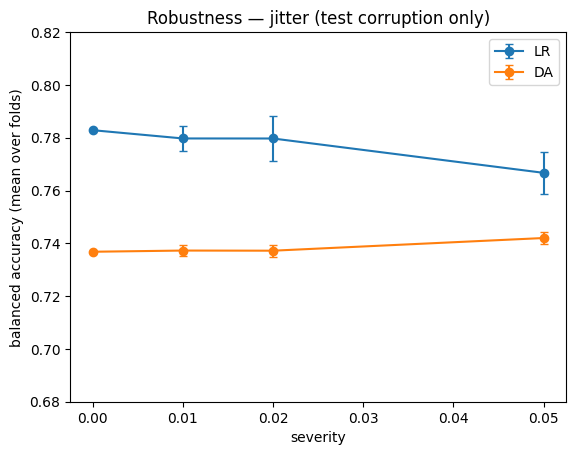

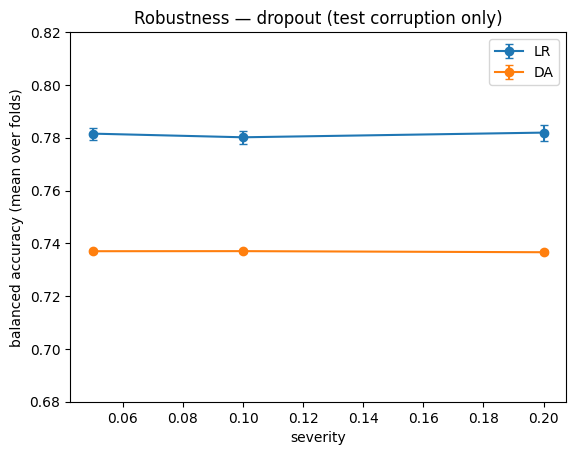

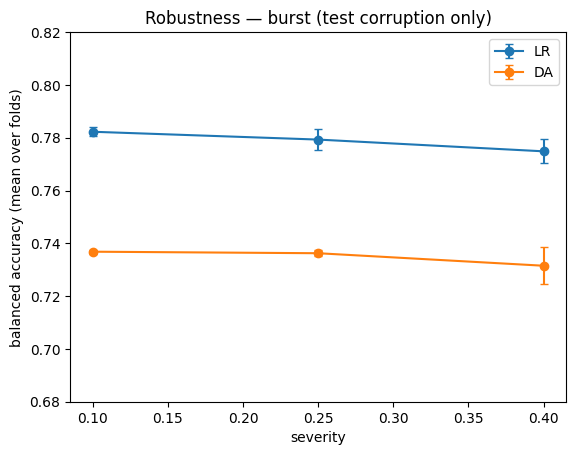

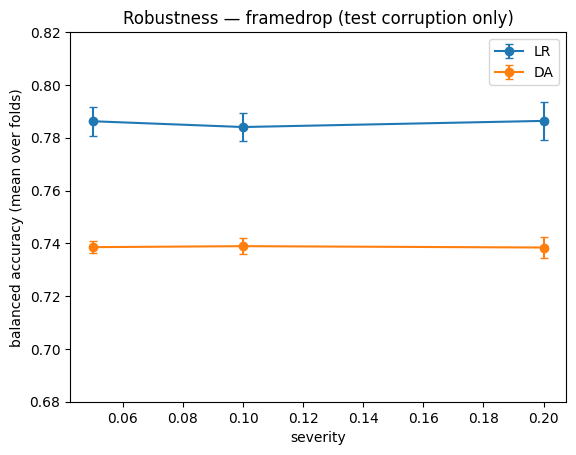

In [ ]:
import matplotlib.pyplot as plt

def plot_family(df_long, family, ylim=None):
    sub = df_long[df_long["family"] == family].copy()
    agg = (sub.groupby(["level","model"])["ba_mean"]
             .agg(["mean","std"])
             .reset_index()
             .sort_values("level"))
    plt.figure()
    for model in ["LR","DA"]:
        m = agg[agg["model"] == model]
        plt.errorbar(m["level"], m["mean"], yerr=m["std"], marker="o", capsize=3, label=model)
    plt.xlabel("severity")
    plt.ylabel("balanced accuracy (mean over folds)")
    plt.title(f"Robustness — {family} (test corruption only)")
    if ylim: plt.ylim(*ylim)
    plt.legend()
    plt.show()

for fam in ["jitter","dropout","burst","framedrop"]:
    plot_family(df_long, fam, ylim=(0.68, 0.82))

In [ ]:
import numpy as np
import pandas as pd

def compute_slope_table(df_long):
    rows = []
    for fam in df_long["family"].unique():
        sub = df_long[df_long["family"] == fam].copy()

        # aggregate over seeds at each level
        agg = (sub.groupby(["level", "model"])["ba_mean"]
                  .mean()
                  .reset_index())

        for model in ["LR", "DA"]:
            m = agg[agg["model"] == model].sort_values("level")
            x = m["level"].values.astype(float)
            y = m["ba_mean"].values.astype(float)

            # linear fit y = a + b x
            b, a = np.polyfit(x, y, 1)

            rows.append({
                "family": fam,
                "model": model,
                "slope_ba_per_severity": float(b),
                "intercept": float(a),
                "levels": len(x),
                "ba_at_min": float(y[0]),
                "ba_at_max": float(y[-1]),
                "delta_max_minus_min": float(y[-1] - y[0])
            })

    slope_df = pd.DataFrame(rows).sort_values(["family", "model"])
    # pivot view: LR vs DA slopes side by side
    slope_pivot = slope_df.pivot(index="family", columns="model", values="slope_ba_per_severity")
    slope_pivot["slope_gap_LR_minus_DA"] = slope_pivot["LR"] - slope_pivot["DA"]
    slope_pivot = slope_pivot.reset_index()

    return slope_df, slope_pivot

slope_df, slope_pivot = compute_slope_table(df_long)
display(slope_df)
display(slope_pivot)

,family,model,slope_ba_per_severity,intercept,levels,ba_at_min,ba_at_max,delta_max_minus_min
5,burst,DA,-0.017725,0.739293,3,0.736828,0.731510,-0.005318
4,burst,LR,-0.024716,0.784980,3,0.782261,0.774846,-0.007415
3,dropout,DA,-0.002804,0.737219,3,0.737012,0.736625,-0.000387
2,dropout,LR,0.004736,0.780664,3,0.781550,0.781936,0.000386
7,framedrop,DA,-0.001518,0.738803,3,0.738547,0.738409,-0.000138
6,framedrop,LR,0.004078,0.785080,3,0.786241,0.786374,0.000133
1,jitter,DA,0.108210,0.736157,4,0.736807,0.742008,0.005201
0,jitter,LR,-0.323750,0.783720,4,0.782852,0.766701,-0.016152


model,family,DA,LR,slope_gap_LR_minus_DA
0,burst,-0.017725,-0.024716,-0.006990
1,dropout,-0.002804,0.004736,0.007540
2,framedrop,-0.001518,0.004078,0.005596
3,jitter,0.108210,-0.323750,-0.431961


In [ ]:
def bootstrap_slope(df_long, family, model, B=1000, seed=0):
    rng = np.random.default_rng(seed)
    sub = df_long[(df_long["family"]==family) & (df_long["model"]==model)].copy()

    # matrix of shape (n_seeds, n_levels)
    piv = sub.pivot_table(index="seed_rep", columns="level", values="ba_mean")
    levels = piv.columns.values.astype(float)
    Y = piv.values  # (S, L)

    slopes = []
    S = Y.shape[0]
    for _ in range(B):
        idx = rng.integers(0, S, size=S)
        y = np.nanmean(Y[idx], axis=0)
        b, a = np.polyfit(levels, y, 1)
        slopes.append(b)

    slopes = np.array(slopes)
    return float(np.mean(slopes)), tuple(np.quantile(slopes, [0.025, 0.975]))

# Example:
mean_b, ci = bootstrap_slope(df_long, "jitter", "LR", B=1000)
print(mean_b, ci)

-0.3216074069596209 (np.float64(-0.4223221613172128), np.float64(-0.21201297325804566))


In [ ]:
mean_b, ci = bootstrap_slope(df_long, "jitter", "DA", B=1000)
print(mean_b, ci)

0.07906906102708423 (np.float64(0.048098866236742796), np.float64(0.11024106170202645))


In [ ]:
extreme_conditions = [
    ("jitter",   {"alpha": 0.10}),
    ("dropout",  {"p": 0.40, "extremity_biased": False}),
    ("burst",    {"frac": 0.60}),
    ("framedrop",{"q": 0.40}),
]

In [ ]:
M_EXT = 10
BASE_SEED_EXT = 9999  # separate seed range to avoid overlap

def run_extra_conditions(ext_conds):
    new_long = []
    new_sum  = []

    for ci, (family, params) in enumerate(ext_conds, start=1):
        level = get_level(family, params)
        cond_name = f"{family}:{params}"
        log(f"\n=== EXTREME {ci}/{len(ext_conds)}: {cond_name} | level={level} ===")

        lr_seed_means, da_seed_means = [], []

        for rep in range(M_EXT):
            rng = np.random.default_rng(BASE_SEED_EXT + 1000*(ci-1) + rep)

            # corrupt all trials once
            angles_cor = {}
            for tid, seq in coco_cache.items():
                seq_cor = apply_condition(seq, family, params, rng)
                angles_cor[tid] = compute_angle_timeseries(seq_cor).astype(np.float32)

            # eval pretrained models
            lr_fold_ba, da_fold_ba = [], []
            for fold in sorted(fold_splits.keys()):
                meta_te = fold_splits[fold]["test_meta"]
                lr_fold_ba.append(eval_lr_prefit_on_meta(lr_models[fold], meta_te, angles_cor))
                da_fold_ba.append(eval_da_pretrained_on_meta(da_models[fold], meta_te, angles_cor, batch=da_params[fold]["batch"]))

            lr_mean = float(np.nanmean(lr_fold_ba))
            da_mean = float(np.nanmean(da_fold_ba))

            lr_seed_means.append(lr_mean)
            da_seed_means.append(da_mean)

            new_long.append({"condition": cond_name, "family": family, "level": level, "seed_rep": rep, "model": "LR", "ba_mean": lr_mean})
            new_long.append({"condition": cond_name, "family": family, "level": level, "seed_rep": rep, "model": "DA", "ba_mean": da_mean})

        lr_seed_means = np.array(lr_seed_means)
        da_seed_means = np.array(da_seed_means)
        gap = lr_seed_means - da_seed_means

        new_sum.append({
            "condition": cond_name,
            "family": family,
            "level": level,
            "params": str(params),
            "lr_mean_over_seeds": float(lr_seed_means.mean()),
            "lr_std_over_seeds":  float(lr_seed_means.std(ddof=1)),
            "da_mean_over_seeds": float(da_seed_means.mean()),
            "da_std_over_seeds":  float(da_seed_means.std(ddof=1)),
            "gap_mean_over_seeds": float(gap.mean()),
            "gap_std_over_seeds":  float(gap.std(ddof=1)),
        })

        log(f"--- EXTREME summary {cond_name}: LR={lr_seed_means.mean():.4f}±{lr_seed_means.std(ddof=1):.4f} "
            f"| DA={da_seed_means.mean():.4f}±{da_seed_means.std(ddof=1):.4f} | gap={gap.mean():+.4f}")

    return pd.DataFrame(new_long), pd.DataFrame(new_sum)

df_long_ext, robust_df_ext = run_extra_conditions(extreme_conditions)

# append
df_long = pd.concat([df_long, df_long_ext], ignore_index=True)
robust_df = pd.concat([robust_df, robust_df_ext], ignore_index=True)

display(robust_df_ext)


=== EXTREME 1/4: jitter:{'alpha': 0.1} | level=0.1 ===
--- EXTREME summary jitter:{'alpha': 0.1}: LR=0.7288±0.0064 | DA=0.7440±0.0052 | gap=-0.0152

=== EXTREME 2/4: dropout:{'p': 0.4, 'extremity_biased': False} | level=0.4 ===
--- EXTREME summary dropout:{'p': 0.4, 'extremity_biased': False}: LR=0.7831±0.0054 | DA=0.7370±0.0012 | gap=+0.0461

=== EXTREME 3/4: burst:{'frac': 0.6} | level=0.6 ===
--- EXTREME summary burst:{'frac': 0.6}: LR=0.7729±0.0056 | DA=0.7181±0.0073 | gap=+0.0548

=== EXTREME 4/4: framedrop:{'q': 0.4} | level=0.4 ===
--- EXTREME summary framedrop:{'q': 0.4}: LR=0.7880±0.0048 | DA=0.7374±0.0032 | gap=+0.0506


,condition,family,level,params,lr_mean_over_seeds,lr_std_over_seeds,da_mean_over_seeds,da_std_over_seeds,gap_mean_over_seeds,gap_std_over_seeds
0,jitter:{'alpha': 0.1},jitter,0.1,{'alpha': 0.1},0.728770,0.006367,0.744005,0.005232,-0.015235,0.007476
1,"dropout:{'p': 0.4, 'extremity_biased': False}",dropout,0.4,"{'p': 0.4, 'extremity_biased': False}",0.783089,0.005425,0.736980,0.001204,0.046109,0.006354
2,burst:{'frac': 0.6},burst,0.6,{'frac': 0.6},0.772859,0.005621,0.718061,0.007282,0.054799,0.007374
3,framedrop:{'q': 0.4},framedrop,0.4,{'q': 0.4},0.788027,0.004790,0.737381,0.003220,0.050646,0.005950
